# Addiscore - Une application au service de la santé publique
- **Projet 3 du parcours « Data Scientist » d’OpenClassrooms**
- **Mark Creasey**

## Étape 2 : Analyse exploratoire

L'agence "Santé publique France" a **lancé un appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation.** 

<a href="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" class="oc-imageLink oc-imageLink--disabled"><img src="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" alt="L'agence Santé publique France"></a>

**ATTENTION: Spécifier les valeurs des variables dans le code ci-dessous**:
- **ENV** = 'local', 'colab' ou 'kaggle' (environnement de travail)
- **USE_SAMPLE** = True (echantillon *'data_sample.csv'*) ou False (base entière)
- **SAVE_IMAGES** = True (enregistre graphiques) ou False

Avec un échantillon de 100,000 registres, ce notebook doit prendre moins de 5 minutes pour éxecuter.

Avec la base entiere, ce notebook prendre environ 20 minutes pour éxecuter sur Google Colab

Pour Google colab il faut decommentariser l'import de la bibliothèque google.colab

Sinon, rappeler de commentariser l'import de la bibliotheque google.colab

In [1]:
ENV='colab'
USE_SAMPLE=False # if True, utilise 'data/out/cleaned_data_sample.csv'
SAVE_IMAGES=True

### Table de matières<a name="toc"></a>
- [1. Idée de l’application](#1.-Idée-de-l’application)
- [2. Import des données nettoyées](#2.-Import-des-données-nettoyées)
- [3. Analyses univariées<a name="analyses_univariees"></a>](#3.-Analyses-univariées<a-name="analyses_univariees"></a>)
- [4. Analyses multivariées](#4.-Analyses-multivariées)
- [5. Analyse des additifs (par tag)](#5.-Analyse-des-additifs-(par-tag))
- [6. ADDISCORE - création et analyse](#6.-ADDISCORE---création-et-analyse)
- [7. Analyse en Composants Principales (ACP)](#7.-Analyse-en-Composants-Principales-(ACP))
- [8. Système de Recommendation](#8.-Système-de-Recommendation)
- [9. Clustering des additifs](#9.-Clustering-des-additifs)
- [10. Conclusion : Comment éviter les additifs à risque dans les plats prêts à consommer](#10.-Conclusion-:-Comment-éviter-les-additifs-à-risque-dans-les-plats-prêts-à-consommer)
- [11. Wordclouds](#11.-Wordclouds)

--- 

# 0. Configuration de l'environnement de travail

## 0.1 Definition de l'environnement

- `local`  : Développement local (avec échantillon de 50 Mo de données)
- `colab`  : Google Colab
- `kaggle` : Kaggle Kernel

In [2]:
if ENV=='local':
    # local development
    DATA_FOLDER = 'data/raw'
    OUT_FOLDER = 'data/out'
    IMAGE_FOLDER = 'images/exploration'

if ENV == 'colab':
    # Colaboratory - uncomment les 2 lignes suivant pour connecter à votre drive
    from google.colab import drive
    drive.mount('/content/drive')
    DATA_FOLDER = '/content/drive/MyDrive/data'
    OUT_FOLDER = '/content/drive/MyDrive/data'
    IMAGE_FOLDER = '/content/drive/MyDrive/images/exploration'

if ENV == 'kaggle':
    DATA_FOLDER = '/kaggle/input/openfoodfacts'
    OUT_FOLDER = '/kaggle/working/'
    IMAGE_FOLDER = '/kaggle/working/images/exploration'


Mounted at /content/drive


## 0.2 Fichiers de données

Ce notebook utilise les données nettoyés enregistrés par le notebook `P3_nettoyage.ipynb`, qui se trouve dans le **OUT_FOLDER** défini ci-dessous:
- **'cleaned_data_sample.csv'** si la variable **`USE_SAMPLE == True`** 
- **'cleaned_data_openfoodfacts.csv'** si la variable **`USE_SAMPLE == False`** ou undefined
- **'additives_detail.csv'** qui contient les détails sur les additifs à risque de sur-exposure
- **'cleaned_data_dict.csv'** pour definir les data types pendant l'import des données nettoyés

Variable **USE_SAMPLE** (True ou False) est spécifié au début du notebook

### Noms des fichiers de données (identique pour nettoyage et l'analyse exploratoire)

- Le grand fichier des données de OpenFoodFacts doit être placé dans `DATA_FOLDER` au préalable 
- Tous les autres fichiers de données sont téléchargés ou crées pendant le nettoyage, puis enregistrés dans `OUT_FOLDER`

In [3]:
# Données (DATA_FOLDER)
ZIPPED_DATA_FILENAME=f'en.openfoodfacts.org.products.zip'
RAW_DATA_FILENAME='en.openfoodfacts.org.products.csv'
SAMPLE_DATA_FILENAME='data_sample.csv' # 100,000 registres

# Données nettoyés (OUT_FOLDER)
CLEAN_DATA_FILENAME='cleaned_data_openfoodfacts.csv'
CLEAN_DATA_SAMPLE='cleaned_data_sample.csv' # 100,000 registres

# dictionnaires de données (OUT_FOLDER)
RAW_DATA_DICT='raw_data_dict.csv'
CLEAN_DATA_DICT='cleaned_data_dict.csv'

# Données supplémentaires (OUT_FOLDER)
ADDITIVES_DETAIL='additives_detail.csv'

## 0.3 Requirements: Bibliothèques utilisées dans ce notebook

Ce notebook marche a été testé en developpement local, sur Google Colab et Kaggle.

La liste des bibliothèques utilisées sont enregistrés dans un fichier `requirements.txt`

Il y a 3 façons de les installer:


### 0.3.1 Fichier requirements.txt

pour installer: `%pip install -r requirements.txt`

```txt
python>=3.7.0,<3.10
numpy>=1.19.5,<1.22
pandas>=1.1.5,<1.4 
matplotlib>=3.2.2,<3.6
seaborn==0.11.2
scikit-learn>=1.0.1,<1.1
scipy>=1.4.1,<1.8
statsmodels==0.12
missingno>=0.4.2,<0.6
requests>=2.23.0,<2.27
```

### 0.3.2 Installation des bibliothèques
Choisir entre les 3 options:
- %pip install <package_manquante>
- %pip install -requirements.txt (versions spécifiques)
- install_libraries fonction (pas besoin de decommentarise les lignes)

In [4]:
# Decommentarise la ligne suivant si vous ne voulez pas changer vos versions existants
# %pip install numpy pandas matplotlib seaborn scipy scikit-learn statsmodels missingno requests
# ou 
# %pip install -r requirements.txt

In [5]:
def install_libraries(required={}) -> None:
    """
    Installation des bibliothèques manquantes
    https://stackoverflow.com/questions/44210656/
    """
    import sys
    import subprocess
    import pkg_resources
    installed = {pkg.key for pkg in pkg_resources.working_set}
    missing = set(required) - set(installed)
    if missing:
        print(f'missing libraries: {missing}')
        python = sys.executable
        subprocess.check_call([python, '-m', 'pip', 'install', *missing],
                              stdout=subprocess.DEVNULL)


install_libraries({'numpy','pandas','matplotlib','seaborn','scipy','scikit-learn','statsmodels','missingno','requests'})

## 0.4 Import dependencies

### 0.4.1 Import des bibliothèques utilisées par ce notebook
- il faut redémarrer le kernel si vous venez d'installer les bibliothèques

In [6]:
# suppress future warnings de pandas 1.3.0  
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import requests
import json
import scipy.stats as stats
import statsmodels.api as sm
import matplotlib as mpl
import missingno as msno

### 0.4.2 Liste des versions des bibliothèques utilisées


In [7]:
!python --version
print('versions des bibliothèques utilisées:')
print('; '.join(f'{m.__name__}=={m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))


Python 3.7.12
versions des bibliothèques utilisées:
numpy==1.19.5; pandas==1.1.5; seaborn==0.11.2; requests==2.23.0; json==2.0.9; statsmodels.api==0.10.2; matplotlib==3.2.2; missingno==0.5.0


Copie des versions :

        Python 3.9.7
        versions des bibliothèques utilisées:
        numpy==1.21.2; pandas==1.3.4; seaborn==0.11.2; requests==2.26.0; json==2.0.9; statsmodels.api==0.13.1; matplotlib==3.5.0; missingno==0.5.0

### 0.4.3 Configuration défauts d'affichage

In [8]:
pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
pd.set_option('display.max_rows', 10)  # pour afficher max 10 lignes
pd.set_option('display.max_colwidth', 100)

%matplotlib inline
sns.set_theme(style="white", context="notebook")
sns.set_color_codes("pastel")
sns.set_palette("tab20")

## 0.5 Fonctions utilitaires (make_dirs, savefig)

In [9]:
def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

def os_path_join(folder, file):
    """remplacement pour `os.path.join(folder, file)` sur windows"""
    return f'{folder}/{file}'

if ENV !='kaggle': 
    os_make_dir(DATA_FOLDER)
    os_make_dir(OUT_FOLDER)

os_make_dir(IMAGE_FOLDER)


Pour enregistrer les graphiques, define **`SAVE_IMAGES = True`** au début de ce notebook

In [10]:
def to_png(fig_name=None):
    """
    enregistre l'image dans un fichier
    il faut appélé avant plt.show() pour pouvoir ajuster la taille de l'image
    avec bbox_inches=tight pour etre sur d'inclure le titre /legende entier.
    """
    def get_title():
        if plt.gcf()._suptitle is None:
            return plt.gca().get_title()
        else:
            return plt.gcf()._suptitle.get_text()

    if SAVE_IMAGES:
        # Enregistre l'image
        if fig_name is None:
            fig_name = get_title()
        elif len(fig_name) < 9:
            fig_name = f'{fig_name}_{get_title()}'
        fig_name = fig_name.replace(' ', '_').replace(':', '-').replace('.', '-').replace('/', '_')
        print(f'"{fig_name}.png"')
        plt.gcf().savefig(os_path_join(IMAGE_FOLDER,f'{fig_name}.png'), bbox_inches="tight")

---

# 1. Idée de l’application 

- **Choisir** des **plats préparés** est **trop compliqué**
    - nutriscore, nova_group, ecoscore, nb. additifs, ...
    - ingredients en plusieurs langues trop petit et incomprehensible
- Besoin d’**indication des risques** relatifs pour sa santé.

## 1.1 Objectif: Simplifier le choix des plats préparés

### Le public ciblé et ses besoins
- **Plats préparés** (NOVA groupes 3 et 4): _pas le temps, l’espace, les moyens ou l'envie de cuisiner_
- **Pas cher** : _pas l'argent pour manger bio / restaurant /  acheter tout frais_
- **Facile à identifier** : risques relatifs pour **la santé.**


## 1.2 Les groupes NOVA
1. Aliments non transformés 
2. Ingrédients culinaires transformés
3. **Aliments transformés**
4. **Produits ultra-transformés**

- <https://fr.openfoodfacts.org/nova>
- Le groupe NOVA
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-1.svg" title="NOVA 1 - Unprocessed or minimally processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-2.svg" title="NOVA 2 - Processed culinary ingredients">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-3.svg" title="NOVA 3 - Processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-4.svg" title="NOVA 4 - Ultra processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-unknown.svg" title="NOVA not computed - Food processing level unknown">

## 1.3 Le NUTRISCORE, qui ne prend pas en compte les additifs
- le **NUTRISCORE grade** A B C D ou E   
<img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-c.svg" title="Nutri-Score C - Average nutritional quality">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-unknown.svg" title="Nutri-Score not computed - Unknown nutritional quality">

- le **NUTRISCORE score** (-20 à + 40)


## 1.4 Les additifs sont omniprésents
Les catégories de **(nombre d'additifs)** utilisées par OpenFoodFacts :
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/0-additives.svg" title="Without additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/3-additives.svg" title="3 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/4-additives.svg" title="4 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/additives-unknown.svg" title="Additives not computed - Missing ingredients list">




## 1.5 Besoin de simplifier les indicateurs pour choisir l’alimentation
- le NUTRISCORE
- la groupe NOVA
- le nombre d’additifs
- et autres …


## 1.6 ADDISCORE : un indicateur SIMPLE

### 1.6.1 **addiscore_risk**
catégorie basé sur la **PRESENCE** d'additifs à risque:
- 🟩 A: aucun additif
- 🟨 B: avec additifs risque bas 
- 🟧 C: avec additifs risque modéré  de sur-exposure
- 🟥 D: avec additifs haut risque de sur-exposure
- ❔ U: Sans information des additifs

### 1.6.2 **addiscore**
score numérique basé sur le **NOMBRE** d'additifs à risque dans chaque categorie de risk:

```
addiscore = 
   1 * [nb.additifs risque bas]
 + 2 * [nb.additifs risque modérés]
 + 5 * [nb.additifs risque haut]
```
Note: Formule du score à évaluer

## 1.7 Palettes de couleurs
Les graphiques dans ce notebook utilise les palettes de NUTRISCORE grade, groupe NOVA, et un nouveau palette pour l'ADDISCORE groupes de risque

### 1.7.1 Palettes pour NUTRISCORE, groupe NOVA, nb_additifs

In [11]:
nutriscore_palette = {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
nova_palette = {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
additive_palette = {'sans': '#008000', '1 à 3': '#f06000', '4+': '#ff0000', 'NaN': '#b3b3b3'}

### 2.2.4 Palette de l'ADDISCORE (nouvelle palette)

In [12]:
addiscore_palette = {'A_none': '#00d26a', 'B_low': '#fcd53f', 'C_mod': '#ff6723', 'D_high': '#f8312f'}

In [13]:
# Ordre d'affichage des catégories
# pour eviter de trièr par palette.keys() chacque fois
nutriscore_order = ['a', 'b', 'c', 'd', 'e']
nova_order = ['1', '2', '3', '4']
addiscore_order = ['A_none', 'B_low', 'C_mod', 'D_high']

def get_palette(feature_name):
    if feature_name == 'nutriscore_grade':
        return nutriscore_palette
    elif feature_name == 'nova_group':
        return nova_palette
    elif feature_name == 'addiscore_risk':
        return addiscore_palette
    else:
        return None


def get_palette_df(df: pd.DataFrame, feature='nova_group', nb=10, exclude_values: list = None) -> dict or None:
    """return dict(keys,colors) for tag column or category column"""
    palette = get_palette(feature)
    if palette is None:
        series: pd.Series = df[feature]
        if series.dtype.kind in 'biufc': return None  # numeric features dont have palette
        if series.str.contains(',').any():
            series = series.str.split(',').explode()
            # exclude values
        if not (exclude_values is None):
            print(f'{series.name}, exclude nb: {len(exclude_values)}')
            # palette for top 10 tags
            series = series[~series.isin(exclude_values)]
        groups = series.value_counts().head(nb).index
        nb_features = min(len(groups), nb)
        groups = groups[:nb_features]
        if nb_features < 11:
            colors = sns.color_palette("tab10").as_hex()[:nb_features]
        else:
            colors = sns.color_palette("tab20").as_hex()[:nb_features]
        palette = dict(zip(groups, colors))
    return palette

# test
(pd.DataFrame('A,B,C,D,E,F,G'.split(','), columns={'test'})
 .pipe(get_palette_df, 'test', nb=3, exclude_values=['B', 'C']))


test, exclude nb: 2


{'D': '#2ca02c', 'E': '#ff7f0e', 'F': '#1f77b4'}

"palettes_de_couleurs.png"


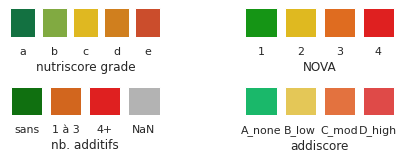

In [14]:
def plot_palettes():
    def plot_palette(palette: dict, ax=None, titre='palette', nb=0):
        pal = palette.keys()
        nb = len(pal) if nb == 0 else nb
        if ax is None:
            _, ax = plt.subplots(figsize=(nb, 1))
        g = sns.barplot(x=list(pal), y=np.ones(nb), palette=palette, ax=ax)
        g.set_xlabel(titre)
        g.axes.yaxis.set_visible(False)
        sns.despine(left=True, bottom=True)

    plt.subplots(2, 2, figsize=(7, 2))
    plot_palette(nutriscore_palette, ax=plt.subplot(3, 2, 1), titre='nutriscore grade')
    plot_palette(nova_palette, ax=plt.subplot(3, 2, 2), titre='NOVA')
    plot_palette(additive_palette, ax=plt.subplot(3, 2, 5), titre='nb. additifs')
    plot_palette(addiscore_palette, ax=plt.subplot(3, 2, 6), titre='addiscore')
    plt.subplots_adjust(wspace=0.5, hspace=0.3)

plot_palettes()
to_png('palettes de couleurs')



## 2.1 Import du dictionnaire de données

Le dictionnaire des données nettoyées a été enregistré en même temps que les données nettoyées

Il est utilisé pour assurer les données nettoyées sont interprétés correctement.


---

# 2. Import des données nettoyées

In [15]:
def drop_colonnes_sans_nom(df: pd.DataFrame):
    """Colonnes qui commencent par Unnamed sont en général les 'index' des dataframes
     produit par export pd.to_csv par défaut, sans interet"""
    unnamed_cols = list(df.columns[df.columns.str.startswith('Unnamed')])
    if len(unnamed_cols) > 0:
        return df.drop(unnamed_cols, axis=1)
    else:
        return df


In [16]:
DATA_DICT = os_path_join(OUT_FOLDER, CLEAN_DATA_DICT)
data_dict_df = (pd.read_csv(DATA_DICT, encoding='UTF-8', sep='\t')
                .pipe(drop_colonnes_sans_nom))

data_dict_df.head()


,column,count,unique,dtype,max_length
0,code,1555277,1555277.0,object,24.0
1,creator,1555274,13290.0,object,28.0
2,created_datetime,1555277,NaN,datetime64[ns],NaN
3,last_modified_datetime,1555277,NaN,datetime64[ns],NaN
4,product_name,1546101,1279206.0,object,166.0


#### 2.3.1.1 Supprime datetime types du dictionnaire

- (pd.read_csv n'accepte pas `datetime64[ns]` com dtype)


In [17]:
date_col_filter = data_dict_df['column'].str.endswith('_datetime')
date_cols = data_dict_df[date_col_filter]['column'].tolist()
print(date_cols)
data_dict_df = data_dict_df[~date_col_filter]
data_dict = dict(zip(data_dict_df['column'], data_dict_df['dtype'].values))
list(data_dict.items())[13:17]


['created_datetime', 'last_modified_datetime']


[('ingredients_that_may_be_from_palm_oil_n', 'Int64'),
 ('ingredients_that_may_be_from_palm_oil_tags', 'object'),
 ('nutriscore_score', 'float64'),
 ('nutriscore_grade', 'category')]

## 2.3.2 Import les données nettoyés 
- Spécifier **USE_SAMPLE** au début de ce notebook
- avec l'aide du dictionnaire de types 

In [18]:
DATA_FILE = CLEAN_DATA_SAMPLE if USE_SAMPLE else CLEAN_DATA_FILENAME 

CLEAN_DATA= os_path_join(OUT_FOLDER,DATA_FILE)

cleaned_data = pd.read_csv(CLEAN_DATA, sep='\t', header=0,
                           encoding='utf-8',
                           dtype=data_dict,
                           parse_dates=date_cols,
                           infer_datetime_format=True,
                           low_memory=True)  # Warning: dtypes

# Si on a oublié d'enregistrer les données nettoyées sans index,
# alors l'index est en colonne 'Unnamed: 0'
cleaned_data = cleaned_data.pipe(drop_colonnes_sans_nom)

In [19]:
cleaned_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1555277 entries, 0 to 1555276
Data columns (total 33 columns):
 #   Column                                                 Non-Null Count    Dtype         
---  ------                                                 --------------    -----         
 0   code                                                   1555277 non-null  object        
 1   creator                                                1555274 non-null  object        
 2   created_datetime                                       1555277 non-null  datetime64[ns]
 3   last_modified_datetime                                 1555277 non-null  datetime64[ns]
 4   product_name                                           1546101 non-null  object        
 5   brands_tags                                            925889 non-null   object        
 6   categories_en                                          772940 non-null   object        
 7   labels_en                                    

In [20]:
print(cleaned_data['nova_group'].dtype)
print(cleaned_data['nova_group'].count())
cleaned_data['nova_group'].value_counts()


category
558502


4.0    299233
3.0    115858
4       72172
1.0     60361
2.0     10330
3         535
1          13
Name: nova_group, dtype: int64

#### 2.3.2.2 Corriger le type de nova_group (pas une valeur numérique)


In [21]:
def corrigir_nova_group(df:pd.DataFrame):
    if not 'nova_group' in df.columns:
        return df
    print(df['nova_group'].dtype)
    print(df['nova_group'].count())
    # data_df['nova_group'].value_counts()
    df = df.copy()
    df['nova_group'] = df['nova_group'].astype(str)
    df['nova_group'] = df['nova_group'].str[0:1]
    df['nova_group'] = df['nova_group'].replace('n', np.nan)
    df['nova_group'] = df['nova_group'].astype('object')
    return df


cleaned_data = cleaned_data.pipe(corrigir_nova_group)
cleaned_data['nova_group'].value_counts()


category
558502


4    371405
3    116393
1     60374
2     10330
Name: nova_group, dtype: int64

#### 2.3.2.3 Convertir les types 'category' en 'object'
- C'est plus facil de filtre sur les colonnes de category si ils sont de type objet:
- certains operations ne sont pas possible s'ils sont catégorique:
`df=df[df['categorie_colonne'].fillna('').contains('meat')]`
- à faire plus tard: refaire les filtres pour accepter les colonnes catégoriques


In [22]:
def category_to_object(df: pd.DataFrame, subset=None):
    """
    Convertir les types 'category' en 'object'
    Plus simple pour des filtres via .fillna('') qui ne fonctionne pas
    Pandas groupby drop les NaN si le type d'un colonne est category, meme avec dropna=False
       Pour faire groupby avec group NaN (ex: calcule % du total), il faut convertir type category en objet
    """
    categ_cols = df.select_dtypes('category').columns.tolist()
    print(categ_cols)
    df = df.copy()
    if not subset is None:
        # convertir en type 'object' seulement les colonnes dans subset
        categ_cols = [col for col in categ_cols if col in subset]
    for col in categ_cols:
        df[col] = df[col].astype('object')
    return df

cleaned_data = cleaned_data.pipe(category_to_object)

# vérifier que les 'catégories' n'ont pas changés
cleaned_data['nova_group'].value_counts()


['nutriscore_grade', 'pnns_groups_1', 'pnns_groups_2']


4    371405
3    116393
1     60374
2     10330
Name: nova_group, dtype: int64

In [23]:
cleaned_data.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1555277 entries, 0 to 1555276
Columns: 33 entries, code to fruits-vegetables-nuts-estimate-from-ingredients_100g
dtypes: Int64(3), datetime64[ns](2), float64(10), object(18)
memory usage: 396.0+ MB


In [24]:
pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
pd.set_option('display.max_rows', 10)  # pour afficher max 10 lignes
pd.set_option('display.max_colwidth', 100)
cleaned_data.head(5)


,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
0,8851351974982,bank-pc,2020-07-29 06:33:46,2020-07-29 06:34:27,NaN,NaN,NaN,NaN,Thailand,"2Ouus-nauñihĀny (Ingredients) atNAIŠU (Whipping Cream) 31.80%, Ivlri (Egg) 25.50%, žuunNANSTÕILu...",49,"en:e110,en:e122,en:e124,en:e127,en:e133,en:e1404,en:e1442,en:e150a,en:e150c,en:e150d,en:e1520,en...","E110 - Sunset yellow FCF,E122 - Azorubine,E124 - Ponceau 4r,E127 - Erythrosine,E133 - Brilliant ...",0,NaN,3,"e433-monooleate-de-polyoxyethylene-de-sorbitane,e471-mono-et-diglycerides-d-acides-gras-alimenta...",NaN,NaN,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,8851351974807,bank-pc,2020-09-16 00:19:12,2020-09-16 00:21:32,Loading…,NaN,NaN,NaN,Thailand,"JUČNAŠU (Whipping Cream) 35.1%, Tăsaansolas (Strawberry Flavored Filling) 21.8%, douus:nouñ hany...",41,"en:e102,en:e110,en:e122,en:e124,en:e127,en:e133,en:e1442,en:e150c,en:e150d,en:e1520,en:e160a,en:...","E102 - Tartrazine,E110 - Sunset yellow FCF,E122 - Azorubine,E124 - Ponceau 4r,E127 - Erythrosine...",0,NaN,4,"e433-monooleate-de-polyoxyethylene-de-sorbitane,e471-mono-et-diglycerides-d-acides-gras-alimenta...",NaN,NaN,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,0708586288996,org-database-usda,2020-04-23 15:46:55,2020-04-23 15:46:56,Mini decadent desserts,NaN,"Biscuits and cakes,Cakes",NaN,United States,"Water, sugar, palm oil, high fructose corn syrup, corn syrup, cocoa (processed with alkali), mon...",39,"en:e102,en:e110,en:e129,en:e1400,en:e1520,en:e160b,en:e171,en:e202,en:e211,en:e220,en:e223,en:e2...","E102 - Tartrazine,E110 - Sunset yellow FCF,E129 - Allura red ac,E1400 - Dextrin,E1520 - Propylen...",0,NaN,0,NaN,17.0,d,4,Sugary snacks,Biscuits and cakes,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Cakes,1377.0,16.46,7.59,43.04,30.38,1.30,3.80,0.127,0.0
3,8858867805434,bank-pc,2019-10-15 01:57:07,2019-10-18 07:29:25,มันบดและแฮมชีสโทสต์แซนวิช,"7fresh,7เฟรช,7-11,ซีพี,cp","Sandwiches,Sandwiches filled with cold cuts,Cheese sandwiches,Ham sandwiches,Ham and cheese sand...",NaN,Thailand,ส่วนประกอบที่สำคัญโดยประมาณ ขนมปัง Juua 31.61 % 23.86 % 15.91 % 12.50% 9.09 % 7.03 % เชดด้าชีส ซ...,38,"en:e100,en:e1100,en:e1102,en:e1422,en:e1442,en:e150d,en:e160a,en:e160ai,en:e160b,en:e160c,en:e20...","E100 - Curcumin,E1100 - Alpha-Amylase,E1102 - Glucose oxidase,E1422 - Acetylated distarch adipat...",0,NaN,2,"e471-mono-et-diglycerides-d-acides-gras-alimentaires,e481-stearoyl-2-lactylate-de-sodium",16.0,d,4,Composite foods,Sandwiches,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Ham and cheese sandwiches,1140.0,15.90,10.20,22.70,4.55,3.41,9.09,0.511,0.0
4,8851351974845,bank-pc,2020-09-21 10:58:51,2020-09-22 14:23:36,บลูเบอร์รี่ชีสพาย,"ezysweet,อีซี่สวีท,7-11,cp,ซีพี","Pies,Sweet pies,Fruit tarts,Blueberry pies",NaN,Thailand,"Cream Cheese Flavored Whipping Cream 32.5%, Blueberry Filling 30.0%, Cracker 20.4%, Margarine 9....",37,"en:e110,en:e122,en:e133,en:e1400,en:e1442,en:e1518,en:e160a,en:e160aii,en:e170,en:e170i,en:e211,...","E110 - Sunset yellow FCF,E122 - Azorubine,E133 - Brilliant blue FCF,E1400 - Dextrin,E1442 - Hydr...",0,NaN,2,"e471-mono-et-diglycerides-d-acides-gras-alimentaires,e472e-ester-monoa

---

# 3. Analyses univariées<a name="analyses_univariees"></a>


## 3.1 Bibliothèque de fonctions communes

Cette section contient les fonctions utilisées par plusieurs analyses:
- fonctions pour 'exploser' les colonnes de tags (pays, additives_tags, categories...)
- filtres
  - par les tags plus frequents
  - par pays, année, groupe
  - par catégorie dans un liste de catégories (exemple additifs in additifs_haut_risque)
- groupe par année (effectif / fréquence / % total par année)

- tests statistiques
  - normalité 
  - homoscedascité
  - F-ANOVA / t-tests
  - H-ANOVA / U-tests  (non-parametrique)
  - Tukey analyse post hoc


### 3.1.1 Explode series/dataframe; effectif/ fréquence
- explode series / explode frame (pour les colonnes des tags)
- effectif / fréquence (filtre_par_top_freq)

In [25]:
def is_category(df: pd.DataFrame, col: str) -> bool:
    """Determiner si un variable est catégorique ou non"""
    return len(df[[col]].select_dtypes('category').columns.tolist()) > 0


cleaned_data.pipe(is_category, 'nova_group')


False

In [26]:
def explode_series(series) -> pd.Series:
    """convertir ['a,b,c','d,e','f']--> ['a','b','c','d','e','f']  """
    if series.str.contains(',').any():
        return series.str.split(',').explode()
    else:
        return series.explode()


cleaned_data['additives_en'].dropna().head(2).pipe(explode_series)


0                         E110 - Sunset yellow FCF
0                                 E122 - Azorubine
0                                E124 - Ponceau 4r
0                               E127 - Erythrosine
0                        E133 - Brilliant blue FCF
                         ...                      
1        E475 - Polyglycerol esters of fatty acids
1    E477 - Propane-1‚2-diol esters of fatty acids
1                     E491 - Sorbitan monostearate
1                         E500 - Sodium carbonates
1               E640 - Glycine and its sodium salt
Name: additives_en, Length: 102, dtype: object

In [27]:
def explode_frame(df: pd.DataFrame, col=None):
    """Convertir une colonne à une liste, puis exploser la dataframe sur cette colonne"""
    df = df.copy()
    if col is None:
        col = df.columns.to_list()[0]
    df[col] = df[col].str.split(',')
    return df.explode(col)

# test
(cleaned_data[['additives_tags', 'brands_tags']].dropna().head(5)
 .pipe(explode_frame, 'additives_tags')).head()


,additives_tags,brands_tags
3,en:e100,"7fresh,7เฟรช,7-11,ซีพี,cp"
3,en:e1100,"7fresh,7เฟรช,7-11,ซีพี,cp"
3,en:e1102,"7fresh,7เฟรช,7-11,ซีพี,cp"
3,en:e1422,"7fresh,7เฟรช,7-11,ซีพี,cp"
3,en:e1442,"7fresh,7เฟรช,7-11,ซีพี,cp"


In [28]:
def filtre_par_top_freq(df:pd.DataFrame, col, nb=10, others=True) -> pd.Series:
    """Filtre les registres par les plus frequent top n tags de la colonne col,
       plus les autres dans catégorie 'other'
       Marche pour colonnes categoriques et colonnes de tags
    """
    nb = max(1, nb)
    top = explode_series(df[col]).value_counts()[:nb]
    if others:
        return df[col].where(df[col].isna() | df[col].isin(top.index), other='other')
    else:
        return df[col].where(df[col].isna() | df[col].isin(top.index))

cleaned_data.pipe(filtre_par_top_freq, col='additives_tags', nb=6).value_counts()


other      339826
en:e330     22095
en:e415      4461
en:e322      2227
en:e471      1477
en:e500       602
Name: additives_tags, dtype: int64

In [29]:
def top_n_freq(df:pd.DataFrame, col, nb=10, others=True, normalize=False):
    """
    Conter la fréquence des n tags plus fréquents
    return: value_counts comme un dataframe
    """
    nb = max(1, nb)
    counts_df = (explode_series(df[col]).value_counts(normalize=normalize)
            .to_frame(name='freq')
            .rename_axis(col)
    )
    nb=min(nb,len(counts_df))
    top_n=counts_df.head(nb).copy()
    if others:
        top_n.loc['other', 'freq']= counts_df.iloc[nb:,0].sum()
    return top_n.reset_index()    


print (cleaned_data['creator'].value_counts(normalize=True)[:5])
cleaned_data.pipe(top_n_freq, col='creator', nb=5,
                  others=True, normalize=True)

kiliweb                       0.564938
usda-ndb-import               0.100212
openfoodfacts-contributors    0.082841
org-database-usda             0.058446
foodvisor                     0.017056
Name: creator, dtype: float64


,creator,freq
0,kiliweb,0.564938
1,usda-ndb-import,0.100212
2,openfoodfacts-contributors,0.082841
3,org-database-usda,0.058446
4,foodvisor,0.017056
5,other,0.176508


### 3.1.2 Top n fréquence - bar charts


"1-1-2_Top_pays_répresentés_dans_les_produits.png"


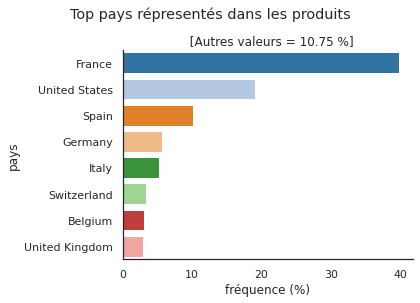

In [30]:
def plot_bar_top_n(df:pd.DataFrame, col, nb=20, others=True, normalize=False, sort_values=False, palette=None,
                   ylabel=None, titre='', soustitre=''):
    data = top_n_freq(df, col, nb, others, normalize).copy()
    # print(data.columns.to_list())
    other_count = 0
    if others:
        filter_other = data[col] == 'other'
        other_count = data[filter_other]['freq'].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data[col], x=data['freq'] * 100, palette=palette)
        ax.set_xlabel('fréquence (%)')
    else:
        ax = sns.barplot(y=data[col], x=data['freq'], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        else: other_count=f'{int(other_count)}'     
        autres = f' [Autres valeurs = {other_count}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


cleaned_data.pipe(plot_bar_top_n, col='countries_en', nb=8,
                  titre='Top pays répresentés dans les produits',
                  ylabel='pays', normalize=True)
to_png('1.1.2')


"Top_pays_répresentés_dans_les_produits_avec_info_sur_les_additifs.png"


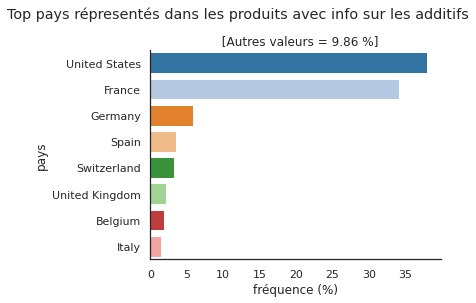

In [31]:
cleaned_data.dropna(subset=['additives_n']).pipe(plot_bar_top_n, col='countries_en', nb=8,
                                                 titre='Top pays répresentés dans les produits avec info sur les additifs',
                                                 ylabel='pays', normalize=True)
to_png()


### 3.1.3 Filtres
- colonnes dans dataframe
- filtre par tag (filtre générique)
- filtre par pays
- filtre par an
- filtre par catégorie dans une liste (multifiltre)


In [32]:
print(list(cleaned_data.columns))


['code', 'creator', 'created_datetime', 'last_modified_datetime', 'product_name', 'brands_tags', 'categories_en', 'labels_en', 'countries_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


In [33]:
def cols_in_df(df: pd.DataFrame, colonnes: list = None) -> list:
    """Procedure pour identifier les colonnes existantes dans le dataframe"""
    ret_cols = []
    for col in colonnes:
        if col in df.columns:
            ret_cols.append(col)
    return ret_cols


cols_in_df(cleaned_data, ['additives_tags',
                          'additives_en', 'brands', 'brands_tags'])


['additives_tags', 'additives_en', 'brands_tags']

In [34]:
def print_df_head(df, nb=10):
    """utilitaire pour imprimer dans un pipeline"""
    print (df.head(nb))
    return df

def print_df_shape(df):
    """utilitaire pour imprimer le shape dans un pipeline"""
    print (df.shape)
    return df

#### Filtre générique


In [35]:
def filter_by_tag(df: pd.DataFrame, tag_col='countries_en', tag='France'):
    return df[df[tag_col].fillna('').str.contains(tag, case=False, regex=True)]


cleaned_data.pipe(filter_by_tag, 'additives_en', 'titanium dioxide')[
    'additives_en'].count()


8999

##### Couverture de brands (exemple 'Carrefour') 
"Carrefour est dédié aux grandes courses : un assortiment de **20 000 à 80 000** références de produits"

- <https://www.carrefour.com/fr/groupe/points-de-vente>

On voit que Carrefour a enregistré 1000 réferences de produits dans la base entière
- C'est la seule chaine de supermarchés qui a contribué à OpenfoodFacts à présent


In [36]:
nb_cree=cleaned_data.pipe(filter_by_tag,'creator', 'carrefour')['creator'].count()

nb_brands=cleaned_data.pipe(filter_by_tag, 'brands_tags','carrefour')['brands_tags'].count()

print (f'Carrefour: nb. produits crées: {nb_cree}; nb. brands = {nb_brands}')

Carrefour: nb. produits crées: 1065; nb. brands = 17156


#### Filtre par NOVA groupe

In [37]:
def filter_by_nova_group(df:pd.DataFrame, nova_group=4):
    if nova_group is None:
        return df
    return df[df['nova_group'].astype(str) == str(nova_group)]


print(cleaned_data.pipe(filter_by_nova_group, 4).shape)

(371405, 33)


#### Filtre par pays


In [38]:

def filter_by_country(df:pd.DataFrame, country='France'):
    return filter_by_tag(df, 'countries_en', tag=country)


print(cleaned_data.pipe(filter_by_country, 'France').shape)
print(cleaned_data.pipe(filter_by_country, 'United States').shape)


(658244, 33)
(314216, 33)


"Top_additifs_répresentés_dans_les_produits.png"


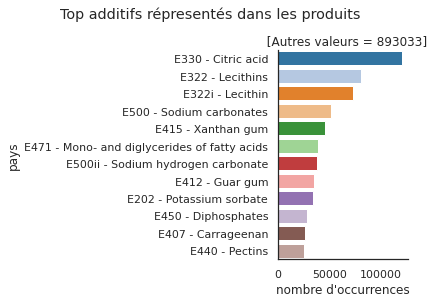

In [39]:
(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(plot_bar_top_n, col='additives_en', nb=12,
       titre='Top additifs répresentés dans les produits',
       ylabel='pays', normalize=False)
 )
to_png()


#### Filtre par an


In [40]:
from datetime import datetime


def filter_by_year(df:pd.DataFrame, start=2012, end=None, col='last_modified_datetime'):
    if end is None:
        end = start
    if end < start:
        swap = start
        start = end
        end = swap
    debut = datetime(start, 1, 1)
    fin = datetime(end + 1, 1, 1)
    return df[(df[col] >= debut) & (df[col] <= fin)]
    # plus lent :
    # return df[df[col].dt.year >=start & df[col].dt.year <=end]


def filter_by_year_last_modified(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='last_modified_datetime')


def filter_by_year_created(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='created_datetime')


cleaned_data.pipe(filter_by_year_last_modified, 2017)[
    'created_datetime'].dt.year.value_counts()


2017    27168
2016     1620
2015      859
2014      334
2013      305
2012      125
Name: created_datetime, dtype: int64

#### Filtre par catégorie in list


In [41]:
def filter_by_categorie_in(df:pd.DataFrame, categ_col='pnns_groups_1', categs=None):
    return df[df[categ_col].fillna('').isin(categs)]


cleaned_data.pipe(filter_by_categorie_in, 'pnns_groups_1',
                  ['Sugary snacks', 'Salty snacks']).shape


(165269, 33)

#### Filtre par tags in list

### 3.1.4 Groupby fonctions (groupby year, ...)

In [42]:
def col_group_by_year(df: pd.DataFrame, col=None, groupby_var='nutriscore_grade', aggfunc='mean',
                      date_col='created_datetime'):
    """visualiser l'évolution dans le temps, basé sur date_col"""
    df = df.copy()
    if aggfunc in ['mean', 'max', 'min']:
        df[col] = df[col].astype(float)

    if groupby_var is None:
        groupby_year = pd.pivot_table(df,
                                      values=col,
                                      index=[df[date_col].dt.year],
                                      aggfunc={col: aggfunc},
                                      fill_value='na', margins=False, margins_name='Total', observed=False)
    else:
        groupby_year = (pd.pivot_table(df,
                                       values=col,
                                       index=[groupby_var,
                                              df[date_col].dt.year],
                                       columns=None,
                                       aggfunc={col: aggfunc},
                                       fill_value='na', margins=False, margins_name='Total', observed=False)
                        .unstack(level=0)
                        # Reduire le nombre de niveaux sur colonnes
                        .droplevel(0, axis='columns')
                        )

    return groupby_year


print('moyenne nb. additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc='mean')
        .style.background_gradient().set_precision(2)
)

moyenne nb. additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,0.51,1.56,1.79,2.01,2.26
2013,0.58,1.52,1.70,2.24,2.46
2014,0.77,1.49,2.00,2.36,2.47
2015,0.74,1.66,2.06,2.51,2.51
2016,0.69,1.41,1.75,2.30,2.24
2017,0.75,1.70,2.01,2.88,3.19
2018,0.64,1.37,1.61,2.05,2.00
2019,0.74,1.31,1.66,2.14,2.18
2020,0.95,2.10,2.47,3.32,3.88


In [43]:
print('nb. produits avec additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc=lambda x: (x > 0).sum())
)


nb. produits avec additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,168,236,319,400,384
2013,409,496,815,1034,855
2014,518,589,1224,1540,1079
2015,1218,1536,2705,3613,2939
2016,1340,1721,3197,4437,3430
2017,9157,10822,20617,36201,24937
2018,2490,4021,7524,11060,8883
2019,1967,2749,4931,6702,4691
2020,6043,7864,13628,22821,15541


### 3.1.5 Tests de normalité


In [44]:
def format_stat_p(stat, p, name=None):
    ch = f'{name} : ' if name else ''
    ch += f'stat={stat:.3f}, p={p:.3f}'
    if p < 0.001:
        ch += '***'
    elif p < 0.01:
        ch += '**'
    elif p < 0.05:
        ch += '*'
    return ch


def print_normal_stat_p(testname:str, stat:float, p:float, alpha=0.05)->None:
    """"Créer une chaine pour répondre à un test de normalité"""
    ch = format_stat_p(stat, p, testname)
    # reject H0 if p<=0.05
    if p > alpha:
        ch = f'{ch} : accept H0: probablement Gaussian'
    else:
        ch = f'{ch} : reject H0: probablement pas Gaussian'
    print(ch)

#### 3.1.5.1 Shapiro-Wilk test (sample size < 100)

In [45]:
from scipy.stats import shapiro
from scipy.stats import f_oneway


def test_shapiro(series, alpha=0.05):
    """Shapiro-Wilk test (1965)"""
    stat, p = shapiro(series)
    print_normal_stat_p(f'Shapiro-Wilk [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Shapiro-Wilk')


test_shapiro(cleaned_data['nutriscore_score'].dropna())


Shapiro-Wilk [nutriscore_score] : stat=0.976, p=0.000*** : reject H0: probablement pas Gaussian


/usr/local/lib/python3.7/dist-packages/scipy/stats/morestats.py:1676: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


(0.0, 'Shapiro-Wilk : stat=0.976, p=0.000***')

#### 3.1.5.1 Kolmogorov-Smirnov goodness of fit test
- tests the distribution F(x) of an observed random variable against the normal distribution
- can be used to test against other distributions

In [46]:
# Kolmogorov-Smirnov goodness of fit test
# tests the distribution F(x) of an observed random variable against the normal distribution
from scipy.stats import kstest


def test_kolmogorov_smirnov(series, alpha=0.05):
    stat, p = kstest(series, 'norm')
    print_normal_stat_p(f'Kolmogorov-Smirnov [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Kolmogorov-Smirnov')

sample_size=min(100, len(cleaned_data['nutriscore_score'].dropna()))
test_kolmogorov_smirnov(cleaned_data['nutriscore_score'].dropna().sample(sample_size))

Kolmogorov-Smirnov [nutriscore_score] : stat=0.717, p=0.000*** : reject H0: probablement pas Gaussian


(1.3057947237995682e-52, 'Kolmogorov-Smirnov : stat=0.717, p=0.000***')

In [47]:
def test_normality(series, alpha=0.05):
    s = series.astype(float).dropna()
    if len(s) <3:
        # il faut au moins 3 points
        return
    if len(s) < 50:
        p, ch = test_shapiro(s)
    else:
        p, ch = test_kolmogorov_smirnov(s)
    if p > alpha:
        choix = 'accept H0: probablement Gaussian'
    else:
        choix = 'reject H0: probablement pas Gaussian'
    return p, ch, choix

nb=len(cleaned_data)
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,20)))
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,80)))
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,800)))


Shapiro-Wilk [nutriscore_score] : stat=0.962, p=0.809 : accept H0: probablement Gaussian
Shapiro-Wilk [nutriscore_score] : stat=0.949, p=0.207 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [nutriscore_score] : stat=0.714, p=0.000*** : reject H0: probablement pas Gaussian


(8.0968251827891795e-165,
 'Kolmogorov-Smirnov : stat=0.714, p=0.000***',
 'reject H0: probablement pas Gaussian')

### 3.1.6 Tests de homoscédasticité (égalité de variance)
#### 3.1.6.1 Bartlett test (samples avec distribution normale)
#### 3.1.6.2 Levene test (samples sans distribution normale)

In [48]:
from scipy.stats import bartlett, levene


def test_bartlett(groups: list, alpha=0.05):
    """A parametric test for equality of k variances for normally distributed groups"""
    stat, p = bartlett(*groups)
    ch = format_stat_p(stat, p, 'Bartlett homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Bartlett test, accept H0: groups have similar variance'
    else:
        choix = 'Bartlett test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def test_levene(groups: list, alpha=0.05):
    """A robust parametric test for equality of k variances when group samples are not normally distributed"""
    # *groups = list comprehension
    stat, p = levene(*groups)
    ch = format_stat_p(stat, p, 'Levene homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Levene test, accept H0: groups have similar variance'
    else:
        choix = 'Levene test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def group_by_groups(df: pd.DataFrame, y_var: str, groups_var: str):
    data = df[[y_var, groups_var]].dropna()
    data[y_var] = data[y_var].astype(float)  # certain tests n'accepte pas type int
    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))
    return groups


def get_grp_size(groups):
    group_sizes = [len(g) for g in groups]
    return f'(n={np.sum(group_sizes)}), {group_sizes}'


def test_homoscedascity(groups: list, normality=False, alpha=0.05):
    print(f'test_homoscedascity : {get_grp_size(groups)}')
    test_fn = test_bartlett if normality else test_levene
    return test_fn(groups, alpha)


def testing_variances(df:pd.DataFrame):
    def test_homoscedascity_groupby(df, y_var, groups_var, normality=False):
        print(f'Test Homoscedascity, {y_var} grouped by {groups_var}, normality = {normality}')
        groups = group_by_groups(df, y_var, groups_var)
        return test_homoscedascity(groups, normality)


    large_sample = df[['nutriscore_score', 'nova_group']].dropna()
    large_sample = large_sample.sample(min(len(large_sample),600))
    small_sample = large_sample.sample(int(len(large_sample)/4))
    print(f'---- Small sample (n={len(small_sample)}) -----------')

    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    print(f'---- Large sample (n={len(large_sample)}) -----------')
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    return None


cleaned_data.pipe(testing_variances)

---- Small sample (n=150) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=150), [22, 1, 37, 90]
Bartlett homoscédasticité : stat=nan, p=nan
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=150), [22, 1, 37, 90]
Levene homoscédasticité : stat=2.082, p=0.105
Levene test, accept H0: groups have similar variance
---- Large sample (n=600) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=600), [79, 5, 145, 371]
Bartlett homoscédasticité : stat=23.853, p=0.000***
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=600), [79, 5, 145, 371]
Levene homoscédasticité : stat=10.187, p=0.000***
Levene test, reject H0: variance of groups is not equal


/usr/local/lib/python3.7/dist-packages/scipy/stats/morestats.py:2242: RuntimeWarning: divide by zero encountered in true_divide
  denom = 1.0 + 1.0/(3*(k - 1)) * ((np.sum(1.0/(Ni - 1.0), axis=0)) -


### 3.1.7 Tests ANOVA (1-way)

- H0 : Les moyennes de variable quantitative y sont les mêmes entre les catégories x
- H1 : Les moyennes de variable quantitative y ne sont pas les mêmes entre les catégories x



#### 3.1.7.1 ANOVA pré-requisites
1. les observations sont independent
2. La variable dependant (y) est distribuée normalement pour chaque catégorie (Normalité)
3. L'écart-type est la même pour chaque catégorie (Homoscédasticité)

Si les 3 conditions sont valides, alors les valeurs F et p d'ANOVA sont valables.

Sinon, on essaie de faire H-ANOVA en utilisant les tests Kruskal-Wallis.

- Test de normalité : Shapiro-Wilk
- Test de homoscédasticité : Bartlett (si normalité), ou Levene(distributions pas normales)

#### 3.1.7.2 References

- <https://www.pythonfordatascience.org/anova-python/>
- <https://www.marsja.se/four-ways-to-conduct-one-way-anovas-using-python/>
- <https://www.analyticsvidhya.com/blog/2020/06/introduction-anova-statistics-data-science-covid-python/>


#### 3.1.7.3 ANOVA summary

In [49]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scipy.stats import probplot


def anova_table_r(df:pd.DataFrame, groups_var, y_var):
    """get ANOVA table as R like output"""
    # Ordinary Least Squares (OLS) model
    data = df[[groups_var, y_var]].dropna()

    # ols("outcome_variable ~ C(independent_variable)", data= data_frame).fit()
    model = smf.ols(f'{y_var} ~ C({groups_var})', data=data).fit()

    anova_table = sm.stats.anova_lm(model, typ=2)
    print('----ANOVA table (R like)-------')
    print(anova_table)
    print('----ANOVA summary  ------------')
    print(model.summary())
    print('----Shapiro summary  ------------')
    test_shapiro(model.resid.rename('resid'))

    _ = plt.figure(figsize=(4, 4))
    # ax = fig.add_subplot(111)

    normality_plot, stat = probplot(model.resid, plot=plt, rvalue=True)
    plt.gca().set_title("Probability plot of model residual's", fontsize=14)
    plt.show()

    return anova_table


#### 3.1.7.4 T-test
- quand il y a seulement 2 groupes d'observations qui sont distribués normalement
- Null Hypothesis H0: Les 2 groupes vient de la meme population

Si les 2 groupes ne sont pas distribués normalement, il faut utiliser un test non-parametric
- par exemple, Wilcoxon–Mann–Whitney U test

### Hypothese H0: le nutriscore_score de France et Etats Unis viennent de la même population
- H1: Les nutriscore_scores de France et Etats Unis n'ont pas la même distribution

On suppose que la distribution de nutriscore_score est normal pour faire un t-test pour cet exemple
- En fait: on utilise le test equivalent non-paramétrique (U-test) ci-dessous


In [50]:
from scipy.stats import ttest_ind


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html

def exemple_t_test(df:pd.DataFrame):
    """Exemple de comment faire un t-test (test normalité avant)"""

    def format_ch(p, alpha):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    # Probablement la variance de nutriscore est égal pour les 2 groupes - il faut tester
    stat, p, ch, choix = test_homoscedascity([group1, group2], normality=True, alpha=0.05)
    equal_var = (p > 0.05)
    alpha = 0.05

    if equal_var:
        stat, p = ttest_ind(group1, group2, equal_var=True)
        print(f"Standard t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")
    else:
        # T-test entre 2 groupes avec variances non-egales
        stat, p = ttest_ind(group1, group2, equal_var=False)
        print(f"Welch's t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_t_test)

test_homoscedascity : (n=453592), [255661, 197931]
Bartlett homoscédasticité : stat=127.609, p=0.000***
Bartlett test, reject H0: variance of groups is not equal
Welch's t-test, stat=2.710, p=0.007**, reject H0: ils ne sont pas la même population


### 3.1.8 Non-parametric ANOVA (Kruskal-Wallis)

Utilise si les conditions de normalité et homoscédascité ne sont pas valides

Used to test the null hypothesis which states that ‘k’ number of samples has been drawn from the same population or the identical population with the same or identical median.

- The null hypothesis (H0): la median is equal across all groups.
- The alternative hypothesis: (H1): The median is not equal across all groups.

#### 3.1.8.1 References

- <https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html>
- <https://www.statology.org/kruskal-wallis-test-python/>
- <https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/>
- <https://stats.stackexchange.com/questions/33759/do-we-need-to-report-the-median-or-the-mean-when-using-a-kruskal-wallis-test>


In [51]:
from scipy.stats import kruskal


def test_kruskal(groups: list, showsize=False):
    """Kruskal-Wallis H-test"""
    if showsize: print(f'{get_grp_size(groups)}')
    # compare samples (* = list comprehension)
    stat, p = kruskal(*groups)
    ch = format_stat_p(stat, p, 'Kruskal-Wallis H-test')
    print(ch)
    # interpret
    alpha = 0.05
    if p > alpha:
        choix = 'les médianes ne sont pas significativement différentes, (fail to reject H0)'
    else:
        choix = 'les médianes sont significativement différentes (reject H0)'
    print(choix)
    return p, ch, choix


def test_kruskal_groupby(df:pd.DataFrame, y_var, groups_var):
    print(f'Test Kruskal , {y_var} grouped by {groups_var}')
    groups = group_by_groups(df, y_var, groups_var)
    return test_kruskal(groups, True)


# cleaned_data.pipe(test_kruskal_groupby,'nutriscore_score','pnns_groups_1')
sample_size=min(200,len(cleaned_data))
cleaned_data.sample(sample_size).pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')
_ = cleaned_data.pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')


Test Kruskal , nutriscore_score grouped by nova_group
(n=50), [5, 1, 5, 39]
Kruskal-Wallis H-test : stat=11.802, p=0.008**
les médianes sont significativement différentes (reject H0)
Test Kruskal , nutriscore_score grouped by nova_group
(n=414121), [45235, 5376, 98888, 264622]
Kruskal-Wallis H-test : stat=71787.414, p=0.000***
les médianes sont significativement différentes (reject H0)


#### 3.1.8.2 (Wilcoxon) Mann–Whitney U test
- quand il y a seulement 2 groupes d'observations qui ne sont pas distribués normalement
- les 2 groupes peuvent avoir n'importe quel distribution
- Null Hypothesis H0: Les 2 groupes vient de la meme population (le médiane est la même)

In [52]:
from scipy.stats import mannwhitneyu


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html

def exemple_u_test(df:pd.DataFrame):
    """Exemple de comment faire un U-test (reject normalité avant)"""

    def format_ch(p, alpha=0.05):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    alpha = 0.05
    stat, p = mannwhitneyu(group1, group2)
    print(f"Mann-Whitney U-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_u_test)

Mann-Whitney U-test, stat=25217925560.000, p=0.028*, reject H0: ils ne sont pas la même population


#### 3.1.8.3 Effect Size (eta-squared)
(partial) eta-carré est la proportion de la variance représentée par un facteur.

Certaines règles empiriques sont que

- η2 > 0,01 indique un petit effet
- η2 > 0,06 indique un effet moyen
- η2 > 0,14 indique un effet important

(source:<https://www.spss-tutorials.com/anova-what-is-it/>)

In [53]:
def eta_squared(x: pd.Series, y: pd.Series):
    """Calcul du Coefficient of Determination
       example:
          eta2 = eta_squared(x=df[group_var], y= df[y_var])
       x = variable catégorique, y = variable dependant
    """
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x == classe]
        # print(f'classe : {classe}, mean={yi_classe.mean()}')
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    # Total sum of squares = Somme Carré Total
    sct = sum([(yj - moyenne_y) ** 2 for yj in y])
    # Estimated sum of squares = Somme Carré Estimé
    sce = sum([c['ni'] * (c['moyenne_classe'] - moyenne_y) ** 2 for c in classes])

    # Residual sum of squares
    scr = sct - sce
    # degrees of freedom, dof (Total, Estimated, Residual)
    dof_t = y.count() - 1
    dof_e = len(classes) - 1
    dof_r = dof_t - dof_e
    f_value = (sce / dof_e) / (scr / dof_r)
    print(f'f_value: {f_value:.3f}')
    eta2 = sce / sct
    if eta2 > 0.14:
        effet = 'important'
    elif eta2 > 0.06:
        effet = 'moyen'
    elif eta2 > 0.01:
        effet = 'petit'
    else:
        effet = 'insignifiant'
    print(f'η2 = {eta2:.3f}, effet {effet}')
    return eta_squared


def test_eta_squared(df:pd.DataFrame):
    print('effet de nova_group sur nutriscore_score')
    df = df[['nutriscore_score', 'nova_group']].dropna()
    eta_squared(x=df['nova_group'], y=df['nutriscore_score'])

cleaned_data.pipe(test_eta_squared)

effet de nova_group sur nutriscore_score
f_value: 28882.330
η2 = 0.173, effet important


### 3.1.9 Tukey post-hoc test

-Tukey's range test to compare means of all pairs of groups

- <https://en.wikipedia.org/wiki/Tukey%27s_range_test>


In [54]:
import statsmodels.stats.multicomp as mc


def get_pairwise_tukey_table(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    tukey = post_hoc_res.summary()
    return pd.DataFrame(tukey.data[1:], columns=tukey.data[0])

print('nutriscore grouped by nova group')
# cleaned_data.pipe(get_pairwise_tukey_table,y_var='nutriscore_score', groups_var='addiscore_risk',)
cleaned_data.pipe(get_pairwise_tukey_table,
                  y_var='nutriscore_score', groups_var='nova_group')


nutriscore grouped by nova group
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)


,group1,group2,meandiff,p-adj,lower,upper,reject
0,1,2,13.0357,0.001,12.7344,13.3370,True
1,1,3,8.6776,0.001,8.5591,8.7962,True
2,1,4,11.9325,0.001,11.8262,12.0388,True
3,2,3,-4.3580,0.001,-4.6505,-4.0655,True
4,2,4,-1.1032,0.001,-1.3909,-0.8154,True
5,3,4,3.2549,0.001,3.1770,3.3327,True


#### 3.1.9.1 Tukey - Visualise les differences entre les moyennes des groupes


----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2  13.0357 0.001 12.7344  13.337   True
     1      3   8.6776 0.001  8.5591  8.7962   True
     1      4  11.9325 0.001 11.8262 12.0388   True
     2      3   -4.358 0.001 -4.6505 -4.0655   True
     2      4  -1.1032 0.001 -1.3909 -0.8154   True
     3      4   3.2549 0.001   3.177  3.3327   True
---------------------------------------------------
"anova_nutriscore_score_by_nova_group_pairwise_tukey.png"


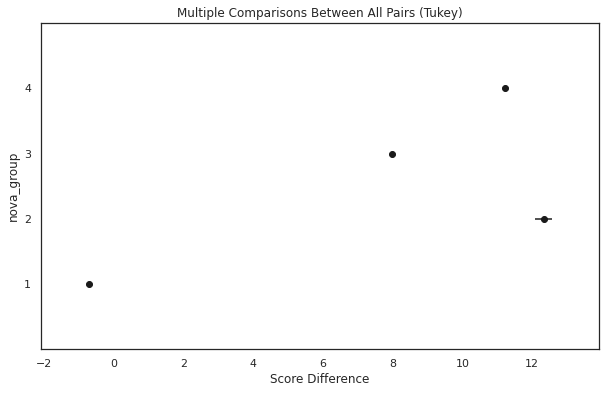

In [55]:

def plot_pairwise_tukey(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    print(post_hoc_res.summary())
    post_hoc_res.plot_simultaneous(
        ylabel=f'{groups_var}', xlabel=f'Score Difference')
    to_png(f'anova_{y_var}_by_{groups_var}_pairwise_tukey')
    plt.show()


cleaned_data.pipe(plot_pairwise_tukey,
                  y_var='nutriscore_score', groups_var='nova_group')



### 3.1.10 Fonctions graphiques

In [56]:

def add_text(ax, x, y, s, **kwargs):
    """Ajouter du texte à un plot"""
    ax.text(x, y, s,
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes, **kwargs)

### 3.1.11 Dictionnaires de traductions
Pour afficher les catégories d'alimentation en français 
- PNNS groups 1
- PNNS groups 2

In [57]:
pnns_1_en = list(cleaned_data['pnns_groups_1'].dropna().unique())
print(pnns_1_en)

pnns_2_en = list(cleaned_data['pnns_groups_2'].dropna().unique())
print(pnns_2_en)


['Sugary snacks', 'Composite foods', 'Cereals and potatoes', 'Fish Meat Eggs', 'Salty snacks', 'Milk and dairy products', 'Fruits and vegetables', 'Fat and sauces', 'Beverages', 'Alcoholic beverages', 'sugary-snacks']
['Biscuits and cakes', 'Sandwiches', 'Bread', 'Sweets', 'One-dish meals', 'Fish and seafood', 'Appetizers', 'Ice cream', 'Fruits', 'Cereals', 'Cheese', 'Pizza pies and quiches', 'Chocolate products', 'Pastries', 'Milk and yogurt', 'Processed meat', 'Potatoes', 'Salty and fatty products', 'Dressings and sauces', 'Dairy desserts', 'Artificially sweetened beverages', 'Meat', 'Fats', 'Vegetables', 'Alcoholic beverages', 'Breakfast cereals', 'Sweetened beverages', 'Eggs', 'Nuts', 'Dried fruits', 'Soups', 'Plant-based milk substitutes', 'Fruit juices', 'Unsweetened beverages', 'Waters and flavored waters', 'Legumes', 'pastries', 'Offals', 'Teas and herbal teas and coffees', 'Fruit nectars']


In [58]:
# Traduction Google puis figer les listes

pnns_1_en= ['Sugary snacks', 'sugary-snacks', 'Composite foods', 'Cereals and potatoes', 'Fish Meat Eggs', 'Salty snacks', 
            'Milk and dairy products', 'Fruits and vegetables', 'Fat and sauces', 'Beverages', 'Alcoholic beverages']

pnns_1_fr = ['Snacks sucrés', 'Snacks sucrés','Aliments composés','Céréales et pommes de terre','Oeufs viandes et poisson','Snacks salés',
             'Lait et produits laitiers','Fruits et légumes', 'Matières grasses et sauces','Boissons','Boissons alcoolisées']

pnns_2_en = ['Biscuits and cakes', 'Sandwiches', 'Bread', 'Sweets', 'One-dish meals', 'Fish and seafood', 'Appetizers', 'Ice cream',
             'Fruits', 'Cereals', 'Cheese', 'Pizza pies and quiches', 'Chocolate products', 'Pastries', 'Milk and yogurt', 'Processed meat', 
             'Potatoes', 'Salty and fatty products', 'Dressings and sauces', 'Dairy desserts', 'Artificially sweetened beverages', 
             'Meat', 'Fats', 'Vegetables', 'Alcoholic beverages', 'Breakfast cereals', 'Sweetened beverages', 'Eggs', 'Nuts', 'Dried fruits',
             'Soups', 'Plant-based milk substitutes', 'Fruit juices', 'Unsweetened beverages', 'Waters and flavored waters', 
             'Legumes', 'pastries', 'Offals', 'Teas and herbal teas and coffees', 'Fruit nectars']             


pnns_2_fr = ['Biscuits et gâteaux','Sandwichs','Pain', 'Confiseries','Plats simples','Poissons et fruits de mer','Apéritifs','Glaces',
             'Fruits','Céréales','Fromage', 'Pizzas et quiches','Produits chocolatés','Pâtisseries','Lait et yaourt', 'Viandes transformées',
             'Pommes de terre','Produits salés et gras','Garnitures et sauces', 'Desserts lactés','Boissons artificiellement sucrées',
             'Viande','Matières grasses','Légumes','Boissons alcoolisées','Céréales pour le petit-déjeuner',  'Boissons sucrées','Oeufs','Noix', 'Fruits secs', 
             'Soupes','Substituts de lait végétal','Jus de fruits','Boissons non sucrées', 'Eaux et eaux aromatisées',
             'Légumineuses','Pâtisseries','Abats','Thés tisanes et cafés', 'Nectars de fruits']

In [59]:
pnns1_dict = dict(zip(pnns_1_en, pnns_1_fr))
pnns2_dict = dict(zip(pnns_2_en, pnns_2_fr))
# print (pnns1_dict)
# print (pnns2_dict)

In [60]:
def traduire_categories(categories: list, feature_group=None) -> list:
    if feature_group == 'pnns_groups_1':
        return [pnns1_dict[x] for x in categories]
    else:
        # feature_group == 'pnns_groups_2':
        return [pnns2_dict[x] for x in categories]


print(traduire_categories(pnns_1_en, 'pnns_groups_1'))
print(traduire_categories(pnns_2_en))


['Snacks sucrés', 'Snacks sucrés', 'Aliments composés', 'Céréales et pommes de terre', 'Oeufs viandes et poisson', 'Snacks salés', 'Lait et produits laitiers', 'Fruits et légumes', 'Matières grasses et sauces', 'Boissons', 'Boissons alcoolisées']
['Biscuits et gâteaux', 'Sandwichs', 'Pain', 'Confiseries', 'Plats simples', 'Poissons et fruits de mer', 'Apéritifs', 'Glaces', 'Fruits', 'Céréales', 'Fromage', 'Pizzas et quiches', 'Produits chocolatés', 'Pâtisseries', 'Lait et yaourt', 'Viandes transformées', 'Pommes de terre', 'Produits salés et gras', 'Garnitures et sauces', 'Desserts lactés', 'Boissons artificiellement sucrées', 'Viande', 'Matières grasses', 'Légumes', 'Boissons alcoolisées', 'Céréales pour le petit-déjeuner', 'Boissons sucrées', 'Oeufs', 'Noix', 'Fruits secs', 'Soupes', 'Substituts de lait végétal', 'Jus de fruits', 'Boissons non sucrées', 'Eaux et eaux aromatisées', 'Légumineuses', 'Pâtisseries', 'Abats', 'Thés tisanes et cafés', 'Nectars de fruits']


## 3.2 Déscription des variables
- describe (mean, std, percentiles)
- box plots
- distribution

In [61]:
def cols_nutritionnelles(df:pd.DataFrame):
    return df.columns[(df.columns.str.endswith('_100g')) & ~(df.columns.str.contains('energy'))]


colonnes_100g = cleaned_data.pipe(cols_nutritionnelles)

### 3.2.1 Statisques descriptives (groupby, describe)

In [62]:
cleaned_data.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
count,642532.000000,642532.000000,642532.000000,603275.000000,1.281051e+06,1.274821e+06,1.232934e+06,1.274623e+06,1.255189e+06,441284.000000,1.275996e+06,1.199111e+06,641094.000000
mean,2.022836,0.021624,0.072691,9.093495,1.123721e+03,1.325786e+01,4.942251e+00,2.901967e+01,1.347970e+01,3.072196,8.300524e+00,5.497849e-01,8.204722
std,2.899220,0.147439,0.311497,8.854145,7.900410e+02,1.704143e+01,7.623188e+00,2.794552e+01,1.947236e+01,4.957299,9.662615e+00,2.147007e+00,21.513047
min,0.000000,0.000000,0.000000,-15.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000
25%,0.000000,0.000000,0.000000,1.000000,4.180000e+02,7.300000e-01,1.000000e-01,4.100000e+00,8.000000e-01,0.000000,1.300000e+00,2.800000e-02,0.000000
50%,1.000000,0.000000,0.000000,10.000000,1.075000e+03,6.800000e+00,1.790000e+00,1.700000e+01,3.900000e+00,1.700000,5.800000e+00,2.160000e-01,0.000000
75%,3.000000,0.000000,0.000000,16.000000,1.669000e+03,2.100000e+01,6.900000e+00,5.400000e+01,1.900000e+01,3.600000,1.181819e+01,5.330000e-01,0.800000
max,49.000000,3.000000,6.000000,40.000000,3.800000e+03,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,1.000000e+02,100.000000


In [63]:

(cleaned_data[['additives_n','pnns_groups_1']]
.groupby('pnns_groups_1')
.describe())

additives_n                                       
                              count      mean      std min 25% 50% 75% max
pnns_groups_1                                                             
Alcoholic beverages            7298  0.383667  1.21374   0   0   0   0  15
Beverages                     48854   1.89127  2.33979   0   0   1   3  19
Cereals and potatoes          54650   1.33352  2.38785   0   0   0   2  33
Composite foods               37075   2.88165  3.39927   0   0   2   4  38
Fat and sauces                41934   1.45181  2.05665   0   0   1   2  20
...                             ...       ...      ...  ..  ..  ..  ..  ..
Fruits and vegetables         32149  0.523189   1.0917   0   0   0   1  23
Milk and dairy products       51756   1.64806  2.29502   0   0   1   3  23
Salty snacks                  18187    1.4688   2.1097   0   0   1   2  24
Sugary snacks                 97049   3.56191  4.03217   0   1   2   5  39
sugary-snacks                     1         8     <NA>   8   8   8   8   8

[11 rows x 8 columns]

#### PNNS group 1 (par nutriscore)

In [64]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe()

pnns_groups_1                                    
                         count unique                   top   freq
nutriscore_grade                                                  
a                        84242     10  Cereals and potatoes  28189
b                        66782     10  Cereals and potatoes  12505
c                       104818     10        Fat and sauces  15878
d                       149967     10         Sugary snacks  43649
e                        96037     10         Sugary snacks  50846

➡️ Les snacks sucrés sont les plus grandes catégories dans les groupes nutriscore D et E:
- 'D' (environ 30% snacks sucrés) 
- 'E' (environ 60% snacks sucrés)

#### PNNS group 2 (par nutriscore - dans NOVA group 4)

In [65]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_nova_group, 4)[['pnns_groups_2', 'nutriscore_grade']]
 .groupby('nutriscore_grade')
 .describe()
 )

pnns_groups_2                                 
                         count unique                 top  freq
nutriscore_grade                                               
a                         6815     34      One-dish meals  2026
b                        11908     38      One-dish meals  3511
c                        20258     38      One-dish meals  2751
d                        27761     38  Biscuits and cakes  5121
e                        22167     38  Biscuits and cakes  6798

#### Nombre d'additifs (par NOVA group)

In [66]:

cleaned_data[['nova_group', 'additives_n']].groupby('nova_group').describe()


additives_n                                              
                 count      mean       std  min  25%  50%  75%   max
nova_group                                                          
1              58367.0  0.082153  0.310610  0.0  0.0  0.0  0.0   4.0
2              10330.0  0.074540  0.316794  0.0  0.0  0.0  0.0   5.0
3             116393.0  0.389362  0.745156  0.0  0.0  0.0  1.0  10.0
4             371405.0  3.327712  3.200707  0.0  1.0  2.0  5.0  49.0

In [67]:
cleaned_data['nova_group'].value_counts(normalize=True)

4    0.665002
3    0.208402
1    0.108100
2    0.018496
Name: nova_group, dtype: float64

➡️ La groupe NOVA 4 est 60% des produits

➡️ La groupe NOVA 4 contient 10 fois plus d'additifs que groupes 1 et 2

➡️ Au moins 25% des produits contient 5 additifs ou plus, allant jusqu'à 36 additifs


### 3.2.1 Statistiques univariées 
- Mesures de moyenne, médiane, skew, kurtosis
- percentiles, quantiles, interquartile range
- Tests de normalité

#### 3.2.1.1 fat_100g

In [68]:
cleaned_data['fat_100g'].describe()

count    1.274821e+06
mean     1.325786e+01
std      1.704143e+01
min      0.000000e+00
25%      7.300000e-01
50%      6.800000e+00
75%      2.100000e+01
max      1.000000e+02
Name: fat_100g, dtype: float64

In [69]:
print(cleaned_data['fat_100g'].skew())
print(cleaned_data['fat_100g'].kurtosis())

2.1733336469709648
6.275326594210368


### 3.2.2 Boxplot univarié 
- avec tests de normalité
- fonctions pour trouver des valeurs atypiques

Kolmogorov-Smirnov [additives_n] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
"Boxplot_pour_variable_additives_n.png"


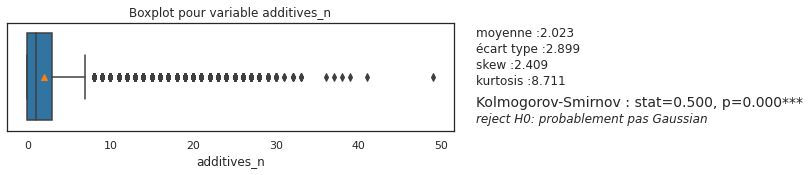

In [70]:
def plot_box(df:pd.DataFrame, col, showstats=False):
    plt.figure(figsize=(8, 2))
    ax = sns.boxplot(data=df, x=col, showmeans=True, showfliers=True)
    plt.title(f'Boxplot pour variable {col}')
    if showstats:
        add_text(ax, x=1.05, y=0.85, s=f'moyenne :{df[col].mean():.3f}')
        add_text(ax, x=1.05, y=0.7, s=f'écart type :{df[col].std():.3f}')
        add_text(ax, x=1.05, y=0.55, s=f'skew :{df[col].skew():.3f}')
        add_text(ax, x=1.05, y=0.4, s=f'kurtosis :{df[col].kurtosis():.3f}')
        p, ch, choix = test_normality(df[col])
        add_text(ax, x=1.05, y=0.20, s=ch, fontsize=14)
        add_text(ax, x=1.05, y=0.05, s=choix, style='italic')


plot_box(cleaned_data, 'additives_n', showstats=True)
to_png()

### 3.2.3 Analyse d'outliers (valeurs atypiques)

In [71]:
def get_valeurs_atypiques(df:pd.DataFrame, col, nb=10, random_state=None):
    desc = df[col].describe()
    q1 = desc['25%']  # df[col].quantile(0.25)
    median = desc['50%']  # df[col].quantile(.50)
    q3 = desc['75%']  # df[col].quantile(.75)
    iqr = (q3 - q1)
    max_val = min(desc['max'], q3 + 1.5 * iqr)
    # print(desc)
    # print(f'Q1 (25%) : {q1}')
    # print(f'médiane : {median}')
    # print(f'Q3 (75%) : {q3}')
    print(f'outliers [{col}] vals > {max_val:.2f}')
    outliers = df[df[col] > max_val]
    nb = min(len(outliers), nb)
    if nb > 0:
        print(outliers.sample(nb, random_state=random_state)['product_name'].to_list())


cleaned_data.pipe(get_valeurs_atypiques, 'additives_n', nb=10, random_state=1)

outliers [additives_n] vals > 7.50
['2 Hot Dogs saveur moutarde', 'Crazy Tiger Cherry Street', 'Wrap&Go Tzatziki & Falafel', 'Candy bar overload premium ice cream', 'Key lime cultured dairy blend', 'Punch Drink', 'Trident gum cinnamon bonus1x14 pk', "M&M's Chocolate", 'Hurricane frozen beverage mix', "Lloyd's, Seasoned - Shredded Pork, Bbq Sauce"]


#### Outliers - Nutriscore A avec beaucoup d'additifs
- un sandwich de poulet peut avoir > 10 additifs

In [72]:
(cleaned_data[cleaned_data['additives_n'] > 10]
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_tag, 'nutriscore_grade', 'a')
 )

,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
21,2600280009649,agamitsudo,2016-04-17 15:03:02,2019-10-12 11:47:07,Escalope extra fine dinde,sans-marque,"Snacks,Sweet snacks,Confectioneries",NaN,France,"sirops de glucose et de glucose-fructose, sucre, dextrose, sirops de sucre inverti de sucre méla...",30,"en:e100,en:e120,en:e14xx,en:e150d,en:e153,en:e160a,en:e161b,en:e163,en:e171,en:e270,en:e296,en:e...","E100 - Curcumin,E120 - Cochineal,E14XX - Modified Starch,E150d - Sulphite ammonia caramel,E153 -...",1,huile-de-palme,2,"e160a-beta-carotene,e471-mono-et-diglycerides-d-acides-gras-alimentaires",-4.0,a,4,Sugary snacks,Sweets,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date completed...",Confectioneries,448.0,0.8,0.4,0.5,0.5,NaN,25.0,0.0720,0.0
1791,00012317,kiliweb,2019-04-19 10:14:12,2020-03-17 14:15:03,Club Turkey Bacon,crous-languedoc-roussillon,"Sandwiches,Raw-vegetable-sandwiches",NaN,France,"PAIN DE MIE COMPLET 43,9% : Farine complète de BLE 47%, eau, farine de BLE, huile de colza, dext...",17,"en:e14xx,en:e150a,en:e160b,en:e202,en:e224,en:e250,en:e262,en:e262i,en:e270,en:e282,en:e300,en:e...","E14XX - Modified Starch,E150a - Plain caramel,E160b - Annatto,E202 - Potassium sorbate,E224 - Po...",0,NaN,1,e471-mono-et-diglycerides-d-acides-gras-alimentaires,-2.0,a,4,Composite foods,Sandwiches,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Raw-vegetable-sandwiches,795.0,6.6,1.9,19.9,3.1,4.0,10.5,0.5200,48.2
3041,5400101008366,kiliweb,2017-03-25 12:28:20,2019-03-22 12:54:17,Yaourt,carrefour,"Dairies,Fermented foods,Fermented milk products,Yogurts",Contains a source of phenylalanine,France,"Lait écrémé pasteurisé 85,5%, fruits 6% (fraise ou cerise ou ananas ou pêche ou abricot ou fruit...",15,"en:e101,en:e101i,en:e120,en:e14xx,en:e160c,en:e162,en:e163,en:e202,en:e330,en:e331,en:e331iii,en...","E101 - Riboflavin,E101i - Riboflavin,E120 - Cochineal,E14XX - Modified Starch,E160c - Paprika ex...",0,NaN,0,NaN,-1.0,a,4,Milk and dairy products,Milk and yogurt,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Yogurts,159.0,0.5,0.1,5.4,5.0,0.5,4.2,0.0400,6.0
3369,3023290474600,kiliweb,2017-02-28 17:41:55,2021-03-28 17:29:29,Spécialité fruits 0% mat gr,janjac,"Dairies,Fermented foods,Fermented milk products,Yogurts,Fruit yogurts",Lait-francais-french-milk,France,"_Lait_ écrémé (origine France), fruits (6 %) (fraise ou pêche ou abricot ou fruits rouges (frais...",15,"en:e101,en:e101i,en:e120,en:e14xx,en:e160c,en:e162,en:e163,en:e202,en:e330,en:e331,en:e333,en:e4...","E101 - Riboflavin,E101i - Riboflavin,E120 - Cochineal,E14XX - Modified Starch,E160c - Paprika ex...",0,NaN,0,NaN,-1.0,a,4,Milk and dairy products,Milk and yogurt,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Fruit yogurts,167.0,0.0,0.0,5.5,5.3,NaN,4.3,0.0400,6.0
4020,3308650721700,agamitsudo,2016-03-08 18:35:14,2021-02-22 23:52:17,Queue de Crevette Torpedo Panée,brake,"Frozen foods,Meals,Breaded products,Frozen ready-made meals,fr:crevettes-panees",Products for professional use,France,"Panure 55% [ chapelure japonaise 37% (farine de blé, huile de palme, sucre, levure, sel, agent d...",14,"en:e1100,en:e170,en:e300,en:e412,en:e415,en:e451,en:e452,en:e471,en:e500,en:e516,en:e551,en:e621...","E1100 - Alpha-Amylase,E170 - Calcium carbonates,E300 - Ascorbic acid

#### Outliers - valeurs nutritionnelles
- Quelle sont les produits avec valeurs atypiques dans chaque colonne nutritionnelle ?

In [73]:

print(list(colonnes_100g))
for col in colonnes_100g:
    print(f'------------------------------------')
    cleaned_data.pipe(get_valeurs_atypiques, col, nb=5, random_state=1)

['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']
------------------------------------
outliers [fat_100g] vals > 51.41
['Amandes shoyu', 'Noix de coco râpée', 'Honey Roasted Almonds', 'Sesamöl', 'Huile pépins de raisin']
------------------------------------
outliers [saturated-fat_100g] vals > 17.10
['Hot chocolatier', 'Cacahuetes sans coques', 'Svensk riven mild ost', 'Comte aop - 12 mois mini badoz', 'Noire Fumée']
------------------------------------
outliers [carbohydrates_100g] vals > 100.00
------------------------------------
outliers [sugars_100g] vals > 46.30
['Turron de crema catalana', 'Noberasco Viva Il Mango', 'Multivitamin Bonbon, Frucht', 'Ritter Sport Chocolate Assorted Flavors', 'Pepites chocolat']
------------------------------------
outliers [fiber_100g] vals > 9.00
['Chia seeds', 'Our family, roasted & salted almonds', 'Graines De Tournesol',

### 3.2.4 Distributions univariées avec tests de normalité

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.725, p=0.000*** : reject H0: probablement pas Gaussian
"distribution_nutriscore_stats.png"


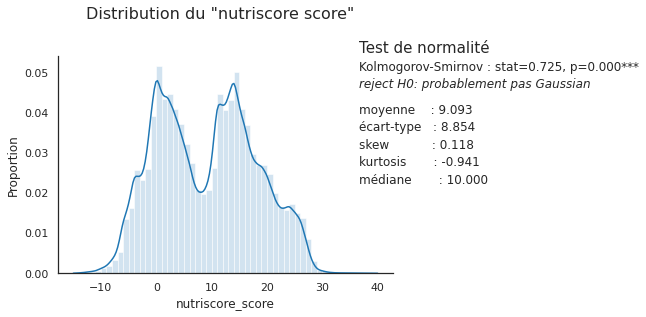

In [74]:
def plot_histogram(df:pd.DataFrame, col, color=None, ax=None, showstats=False, binwidth=None):
    print(f'Plot Histogram for column {col}')
    series: pd.Series = df[col].astype(float).dropna()
    if ax is None:
        plt.figure()
        ax = plt.gca()
    ax = sns.histplot(series, ax=ax, color=color, kde=True, binwidth=binwidth,
                      alpha=0.2, stat='proportion', legend=True)
    ax.set_xlabel(series.name)
    if showstats:
        p, ch, choix = test_normality(series)
        add_text(ax, 0.9, 1, 'Test de normalité', fontsize=15)
        add_text(ax, 0.9, 0.92, ch)
        add_text(ax, 0.9, 0.84, choix, style='italic')
        add_text(ax, 0.9, 0.72, f'moyenne    : {series.mean():.3f}')
        add_text(ax, 0.9, 0.64, f'écart-type   : {series.std():.3f}')
        add_text(ax, 0.9, 0.56, f'skew           : {series.skew():.3f}')
        add_text(ax, 0.9, 0.48, f'kurtosis       : {series.kurtosis():.3f}')
        add_text(ax, 0.9, 0.40, f'médiane       : {series.median():.3f}')
    sns.despine()


cleaned_data.pipe(plot_histogram, 'nutriscore_score', showstats=True, binwidth=1)
plt.suptitle('Distribution du "nutriscore score"', size=16, y=1.05)
to_png('distribution_nutriscore_stats')

#### 3.2.4.1 Histograms pour toutes les colonnes numériques
- change à `plot_all=True` pour générer les diagrammes pour toutes les colonnes numériques

In [75]:
colonnes_numeriques = list(cleaned_data.select_dtypes('number').columns)
print(colonnes_numeriques)

plot_all = False
if plot_all:
    for col in colonnes_numeriques:
        plot_histogram(cleaned_data, col)
        to_png(f'distribution_{col}_stats')
        plt.show()

['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'nutriscore_score', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


### 3.2.5 Effectif et fréquence
- effectif : df[col].value_counts(normalize=False)
- fréquence : df[col].value_counts(normalize=True)


In [76]:
def count_freq(df:pd.DataFrame, col):
    """Calculer l'effectif ET la fréquence en même temps"""
    s = df[col]
    effectif = s.value_counts()
    total = effectif.sum()
    # frequence = s.value_counts(normalize=True)
    frequence = effectif.div(total)
    percent100 = frequence.mul(100).round(1).astype(str) + '%'
    return (pd.DataFrame({'effectif': effectif, 'freq': frequence, 'per100': percent100})
            .rename_axis(col)
            .reset_index())


(cleaned_data
 .pipe(filtre_par_top_freq, col='creator', nb=10)
 .to_frame(name='creator')
 .pipe(count_freq, col='creator')
 )


,creator,effectif,freq,per100
0,kiliweb,878633,0.564938,56.5%
1,other,196716,0.126483,12.6%
2,usda-ndb-import,155857,0.100212,10.0%
3,openfoodfacts-contributors,128841,0.082841,8.3%
4,org-database-usda,90899,0.058446,5.8%
...,...,...,...,...
6,date-limite-app,24477,0.015738,1.6%
7,elcoco,20414,0.013126,1.3%
8,inf,13918,0.008949,0.9%
9,openfood-ch-import,10737,0.006904,0.7%


In [77]:


cleaned_data.pipe(top_n_freq, col='creator', nb=10)


,creator,freq
0,kiliweb,878633.0
1,usda-ndb-import,155857.0
2,openfoodfacts-contributors,128841.0
3,org-database-usda,90899.0
4,foodvisor,26526.0
...,...,...
6,elcoco,20414.0
7,inf,13918.0
8,openfood-ch-import,10737.0
9,tacite,8256.0


## 3.3 Contributions sur le temps
Objectif: 
- est-ce que les données sont récent ?
- est-ce que les données sont mise à jours?
- est-ce que on peut suivre l'évolution des scores pendant les années ?
- est-ce que les contributions des différents contributeurs peuvent être traités ensembles?

Graphiques:
- Nombre de registres créés / modifiés dans le temps
- Par contributeur dans le temps


### 3.3.1 Nombre de registres créés / modifiés dans le temps


In [78]:
date_cols=cleaned_data[['created_datetime', 'last_modified_datetime', 'creator', 'countries_en']].copy()
date_cols.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1555277 entries, 0 to 1555276
Data columns (total 4 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   created_datetime        1555277 non-null  datetime64[ns]
 1   last_modified_datetime  1555277 non-null  datetime64[ns]
 2   creator                 1555274 non-null  object        
 3   countries_en            1551530 non-null  object        
dtypes: datetime64[ns](2), object(2)
memory usage: 47.5+ MB


Crée une colonne pour indiquer le nombre de jours entre création et la dernière modification

In [79]:

def create_column_days_diff(df:pd.DataFrame):
    df = df.copy()
    # convert time delta (discrete, in ns) to continuous (float)
    df['days_diff'] = (
            (df['last_modified_datetime'] - df['created_datetime'])
            / np.timedelta64(1, 'D')
    )
    return df

date_cols = date_cols.pipe(create_column_days_diff)

# get maximum date difference
date_cols.sort_values(by='days_diff', ascending=False).head()


,created_datetime,last_modified_datetime,creator,countries_en,days_diff
304804,2012-02-12 08:32:47,2021-11-12 12:43:22,andre,"Algeria,Austria,France,Germany,Switzerland",3561.174016
208334,2012-01-31 14:43:58,2021-10-27 05:28:48,stephane,France,3556.614468
190916,2012-02-11 15:07:23,2021-10-23 14:45:55,marianne,"Belgium,Canada,France,Switzerland",3541.985093
313058,2012-03-26 21:37:25,2021-11-21 06:00:23,andre,France,3526.349282
385419,2012-03-19 14:48:17,2021-11-12 13:09:37,andre,"Belgium,France",3524.931481


In [80]:
date_cols.describe(datetime_is_numeric=True).style.set_precision(2)

,created_datetime,last_modified_datetime,days_diff
count,1555277,1555277,1555277.00
mean,2019-05-04 12:24:37.397361152,2020-08-08 05:08:01.600009216,461.70
min,2012-01-31 14:43:58,2012-07-08 17:23:31,0.00
25%,2018-02-09 13:08:10,2020-03-14 10:33:00,0.00
50%,2019-08-28 10:21:55,2020-10-02 08:43:57,191.17
75%,2020-10-20 19:08:06,2021-05-22 10:25:36,842.86
max,2021-11-23 02:06:12,2021-11-23 02:06:13,3561.17
std,nan,nan,577.95


➡️ 75% des données ont été crée depuis 2018


➡️ Au moins 25% des données n'ont jamais était modifiés

"date_diff_displot.png"


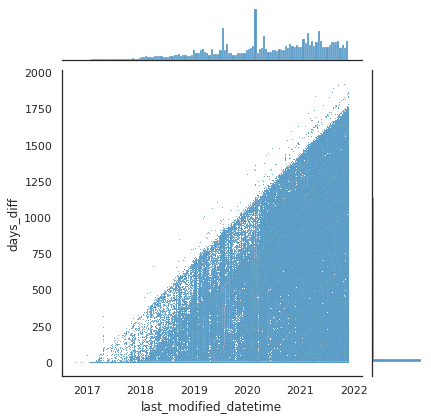

In [81]:
def plot_dist_date_diff(df:pd.DataFrame):
    # sns.displot(df,x='days_diff')
    sns.jointplot(data=df[['last_modified_datetime', 'days_diff']].dropna(
    ), x='last_modified_datetime', y='days_diff', s=1)


(date_cols
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'creator', 'kiliweb')
 .pipe(plot_dist_date_diff)
 )
to_png('date_diff_displot')

IntervalIndex([(-1.0, 0.0001], (0.0001, 191.0], (191.0, 843.0], (843.0, 3561.0]],
              closed='right',
              dtype='interval[float64]')
"date_created_hue_day_diff_displot.png"


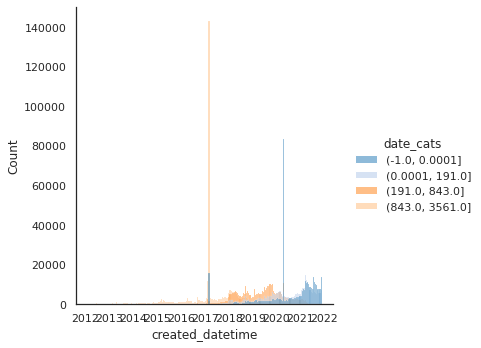

In [82]:
date_cols['date_cats'] = pd.qcut(
    date_cols['days_diff'], 4, precision=0, duplicates='drop')
print(date_cols['date_cats'].cat.categories)

sns.displot(data=date_cols, x='created_datetime', hue='date_cats')
to_png('date_created_hue_day_diff_displot')


### 3.3.2 Principaux contributeurs par année

"contributeurs_over_time_displot_creator.png"


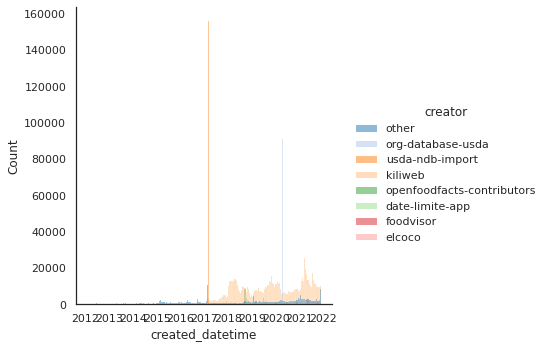

In [83]:
def contrib_over_time(df:pd.DataFrame, nb=7):
    top_contrib = pd.concat([
        df.pipe(filtre_par_top_freq, 'creator', nb=nb),
        df['created_datetime']
    ], axis=1)
    sns.displot(data=top_contrib, x='created_datetime', hue='creator')
    return top_contrib


contributeurs_over_time = date_cols.pipe(contrib_over_time, 7)
to_png('contributeurs_over_time_displot_creator')


On regarde chaque contributeur séparément :

"contributeurs_over_time_facetgrid_creator.png"


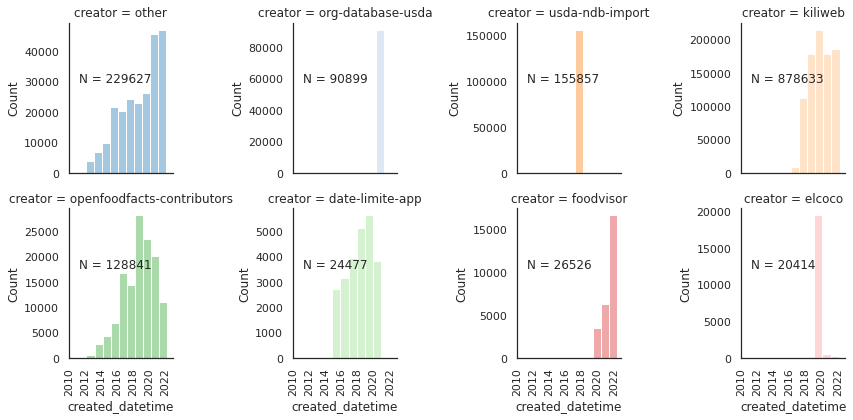

In [84]:
def plot_over_time(df:pd.DataFrame, col):
    def annotate(data, **kws):
        n = len(data)
        ax = plt.gca()
        ax.text(.1, .6, f"N = {n}", transform=ax.transAxes)
    df=df[['created_datetime',col]].dropna()
    g = sns.FacetGrid(df, hue=col, col=col, col_wrap=4,
                      sharex=True, sharey=False)
    # binwidth = 1 an 
    g.map(sns.histplot, "created_datetime", binwidth=365, alpha=.4)
    g.set_xticklabels(rotation=90)
    g.map_dataframe(annotate)


contributeurs_over_time.pipe(plot_over_time, 'creator')
to_png('contributeurs_over_time_facetgrid_creator')


"contributeurs_over_time_facet_grid.png"


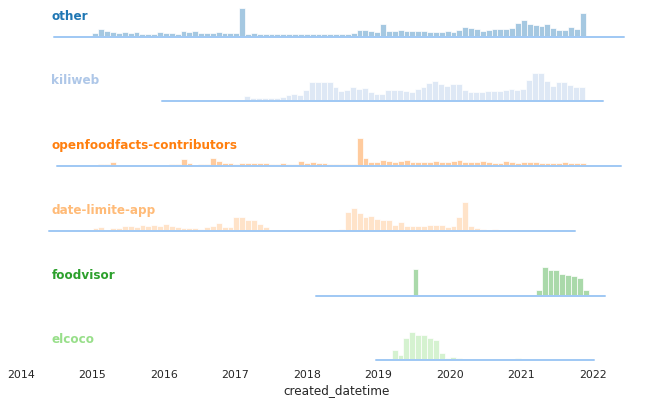

In [85]:
from dateutil import parser


def plot_contributeurs_facet(df:pd.DataFrame):
    df=df[['created_datetime','creator']].dropna()
    datefrom = parser.parse('01/01/2015', ignoretz=True)
    filtre1 = df['created_datetime'] > datefrom
    filtre = df['creator'].str.contains('usda|import', regex=True)
    g = sns.FacetGrid(df[filtre1 & ~filtre], row="creator", hue='creator',
                      aspect=10, height=1, sharey=False)
    # Draw the densities in a few steps
    g.map(sns.histplot, "created_datetime", alpha=.4, binwidth=30, clip_on=False)
    g.map(sns.kdeplot, "created_datetime", clip_on=False, color="b", lw=2)

    # Define and use a simple function to label the plot in axes coordinates
    def annotate(x, color, label):
        ax = plt.gca()
        ax.text(0.05, .7, label, fontweight="bold", color=color,
                ha="left", va="center", transform=ax.transAxes)

    g.map(annotate, 'created_datetime')

    # Supprime détail
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)
    plt.gcf().title = 'Distribution des contributions sur le temps'


contributeurs_over_time.pipe(plot_contributeurs_facet)
to_png('contributeurs_over_time_facet_grid')

Supprime datasets temporaraires

In [86]:
del contributeurs_over_time
del date_cols


### 3.3.3 Fréquence par année (groupé par nutrigrade, groupe NOVA, nombre d'additifs)


In [87]:
def count_freq_by_year(df:pd.DataFrame, groupby_var, date_col='last_modified_datetime'):
    count_by_year = (
        df[[groupby_var, date_col]]
            .groupby(by=[groupby_var, df[date_col].dt.year]).count()
    )
    freq_by_year = (count_by_year
                    .groupby(level=1)
                    .apply(lambda x: 100 * x / float(x.sum()))
                    # .rename(columns={date_col:groupby_var})
                    )

    return freq_by_year.unstack(level=0).droplevel(0, axis=1)


cleaned_data.pipe(count_freq_by_year, groupby_var='nutriscore_grade').style.set_precision(2)

nutriscore_grade,a,b,c,d,e
last_modified_datetime,,,,,
2012,22.22,11.11,11.11,22.22,33.33
2013,12.96,11.11,24.07,24.07,27.78
2014,15.95,13.19,21.17,33.44,16.26
2015,19.01,14.69,21.12,26.26,18.92
2016,18.77,12.40,19.59,29.93,19.31
2017,13.14,12.51,19.35,29.56,25.44
2018,11.20,12.54,20.97,30.01,25.28
2019,14.13,14.41,22.19,29.62,19.65
2020,16.28,12.45,20.83,31.61,18.84


In [88]:
def pivot_freq(df:pd.DataFrame, col='nova_group', groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    if col == 'nova_group':
        df=df.copy()
        df[col]=df[col].astype(float)
    if col == groupby_var:
        piv_index = [df[date_col].dt.year]
    else:
        piv_index = [groupby_var, df[date_col].dt.year]
    addx: pd.DataFrame = (pd.pivot_table(df,
                                         columns=[col],
                                         index=piv_index,
                                         aggfunc={
                                             col: ['count', 'mean']
                                         },
                                         )
                          )

    return addx


cleaned_data.pipe(pivot_freq)

nova_group                          \
                                             count                           
nova_group                                     1.0    2.0     3.0      4.0   
nutriscore_grade last_modified_datetime                                      
a                2012                          2.0    NaN     NaN      NaN   
                 2013                          1.0    NaN     3.0      3.0   
                 2014                         21.0    NaN     3.0     13.0   
                 2015                        143.0    NaN   102.0    104.0   
                 2016                        180.0    NaN    95.0    109.0   
...                                            ...    ...     ...      ...   
e                2017                         32.0   20.0   218.0    890.0   
                 2018                         48.0   75.0   648.0   2374.0   
                 2019                        122.0  114.0  1082.0   4217.0   
                 2020                        824.0  474.0  6259.0  37134.0   
                 2021                        394.0  701.0  3751.0  18428.0   

                                                             
                                        mean                 
nova_group                               1.0  2.0  3.0  4.0  
nutriscore_grade last_modified_datetime                      
a                2012                    1.0  NaN  NaN  NaN  
                 2013                    1.0  NaN  3.0  4.0  
                 2014                    1.0  NaN  3.0  4.0  
                 2015                    1.0  NaN  3.0  4.0  
                 2016                    1.0  NaN  3.0  4.0  
...                                      ...  ...  ...  ...  
e                2017                    1.0  2.0  3.0  4.0  
                 2018                    1.0  2.0  3.0  4.0  
                 2019                    1.0  2.0  3.0  4.0  
                 2020                    1.0  2.0  3.0  4.0  
                 2021                    1.0  2.0  3.0  4.0  

[50 rows x 8 columns]

### 3.3.4 Top pays (nombre de produits)


"Produits_par_pays.png"


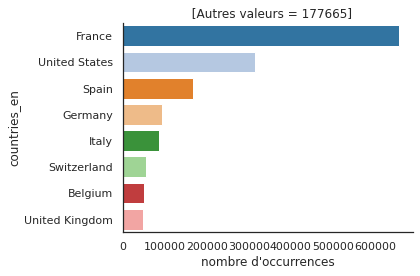

In [89]:
def plot_produits_par_pays(df:pd.DataFrame):
    plot_bar_top_n(df, 'countries_en', nb=8)


cleaned_data.pipe(plot_produits_par_pays)
to_png('Produits_par_pays')


## 3.4 Distribution des données (manquantes)

Cette section analyse:
 - les colonnes avec des données manquantes
 - les principaux contributeurs des données pour chaque colonne 


**Note :** Les données nettoyées ont toujours des données manquantes après :
  - suppression de produits sans nom
  - suppression de produits non alimentaires
  - suppression de doublons
  - imputation des valeurs nutritionnelles / nutriscore
  - suppression des lignes sans ingredients

Voir P3_nettoyage.ipynb section 4.5 pour plus de détails

### 3.4.1 Matrix de missingno 

"Valeurs_manquantes_(données_nettoyés).png"


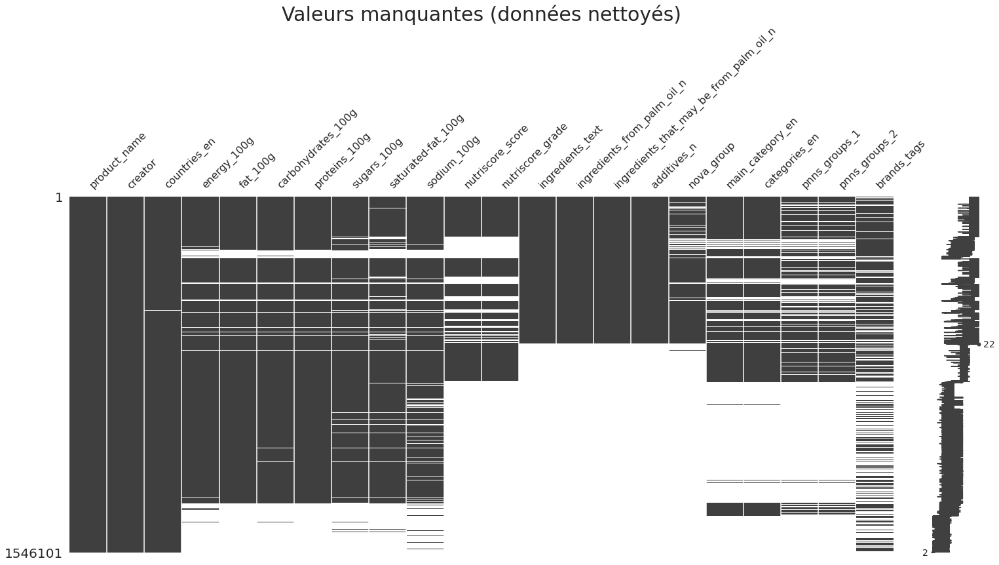

In [90]:
import missingno as msno


def sort_by_priority(df: pd.DataFrame):
    return (df.dropna(subset=['product_name'])
            .sort_values(by=['additives_n', 'nutriscore_score', 'fat_100g', 'main_category_en'])
            )


analyse_cols = ['product_name',
                'creator', 'countries_en',
                # colonnes nutritionnelles
                'energy_100g', 'fat_100g', 'carbohydrates_100g', 'proteins_100g', 'sugars_100g', 'saturated-fat_100g',
                'sodium_100g',
                'nutriscore_score', 'nutriscore_grade',
                'ingredients_text', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                'additives_n',
                'nova_group',
                'main_category_en', 'categories_en',
                'pnns_groups_1', 'pnns_groups_2',
                'brands_tags'
                ]

msno.matrix(cleaned_data[analyse_cols].pipe(sort_by_priority))
plt.title('Valeurs manquantes (données nettoyés)', size=30)
to_png()

"Valeurs_manquantes_-_(creator_=_usda-ndb-import).png"


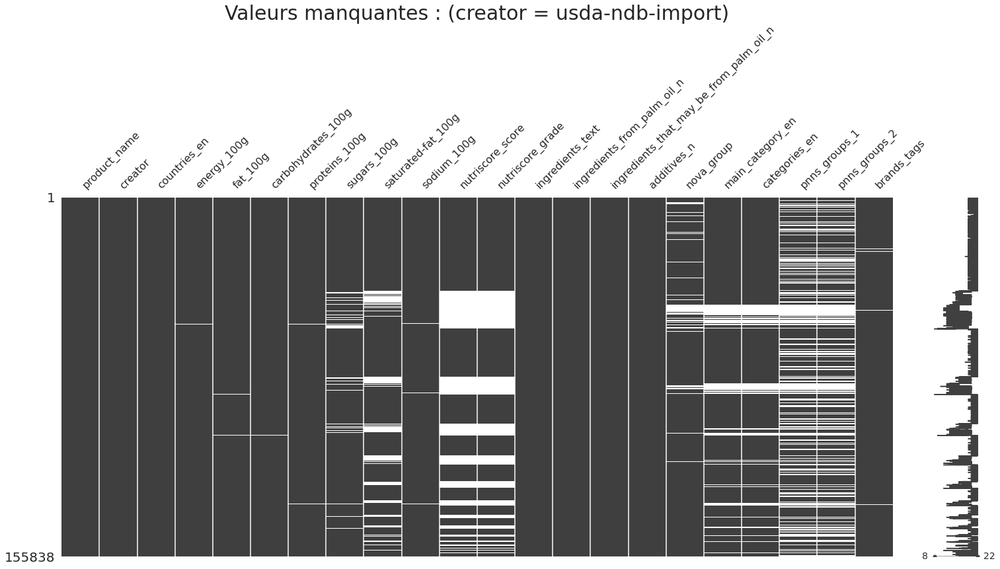

In [91]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'creator', 'usda-ndb-import')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes : (creator = usda-ndb-import)', size=30)
to_png()

"Valeurs_manquantes_-_France.png"


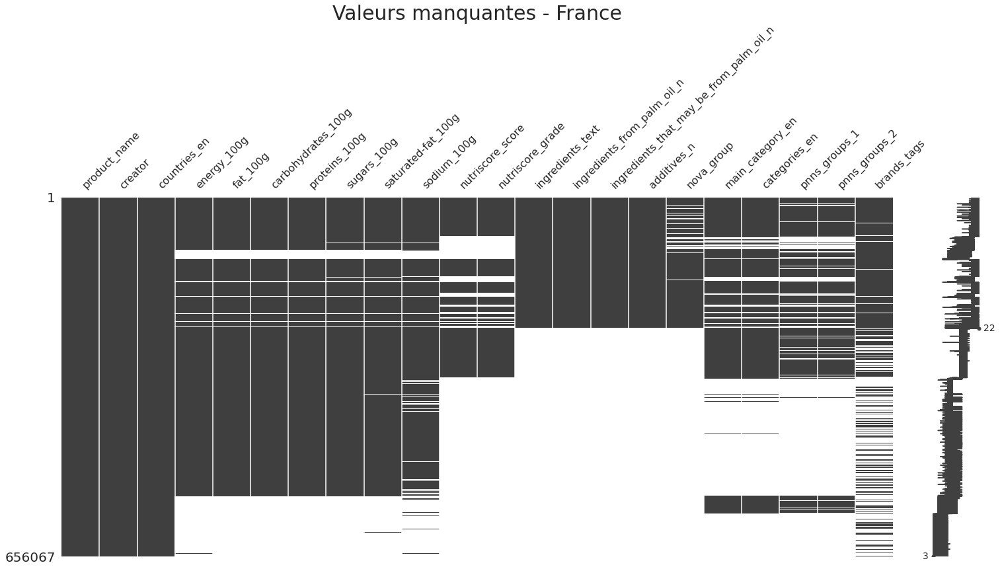

In [92]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'france')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - France', size=30)
to_png()

"Valeurs_manquantes_-_Etats_Unis.png"


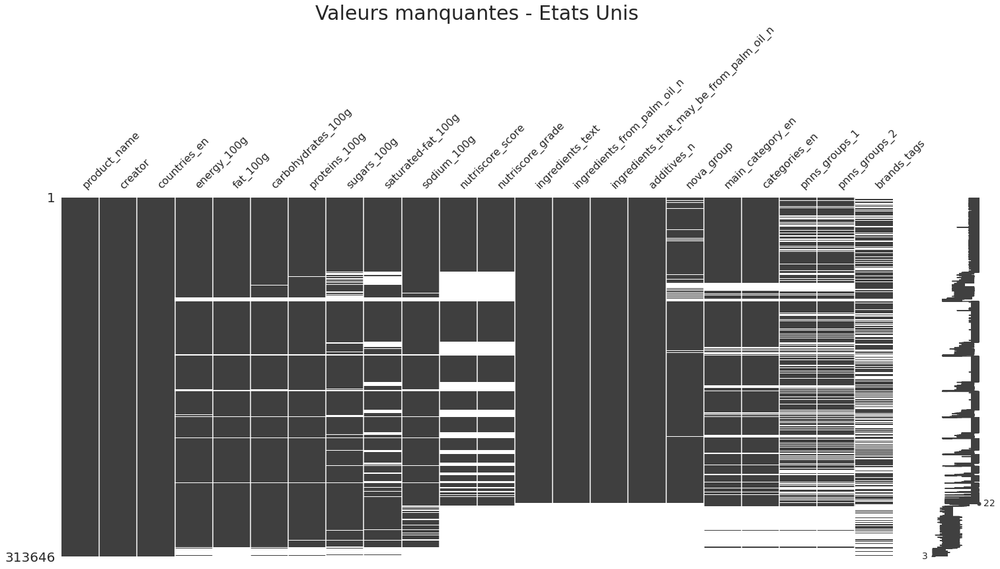

In [93]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'united states')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - Etats Unis', size=30)
to_png()

### 3.4.2 Top contributeurs - pie charts

In [94]:
def plot_top_contributeurs(df:pd.DataFrame, nb=7, for_column='creator', palette=None):
    
    column_exists = (for_column in df.columns)
    print(f'plot_top_contributeurs for {for_column} (column_exists={column_exists})')
    top_contributeurs = df.dropna(subset=[for_column]).pipe(
        top_n_freq, col='creator', nb=nb, others=True)
    nb = min(nb + 1, len(top_contributeurs))  # nb + 'others'
    top_contributeurs = top_contributeurs.head(nb).sort_values(by='freq', ascending=False)
    contributeurs = top_contributeurs['creator'].tolist()
    colors = sns.color_palette("tab20").as_hex()

    # reutilise la palette du dernier pie pour pouvoir comparer les pies,
    # sans changer la couleur de chaque contributeur
    if palette is None:
        palette = dict(zip(contributeurs, colors[:nb]))
    for creator in contributeurs:
        keys = list(palette.keys())
        if not (creator in keys):
            n = len(keys) % 20
            palette[creator] = colors[n]

    colors = [palette[col] for col in contributeurs]
    labels = (top_contributeurs['creator'])
    wedges, texts, autotexts = plt.pie(
        data=top_contributeurs, x='freq', colors=colors, autopct="%.1f%%",
         explode=[0.05] * nb, pctdistance=1.2)
    plt.suptitle(
        f'Principaux contributeurs (colonne "{for_column}")', fontsize=16, y=1.05)
    plt.legend(wedges, labels, title=f'contributeur',
               bbox_to_anchor=(1.0, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.1, right=0.4)

    return palette


# reinitialise la palette à utiliser
contributeur_palette = None


#### 3.4.2.1 Contributeurs - nombre de produits créés
- Tous les pays
- France
- Etats Unis

plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_all_created.png"


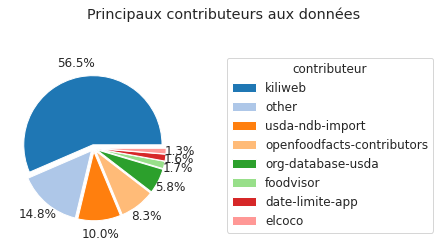

In [95]:
contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, nb=7, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données")
to_png('principaux_contributeurs_pie_all_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_france_created.png"


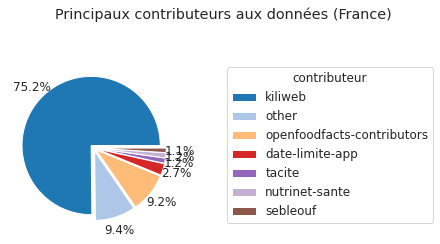

In [96]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (France)")
to_png('principaux_contributeurs_pie_france_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_usa_created.png"


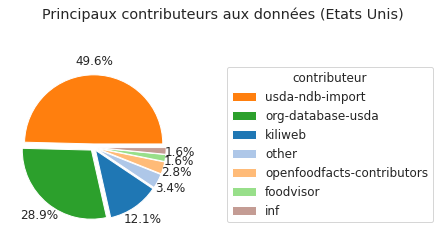

In [97]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (Etats Unis)")
to_png('principaux_contributeurs_pie_usa_created')


#### 3.4.2.1 Contributeurs - nombre de produits avec additifs
- Tous les pays
- France
- Etats Unis

plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_all_additives.png"


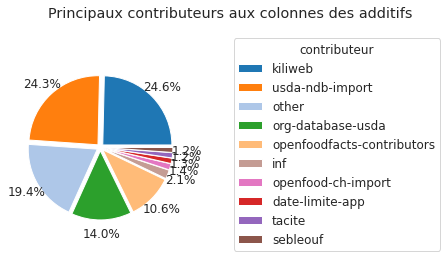

In [98]:

contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=9, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs')
to_png('principaux_contributeurs_pie_all_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_france_additives.png"


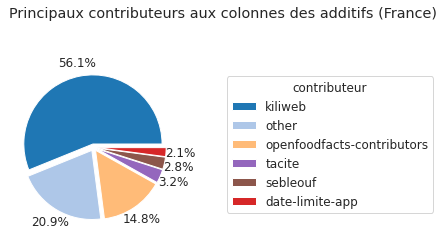

In [99]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (France)')
to_png('principaux_contributeurs_pie_france_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_usa_additives.png"


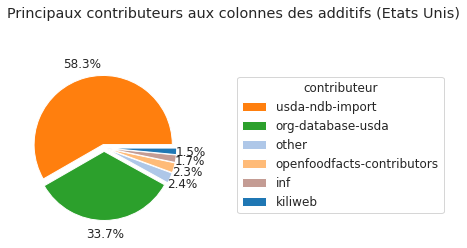

In [100]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Etats Unis)')
to_png('principaux_contributeurs_pie_usa_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_spain_additives.png"


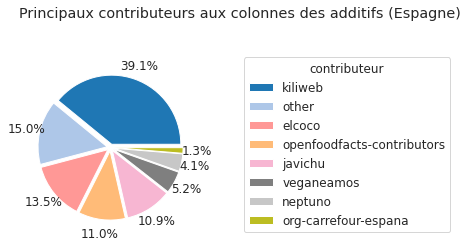

In [101]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Spain')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Espagne)')
to_png('principaux_contributeurs_pie_spain_additives')

plot_top_contributeurs for energy_100g (column_exists=True)
"principaux_contributeurs_pie_nutrition_values.png"


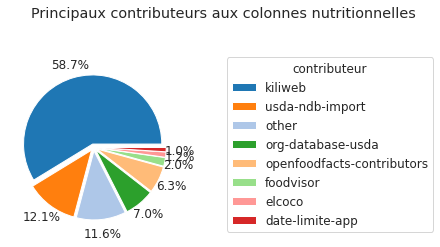

In [102]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='energy_100g', nb=7, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux colonnes nutritionnelles')
to_png('principaux_contributeurs_pie_nutrition_values')


plot_top_contributeurs for labels_en (column_exists=True)
"principaux_contributeurs_pie_labels_en.png"


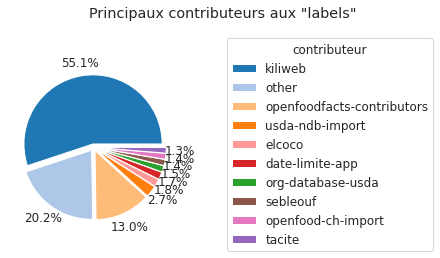

In [103]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='labels_en', nb=9, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux "labels"')
to_png('principaux_contributeurs_pie_labels_en')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_germany_additives.png"


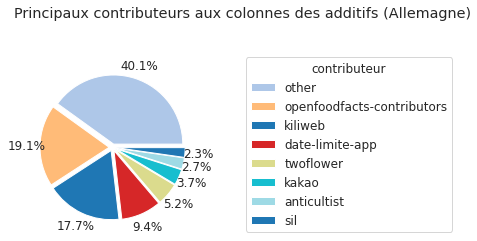

In [104]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Germany')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Allemagne)')
to_png('principaux_contributeurs_pie_germany_additives')

### 3.4.3 Conclusion
   - Les données manquantes varient par pays
   - La plupart des données en Europe vient des apps de chaque pays
   - Yuka App (Kiliweb) fourni 75% des données de France, mais seulement 24% des données des additifs
   - Si on analyse que les données de France, on perd presque 70% des informations sur les additifs


## 3.5 Intersections des données

### 3.5.1 Visualise intersection de tags (venn diagram)

Objectif: voir s'il y a des correlations entre les tags :
- produits commun à plusieurs pays
- additifs qui se trouvent ensembles
- corrélations entre labels (exemple 'bio' et 'organic') 
- les top catégories trouvés ensembles

Il est très compliqué de faire des corrélations entre des tags :

- il faut 'exploser' la colonne
- filtre sur les top 100 tags
- faire un crosstab sur les top tags
- faire des correlations sur ce crosstab

La plupart des colonnes de tags contient plus de 40000 tags
Avec 2 millions de registres, ça prend beaucoup de memoire et beaucoup de temps

Donc, on regarde simplement les top 3 tags

In [105]:
def calc_tag_intersections(df:pd.DataFrame, tag_col, tag1=None, tag2=None, tag3=None):
    """calculer les co-occurences (intersections) de 2 ou 3 tags dans une colonne"""
    data = df[[tag_col]].dropna()
    if tag1 is None:
        [tag1, tag2, tag3] = (explode_series(data[tag_col])
                              .value_counts()
                              .index[:3].to_list())
        titre = f'Nombre de top 3 tags dans colonne "{tag_col}"'
    else:
        titre = f'Nombre de tags sélectionnés dans colonne "{tag_col}"'
    has_tag1 = data[tag_col].str.contains(tag1)
    has_tag2 = data[tag_col].str.contains(tag2)
    c100 = sum(has_tag1)
    c010 = sum(has_tag2)
    c110 = sum(has_tag1 & has_tag2)
    print(titre)
    print(f'{tag1} : {c100} produits')
    print(f'{tag2} : {c010} produits')

    if tag3 is None:
        print(f'{tag1} & {tag2} : {c110} produits')
    else:
        has_tag3 = data[tag_col].str.contains(tag3)
        c001 = sum(has_tag3)
        c101 = sum(has_tag1 & has_tag3)
        c011 = sum(has_tag2 & has_tag3)
        c111 = sum(has_tag1 & has_tag2 & has_tag3)
        print(f'{tag3} : {c001} produits')
        print(f'{tag1} & {tag2} : {c110} produits')
        print(f'{tag1} & {tag3} : {c101} produits')
        print(f'{tag2} & {tag3} : {c011} produits')
        print(f'{tag1} & {tag2} & {tag3} : {c111} produits')

cleaned_data.pipe(calc_tag_intersections, 'countries_en',
                  'France', 'United States')
plt.show()

Nombre de tags sélectionnés dans colonne "countries_en"
France : 658234 produits
United States : 314216 produits
France & United States : 4257 produits


In [106]:
cleaned_data.pipe(calc_tag_intersections, 'countries_en')
plt.show()


Nombre de top 3 tags dans colonne "countries_en"
France : 658234 produits
United States : 314216 produits
Spain : 166785 produits
France & United States : 4257 produits
France & Spain : 12043 produits
United States & Spain : 480 produits
France & United States & Spain : 142 produits


In [107]:
cleaned_data.pipe(calc_tag_intersections, 'main_category_en')

Nombre de top 3 tags dans colonne "main_category_en"
Snacks : 27155 produits
Biscuits : 16530 produits
Sauces : 13850 produits
Snacks & Biscuits : 0 produits
Snacks & Sauces : 0 produits
Biscuits & Sauces : 0 produits
Snacks & Biscuits & Sauces : 0 produits


In [108]:
cleaned_data.pipe(calc_tag_intersections, 'additives_en')

Nombre de top 3 tags dans colonne "additives_en"
E330 - Citric acid : 119878 produits
E322 - Lecithins : 80927 produits
E322i - Lecithin : 72909 produits
E330 - Citric acid & E322 - Lecithins : 17174 produits
E330 - Citric acid & E322i - Lecithin : 15513 produits
E322 - Lecithins & E322i - Lecithin : 72909 produits
E330 - Citric acid & E322 - Lecithins & E322i - Lecithin : 15513 produits


In [109]:
cleaned_data.pipe(calc_tag_intersections, 'labels_en')

Nombre de top 3 tags dans colonne "labels_en"
Organic : 132798 produits
EU Organic : 78902 produits
Green Dot : 36959 produits
Organic & EU Organic : 78902 produits
Organic & Green Dot : 4803 produits
EU Organic & Green Dot : 4358 produits
Organic & EU Organic & Green Dot : 4358 produits


### 3.5.2 Conclusion

- ➡️ Les données de chaque pays ont très peu d'intersection avec d'autres pays
- ➡️ Pour utiliser les données de plusieurs pays, il faut être sûr que les données vient de la même population (moyennes et variance)

## 3.6 Effet de suppression des données manquantes sur les distributions

- On ne peut pas imputer les données manquantes, car ça modifie les distributions de nutriscore et valeurs nutritionnelles



### 3.6.1 Si on supprime les données manquants, quel est l'effet sur les distributions?

On peut si les produits sans information sur les additifs, le groupe NOVA ou le Nutriscore

Notre objectif est de 
- remplacer le NOVA score `[nova_group]` et le nombre d'additifs `[additives_n]` par l'ADDISCORE

Il faut comparer les colonnes `nutriscore_score`, `nova_group` et `additives_n`

Avant de supprimer les produits avec données manquantes dans ces colonnes, il faut verifier que les produits qui restent sont répresentatif de la population.


### 3.6.2 Hypothese : Est-ce que les données avec additifs sont répresentatives de la population ?

- H0 - les données avec additifs ont la même nutriscore distribution que les données sans information
- H1 - les données avec additifs ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.722, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_additif_info).png"


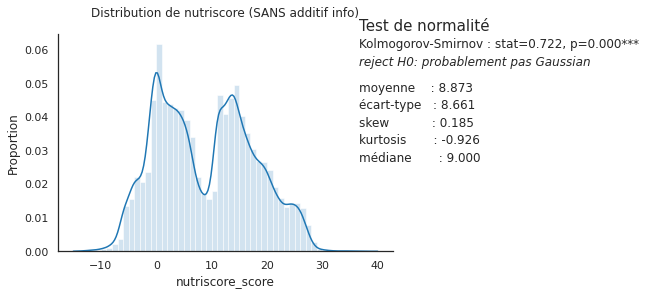

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.727, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_additif_info).png"


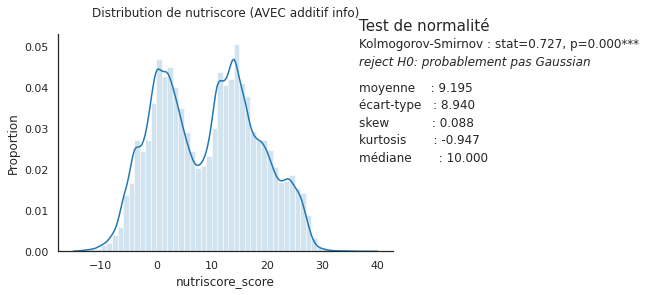

(n=603275), [190789, 412486]
Kruskal-Wallis H-test : stat=152.578, p=0.000***
les médianes sont significativement différentes (reject H0)


In [110]:
def test_nutriscore_avec_sans_additif_info(df: pd.DataFrame):
    filtre = df['additives_n'].isnull() | df['nova_group'].isnull() | df['nutriscore_score'].isnull()
    sans_additif_info = df[filtre][['nutriscore_score']].dropna()
    avec_additif_info = df[~filtre][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS additif info)', y=1.05)
    to_png()
    plt.show()
    plot_histogram(avec_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC additif info)',y=1.05)
    to_png()
    plt.show()

    groups = [
        sans_additif_info['nutriscore_score'].rename('SANS additif info'),
        avec_additif_info['nutriscore_score'].rename('AVEC additif info'),
    ]
    test_kruskal(groups, showsize=True)
    # stat,p=mannwhitneyu(x=groups[1],y=groups[2])


cleaned_data.pipe(test_nutriscore_avec_sans_additif_info)



#### 3.6.2.1 ➡️ Données sans additifs très similaires aux données avec additifs
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans info additifs est légèrement plus haut (9.4 versus 8.9)
- données sans info d'additifs sont un peu moins gras, sucré ou salé
- peut-être sont les fromages, viandes, gateaux artisanaux ?

On conclut qu'on peut supprimer les données sans additifs, et que la relation entre additifs et nutriscore applique à tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la proportion de NOVA 4 est la même
- tester si la distribution entre PNNS groupes est la même

#### 3.6.2.2 Supprime les données sans information sur les additifs de la base de données
- L'analyse des données manquantes et analyse d'intersections des données est terminé
- on peut supprimer les données sans informations sur les additifs

In [111]:
print(f'Données nettoyés : {cleaned_data.shape}')
cleaned_data = cleaned_data.dropna(
    subset=['additives_n']
)
print(f'Données nettoyés pour analyse des additifs : {cleaned_data.shape}')

Données nettoyés : (1555277, 33)
Données nettoyés pour analyse des additifs : (642532, 33)


### 3.6.3 Les données sans/avec NOVA groupe sont-ils representatives de la population ?

- H0 - les données avec NOVA groupe ont la même nutriscore distribution que les données sans information
- H1 - les données avec NOVA groupe ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.529, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_NOVA_group).png"


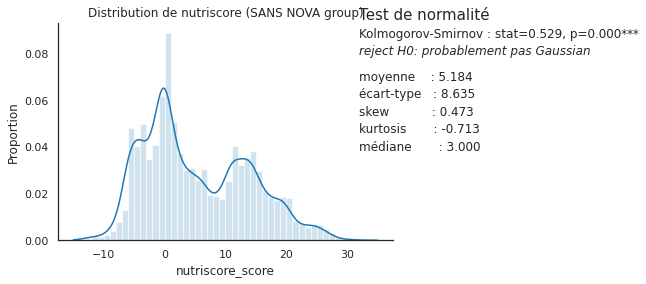

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.727, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_NOVA_group).png"


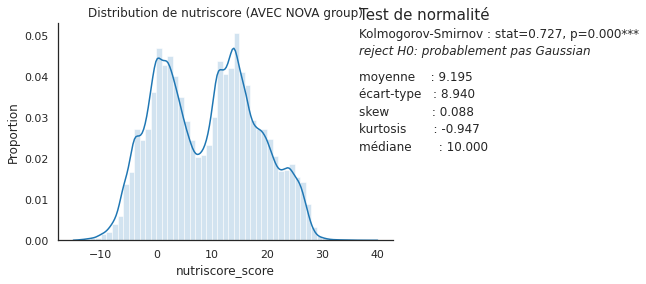

(n=440919), [28433, 412486]
Kruskal-Wallis H-test : stat=5411.935, p=0.000***
les médianes sont significativement différentes (reject H0)


In [112]:
def test_nutriscore_avec_sans_nova_group(df: pd.DataFrame):
    sans_nova_group = df[df['nova_group'].isnull()][['nutriscore_score']].dropna()
    avec_nova_group = df[df['nova_group'].notnull()][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS NOVA group)')
    to_png()
    plt.show()
    plot_histogram(avec_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC NOVA group)')
    to_png()
    plt.show()

    groups = [
        sans_nova_group['nutriscore_score'].rename('SANS nova_group'),
        avec_nova_group['nutriscore_score'].rename('AVEC nova_group'),
    ]
    test_kruskal(groups, showsize=True)


cleaned_data.pipe(test_nutriscore_avec_sans_nova_group)



#### 3.7.2.1 ➡️ Données sans nova groupe très similaires aux données avec nova_group
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans nova_group est légèrement plus bas (8.8 versus 9.2)
- données sans nova_group sont un peu moins gras, sucré ou salé
- à faire : identifier pourquoi

On conclut qu'on peut supprimer les données sans nova_group, car ils changent très peu la nutriscore de tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la distribution entre PNNS groupes est la même

## 3.7 Conclusion
Basée sur la distribution des nutriscores:
- ➡️ Les données de tous les pays peuvent être intégrés
- ➡️ Supprimer (au lieu d'imputer) les registres avec données manquantes (nombre d'additifs, nutriscore, ou groupe nova) 
 pour preserver la distribution des nutriscores 

## 3.8 Supprimer au lieu d'imputer les valeurs manquantes 
- (additifs_n, nutriscore, groupe NOVA)

In [113]:
cleaned_data= cleaned_data.dropna(subset=['additives_n', 'nutriscore_score', 'nova_group'], how='any')

---

# 4. Analyses multivariées

## 4.1 Analyses sur le nombre d'additifs

#### 4.1.1 Nombre d'additifs par nutriscore (scatterplot)

"regression_additives_n_vs_nutriscore_score_hue_None_lmplot.png"


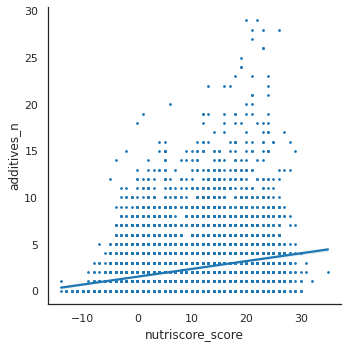

In [114]:
def plot_reg(df:pd.DataFrame, x_var='nutriscore_score', y_var='additives_n', hue='nova_group',
             nb=7, size=3, alpha=1):
    """
    Régression de 2 variables, x et y.
    Si hue est fourni, l'analyse bivariée est répetée pour chaque catégorie de hue
    """
    if hue is None:
        df2 = df[[x_var, y_var]].dropna(subset=[x_var, y_var])
    else:
        df2 = df[[x_var, y_var, hue]].dropna(subset=[x_var, y_var])
    df2[x_var] = df2[x_var].astype(np.float64)
    df2[y_var] = df2[y_var].astype(np.float64)
    if hue is None:
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       scatter_kws={'s': size, 'alpha': alpha})
        hue = 'None'
    else:
        hue_palette = get_palette_df(df, feature=hue, nb=nb)
        hue_order = list(hue_palette.keys())
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       hue=hue, hue_order=hue_order, palette=hue_palette,
                       #    x_jitter=0.2,y_jitter=0.2,
                       scatter_kws={'s': size, 'alpha': alpha})
        leg = g._legend
        # # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.1, 0.8])
        leg._loc = 6  # center left
        for lh in g._legend.legendHandles:
            lh.set_alpha(1)
            lh._sizes = [50]
            # plt.tight_layout()
    to_png(f'regression_{y_var}_vs_{x_var}_hue_{hue}_lmplot')

# sns.regplot(data=cleaned_data[['nutriscore_score', 'additives_n']].astype(np.float64),
#              x='nutriscore_score', y='additives_n',
#                        scatter_kws={'s': 3, 'alpha': 0.5})
sample_size=min(10000,len(cleaned_data))
cleaned_data.sample(sample_size).pipe(plot_reg, hue=None)


### 4.1.2 Box-plot groupé par catégorie (avec tests statistiques)
- version univariée est `plot_box(df,col)`

In [115]:
def plot_box_groupby(df:pd.DataFrame, y_var, groups_var, showfliers=True,
                     showstats=True, showtukey=False, showmeans=True):
    """P"""

    data = df[[groups_var, y_var]].dropna()
    data[y_var] = data[y_var].astype(float)
    palette = get_palette(groups_var)
    if palette is None:
        order = data[groups_var].value_counts().index.to_list()
    else:
        order = list(palette.keys())
        order.sort()
    ax = sns.boxplot(data=data, x=groups_var, y=y_var,
                     showmeans=True,
                     showfliers=showfliers,
                     palette=palette, order=order)
    ax.set_title(f'box plot de {y_var} by {groups_var}')
    sns.despine()
    if showstats:
        # Groupes
        groups = []
        categories = data[groups_var].dropna().unique()
        categories.sort()
        for categ in categories:
            groups.append(data[data[groups_var] == categ][y_var].rename(categ))

        # Normalité
        x = 1.1
        y = 1
        add_text(ax, x - 0.05, y, 'Tests de normalité des distributions', fontsize=15)
        normality = True
        y -= 0.08
        for grp in groups:
            p, ch, choix = test_normality(grp)
            if showmeans:
                add_text(ax, x, y, f'{grp.name} (mean:{grp.mean():.2f}, std:{grp.std():.2f}): {ch}')
            else:
                add_text(ax, x, y, f'{grp.name} : {ch}')
            y -= 0.08
            if p < 0.05:
                normality = False
        add_text(ax, x, y, style='italic',
                 s=f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} distribuée normalement")
        y -= 0.08
        add_text(ax, x, y, style='italic',
                 s=f" pour chaque groupe dans {groups_var}.")

        # Homoscédasticité
        y -= 0.12
        add_text(ax, x - 0.05, y, 'Test de homoscédasticité', fontsize=15)
        y -= 0.08
        stat, p, ch, choix = test_homoscedascity(groups, normality)
        add_text(ax, x, y, ch)
        y -= 0.08
        add_text(ax, x, y, style='italic', s=choix)

        alpha = 0.05
        homoscedascity = p > alpha
        if homoscedascity:

            # F-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test F-ANOVA (1-way)', fontsize=15)
            y -= 0.08
            stat, p = f_oneway(*groups)
            ch = format_stat_p(stat, p, 'F test')
            add_text(ax, x, y, ch)

        else:
            # H-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test H-ANOVA (Kruskal-Wallis)', fontsize=15)
            y -= 0.08
            p, ch, choix = test_kruskal(groups)
            add_text(ax, x, y, ch)
            y -= 0.08
            add_text(ax, x, y, choix, style='italic')

        if showtukey:
            y -= 0.12
            add_text(
                ax, x - 0.05, y, 'Pairwise Tukey HSD test (honestly significant difference)', fontsize=15)
            y -= 0.08
            results = get_pairwise_tukey_table(data, groups_var, y_var)
            results = results[results['reject'] == True]
            ch = ''
            for i in range(len(results)):
                row = results.iloc[i, :]
                ch += f"[{row['group1']}, {row['group2']}] p={row['p-adj']:.3f}; "
                if len(ch) > 10:
                    add_text(ax, x, y, ch)
                    y -= 0.08
                    ch = ''
            return results

### 4.1.2 Moyenne nombre d'additifs par nutrigrade par an (line plot)

In [116]:
def plot_column_agg_by_nutriscore_grade(df:pd.DataFrame, col='additives_n', aggfunc='mean', ylabel='moyenne', titre='',
                                        soustitre=''):
    data = (col_group_by_year(
        df, date_col='last_modified_datetime', col=col, aggfunc=aggfunc)
    )

    g = sns.relplot(data=data, kind="line",
                    palette=nutriscore_palette, linewidth=3)
    leg = g._legend
    leg.set_title('nutriscore grade')
    # # coordinates of lower left of bounding box
    leg.set_bbox_to_anchor([1.1, 0.8])
    leg._loc = 1  # upper right
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


### 4.1.3 Nombre d'additifs (moyenne) par nutriscore grade par an (lineplot)

"Moyenne_nombre_d'additifs_par_produit_(France).png"


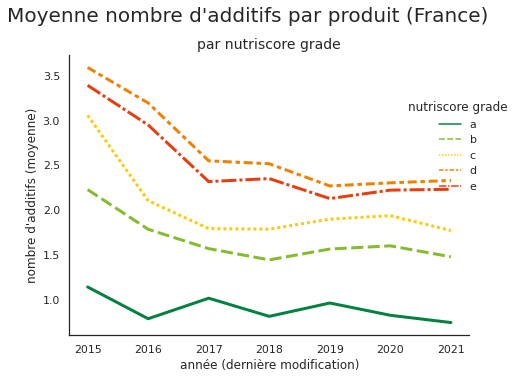

In [117]:

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_agg_by_nutriscore_grade,
       col='additives_n',
       aggfunc='mean',
       ylabel="nombre d'additifs (moyenne)",
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par nutriscore grade'
       )
 )
to_png()


### Pourcent des produits avec additifs (by tag col)

filtre:

- avec/sans additifs
- avec/sans additifs de risque modéré
- avec/sans additifs de risque élevé
- avec/sans huile de palme


"pourcent_produits_avec_additifs_(France).png"


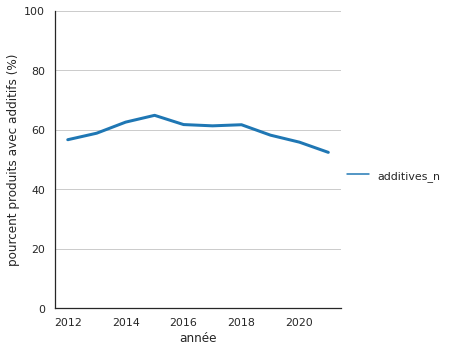

In [118]:
def percent_with_additives(series: pd.Series):
    # series=series.dropna()
    return (series > 0).count() / len(series)


def plot_freq_additives_by_year(df: pd.DataFrame, col='additives_n', groupby_var='nutriscore_grade', aggfunc='mean', date_col='created_datetime'):
    """Visualiser l'évolution dans le temps, basé sur date_col"""
    with_additives = df.pipe(col_group_by_year, groupby_var=groupby_var,
                             col=col, aggfunc=lambda x: (x > 0).sum(), date_col=date_col)
    # print(no_additives.head())
    totals = df.pipe(col_group_by_year, groupby_var=groupby_var,
                     col=col, aggfunc=len, date_col=date_col)
    # print(totals.head())
    frequency = with_additives / totals * 100
    g = sns.relplot(data=frequency, kind="line",
                    palette=get_palette(groupby_var), linewidth=3)
    ax = plt.gca()
    ax.set_ylim(0, 100)
    ax.set_xlabel('année')
    ax.set_ylabel('pourcent produits avec additifs (%)')
    ax.yaxis.grid(True)  # Hide the horizontal gridlines
    # ax.xaxis.grid(True) # Show the vertical gridlines
    return frequency


(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(plot_freq_additives_by_year, groupby_var=None)
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additifs (France)")


"Pourcentage_de_produits_avec_additifs_(France).png"


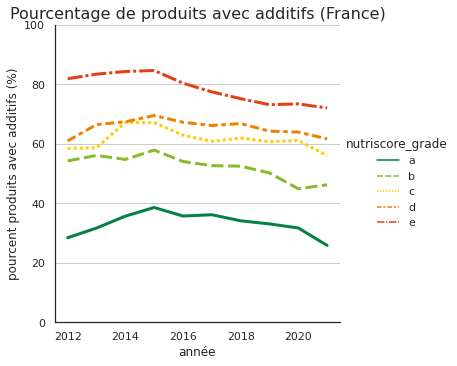

In [119]:
(cleaned_data
        .pipe(filter_by_country, 'France')
        .pipe(plot_freq_additives_by_year, groupby_var='nutriscore_grade', date_col='created_datetime')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)

plt.title('Pourcentage de produits avec additifs (France)', size=16)
sns.despine()
to_png()


"pourcent_produits_avec_additives_-_NOVA_group_(France).png"


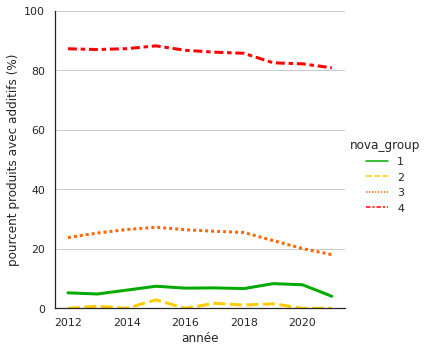

In [120]:
(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        .pipe(plot_freq_additives_by_year, groupby_var='nova_group')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additives - NOVA group (France)")


### 4.1.2 Fréquence (distribution) de nombre d'additifs par nutriscore grade


In [121]:
def plot_column_mean_by_tag(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = (col_group_by_year(df, date_col='last_modified_datetime', col=col, aggfunc='mean')
            .droplevel(0, axis='columns'))
    ax = data.plot(kind='line', color=nutriscore_palette.values())
    # ax = sns.relplot(data=data, kind="line", color=nutriscore_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'nutriscore grade',
               bbox_to_anchor=(1.1, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()

### Nombre d'additifs par groupe NOVA

"additifs_par_produit_-_NOVA_group_(France).png"


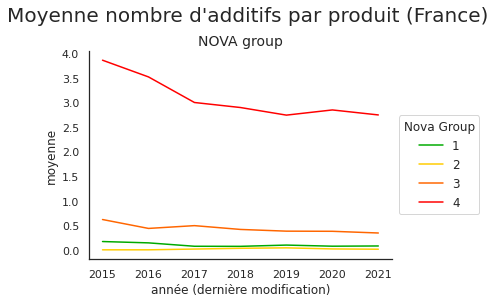

In [123]:
def plot_column_mean_by_nova_group(df:pd.DataFrame, col='unsafe', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='nova_group',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    ax = data.plot(kind='line', color=nova_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'Nova Group',
               bbox_to_anchor=(1.05, 0.5), loc="right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    # plt.legend(title=f'Nova Group',loc="upper right", fontsize=12)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_nova_group,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='NOVA group'
       )
 )
to_png("additifs par produit - NOVA group (France)")


In [124]:
def count_group_by_year(df: pd.DataFrame, groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    """Compter l'évolution dans le temps, basé sur date_col"""
    count_by_year: pd.DataFrame = (df[[groupby_var, date_col]]
                                   .groupby(by=[groupby_var, df[date_col].dt.year], dropna=True).agg('count')
                                   .rename(columns={date_col: 'effectif'}))
    total_by_yr: pd.DataFrame = (count_by_year
                                 .groupby(level=1, dropna=True).sum()
                                 .rename(columns={'effectif': 'total'}))
    evol_by_year = (count_by_year.join(total_by_yr, how="left", on=date_col))
    evol_by_year['freq'] = (evol_by_year['effectif'] /
                            evol_by_year['total']) * 100
    return evol_by_year


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2014, 2021)
 .pipe(count_group_by_year, date_col='last_modified_datetime')['freq']
 .unstack().style.background_gradient(axis=1)).set_precision(1)


last_modified_datetime,2014,2015,2016,2017,2018,2019,2020,2021
nutriscore_grade,,,,,,,,
a,16.0,16.8,16.3,11.5,9.8,13.6,12.9,16.6
b,11.7,14.8,10.5,11.8,11.7,14.4,12.9,14.6
c,22.3,21.3,21.9,19.3,20.7,23.4,21.6,22.3
d,26.6,26.9,33.2,30.0,30.0,27.7,31.4,28.4
e,23.4,20.2,18.1,27.4,27.8,21.0,21.3,18.1


## 4.2 Analyses sur le nutriscore grade
### 4.2.1 Nutriscore Grade par année (stacked bar chart)

In [125]:

def plot_groupvar_by_year(df:pd.DataFrame, groupby_var='nutriscore_grade', palette=nutriscore_palette,
                          legend=None, titre='', soustitre=''):
    """Affiche fréquence des catégories stacked par an """
    effectif_group_by_year = df.pipe(
        count_group_by_year, groupby_var=groupby_var, date_col='last_modified_datetime')
    ax = (effectif_group_by_year['freq'].unstack(level=0)
          .plot(kind='bar', stacked=True, color=palette.values()))
    if legend is None:
        legend = groupby_var
    plt.legend(title=f'{legend}',
               bbox_to_anchor=(1.1, 0.5), loc="center left", fontsize=12)
    ax.set_xlabel('année (dernière modification)', size=14)
    ax.set_ylabel('produits (%)', size=14)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


"Distribution_nutriscore_par_année_(France).png"


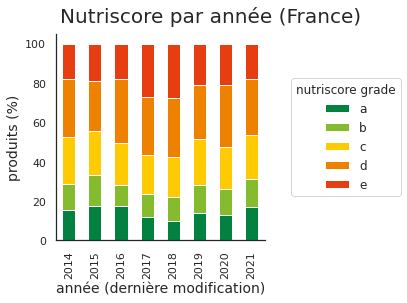

In [126]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nutriscore_grade',
       legend='nutriscore grade',
       palette=nutriscore_palette,
       titre="Nutriscore par année (France)"
       #    soustitre='pour les produits ayant un nutriscore')
       ))
to_png('Distribution_nutriscore_par_année_(France)')


### Nombre d'additifs par an

In [127]:

# evol_by_year.reset_index()['freq'].plot(hue=evol_by_year[groupby_var])
additives_by_year = cleaned_data.pipe(
    count_group_by_year, groupby_var='additives_n')
additives_by_year


effectif   total       freq
additives_n last_modified_datetime                             
0           2012                           4       9  44.444444
            2013                          17      52  32.692308
            2014                          81     293  27.645051
            2015                         643    1893  33.967248
            2016                         880    2151  40.911204
...                                      ...     ...        ...
33          2020                           1  231385   0.000432
            2021                           1  131530   0.000760
36          2019                           1   28122   0.003556
38          2019                           1   28122   0.003556
39          2020                           1  231385   0.000432

[205 rows x 3 columns]

"Distribution_novagroup_par_année_(France).png"


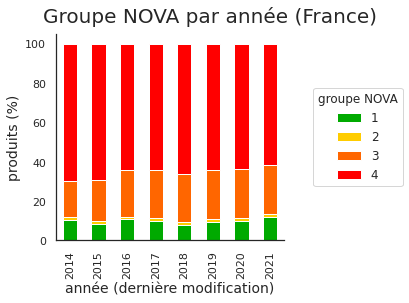

In [128]:
(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='groupe NOVA',
       palette=nova_palette,
       titre="Groupe NOVA par année (France)"
       )
 )
to_png('Distribution_novagroup_par_année_(France)')


"Distribution_novagroup_par_année_(Espagne).png"


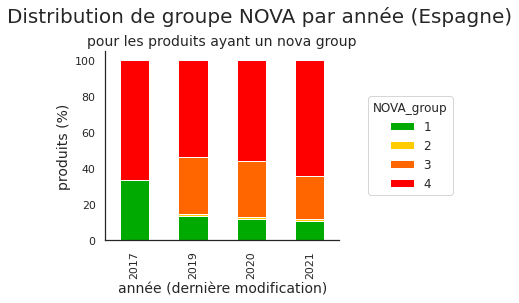

In [129]:
(cleaned_data
 .pipe(filter_by_country, 'Spain')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Espagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Espagne)')


"Distribution_novagroup_par_année_(Allemagne).png"


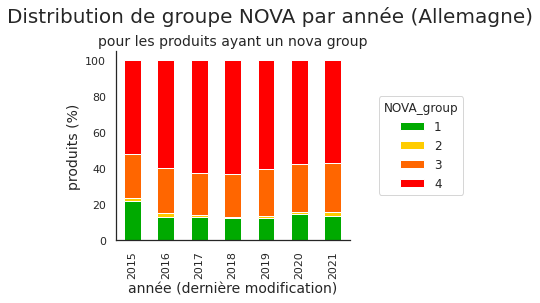

In [130]:
(cleaned_data
 .pipe(filter_by_country, 'Germany')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Allemagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Allemagne)')

"Distribution_de_nutriscore_grade_par_pays.png"


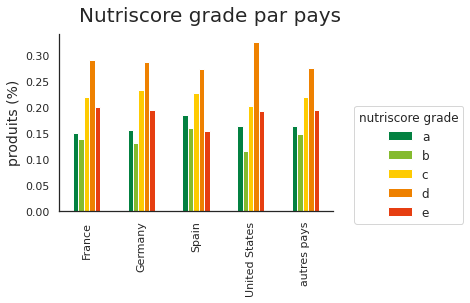

In [131]:
def freq_group_by_tag(df: pd.DataFrame, col='countries_en',
                      groupby_var='nutriscore_grade',
                      nb=10,
                      others=True,
                      others_name='others'
                      ):
    """Comparer les groupes, basé sur country
    Exemple :
        distribution de nutriscore by country
        distribution de nutriscore by brand
        distribution de nutriscore by pnns_group
        distribution de novagroup by country
        distribution de 

    Si les deux variables sont catégoriques, on peut faire un crosstab
    """
    df = explode_frame(df[[groupby_var, col]], col)
    nb = max(1, nb)
    top = df[col].value_counts()[:nb]
    if others:
        df[col] = df[col].where(
            df[col].isna() | df[col].isin(top.index), other=others_name)
    else:
        df = df.where(df[col].isna() | df[col].isin(top.index))
    return pd.crosstab(df[groupby_var], df[col], normalize='columns')


(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nutriscore_grade',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 # .plot(kind='bar', stacked=True, color=nutriscore_palette.values())
 .plot(kind='bar', stacked=False, color=nutriscore_palette.values())
 # .plot(kind='line', color=nutriscore_palette.values())
 )

plt.legend(title='nutriscore grade',
           bbox_to_anchor=(1.1, 0.5), loc="right", fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Nutriscore grade par pays', size=20, y=1.05)
# plt.title('pour produits ayant un nutriscore', size=14)
plt.tight_layout()
to_png('Distribution de nutriscore grade par pays')


"Distribution_de_groupe_NOVA_par_pays.png"


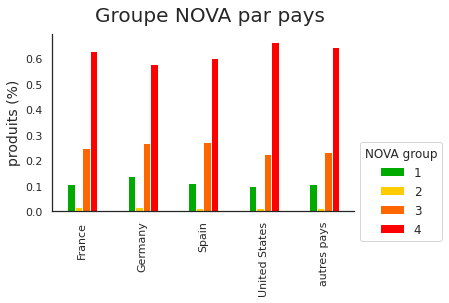

In [132]:
(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nova_group',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 .plot(kind='bar', stacked=False, color=nova_palette.values())
 )

plt.legend(title='NOVA group',
           bbox_to_anchor=(1.05, 0.6), loc=1, fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Groupe NOVA par pays', size=20, y=1.05)
plt.tight_layout()
to_png('Distribution de groupe NOVA par pays')


"Proportion_de_produits_ayant_un_nombre_d'additifs_par_année.png"


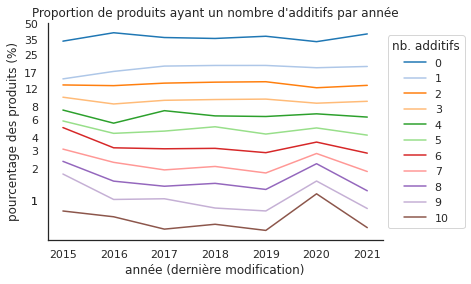

In [133]:
from matplotlib.ticker import FormatStrFormatter

additives_by_year.unstack(level=0)['freq'].iloc[3:, :11].plot()
plt.xlabel('année (dernière modification)')
plt.ylabel('pourcentage des produits (%)')
plt.yscale('log')
plt.gca().set_yticks(np.geomspace(1, 50, 12).round())
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d'))
plt.legend(title='nb. additifs', loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Proportion de produits ayant un nombre d'additifs par année")
sns.despine()
to_png("Proportion de produits ayant un nombre d'additifs par année")


In [134]:
additives_by_year.unstack(level=0)['freq'].T


last_modified_datetime,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
additives_n,,,,,,,,,,
0,44.444444,32.692308,27.645051,33.967248,40.911204,36.803714,36.050132,37.856482,33.586447,39.862389
1,33.333333,26.923077,23.890785,14.738510,17.387262,19.562334,19.837152,19.842116,18.864231,19.400897
2,NaN,9.615385,9.897611,12.889593,12.691771,13.417330,13.706394,13.839698,12.113145,12.773512
3,11.111111,11.538462,13.310580,9.825674,8.461181,9.173298,9.331843,9.423227,8.606435,8.975139
4,NaN,5.769231,7.849829,7.395668,5.532311,7.294430,6.497964,6.411351,6.802515,6.330115
...,...,...,...,...,...,...,...,...,...,...
32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001297,NaN
33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000432,0.000760
36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003556,NaN,NaN


### Est-ce que les valeurs moyennes des additifs, valeurs nutritionnelles ont changé pendant le temps ?


In [135]:
# pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option("precision", 2)
(cleaned_data
 .groupby(cleaned_data['last_modified_datetime'].dt.year).mean()
 .style.bar(color='#33d65f50')
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
last_modified_datetime,,,,,,,,,,,,,
2012,1.22,0.00,0.00,10.00,1270.89,17.69,9.78,28.17,17.28,4.75,7.97,0.32,15.06
2013,1.94,0.04,0.19,10.62,1130.79,13.39,4.56,30.56,14.52,1.96,7.04,1.06,12.17
2014,2.36,0.03,0.20,9.90,1161.79,15.63,6.71,26.34,14.83,1.99,7.31,0.38,11.63
2015,2.54,0.05,0.16,8.61,1041.45,13.00,5.34,24.36,11.39,2.22,8.13,0.45,10.60
2016,2.00,0.04,0.12,9.52,1127.14,14.22,5.98,25.97,12.77,2.72,8.91,0.43,11.45
2017,1.99,0.05,0.13,10.23,1136.28,14.44,5.72,27.10,14.62,2.53,7.60,0.38,12.30
2018,2.03,0.05,0.14,10.54,1160.75,14.71,6.11,28.18,15.64,2.50,7.49,0.44,11.27
2019,1.89,0.04,0.12,8.97,1087.99,13.59,5.38,25.64,13.03,2.61,8.07,0.45,11.96
2020,2.58,0.01,0.06,9.46,1183.79,13.49,4.93,33.04,15.03,2.76,7.94,0.48,7.16


In [136]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .groupby(cleaned_data['created_datetime'].dt.year).mean()
 .style.bar()
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
created_datetime,,,,,,,,,,,,,
2012,1.72,0.05,0.16,7.77,1071.28,12.33,5.25,27.98,12.00,2.61,7.61,0.37,12.36
2013,1.80,0.06,0.17,7.75,1111.09,13.29,5.48,28.21,12.51,2.57,7.56,0.37,13.97
2014,1.99,0.05,0.18,8.24,1103.83,13.66,5.49,26.80,12.17,2.45,7.62,0.39,12.95
2015,2.18,0.07,0.17,8.70,1113.77,13.70,5.46,27.14,12.67,2.67,7.77,0.40,13.27
2016,1.94,0.06,0.14,8.84,1139.06,14.22,5.58,27.23,12.72,2.97,8.13,0.39,13.79
2017,1.88,0.05,0.14,9.35,1139.94,14.19,5.53,27.40,13.81,2.65,7.89,0.40,13.41
2018,1.85,0.05,0.13,9.99,1166.57,14.42,5.81,28.40,15.12,2.95,7.96,0.39,12.28
2019,1.70,0.04,0.11,8.95,1141.70,14.15,5.63,27.24,14.11,3.28,8.08,0.35,13.74
2020,1.55,0.03,0.10,8.01,1125.64,13.87,5.34,26.65,12.54,3.48,8.49,0.37,13.57


### 4.1.4 Additives by nutriscore grade (descriptive)


In [137]:
cleaned_data[['additives_n', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                    65939.0  0.87  1.73  0.0  0.0  0.0  1.0  30.0
b                    53937.0  1.79  2.46  0.0  0.0  1.0  3.0  25.0
c                    88236.0  2.11  2.72  0.0  0.0  1.0  3.0  33.0
d                   125705.0  2.85  3.32  0.0  0.0  2.0  4.0  39.0
e                    78669.0  3.06  3.65  0.0  1.0  2.0  4.0  33.0

In [138]:
(cleaned_data
 .pipe(filter_by_country, 'france')[['additives_n', 'nutriscore_grade']]
 .groupby('nutriscore_grade').describe(percentiles=None)
 )


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                    22830.0  0.78  1.53  0.0  0.0  0.0  1.0  30.0
b                    21118.0  1.53  2.17  0.0  0.0  1.0  2.0  19.0
c                    33512.0  1.85  2.33  0.0  0.0  1.0  3.0  22.0
d                    44217.0  2.35  2.82  0.0  0.0  1.0  4.0  30.0
e                    30423.0  2.26  2.34  0.0  1.0  2.0  3.0  24.0

On note qu'il y jusqu'à 21 additifs pour le meilleur nutriscore grade !!


"additives_n_vs_nutriscore_grade_boxplot.png"


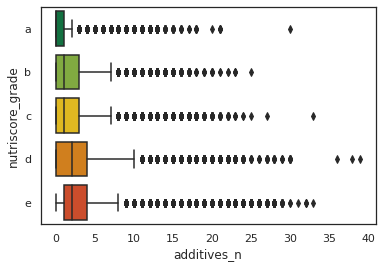

In [139]:
sns.boxplot(data=cleaned_data, y='nutriscore_grade', x='additives_n',
            palette=nutriscore_palette, order=nutriscore_order)
to_png('additives_n_vs_nutriscore_grade_boxplot')


### 4.1.4 Nombre d'additifs (distributions) par nutriscore grade (kdeplot)


"additives_n_vs_nutriscore_grade_kdeplot.png"


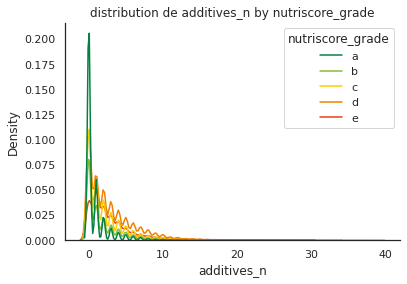

In [140]:
def plot_kde(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    df[y_var]=df[y_var].astype(np.float64)
    palette = get_palette(groups_var)
    order = list(palette.keys())
    order.sort()
    g = sns.kdeplot(data=df, x=y_var, hue=groups_var,
                    palette=palette, hue_order=order)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()

plot_kde(cleaned_data,groups_var='nutriscore_grade', y_var='additives_n')
to_png('additives_n_vs_nutriscore_grade_kdeplot')


#### 4.1.4.1 Nombre d'additifs distribution par nutriscore_score (joint plots)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot.png"


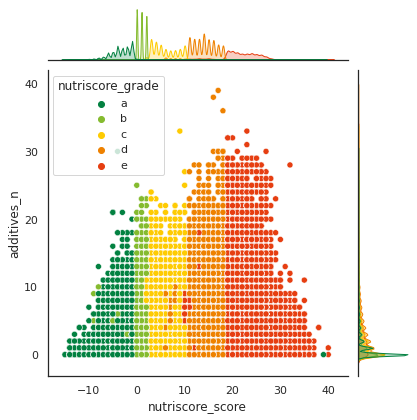

In [141]:
# Error warnings si pandas < 1.3.0
data=cleaned_data[['nutriscore_score','additives_n','nutriscore_grade','countries_en']].copy()
data['additives_n']=data['additives_n'].astype(np.float64)
g=sns.jointplot(data=data, x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
g.ax_joint.legend(loc='upper left', title='nutriscore_grade')
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot')


#### 4.1.4.2 C'est répresentatif de la France ? (jointplot)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france.png"


/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


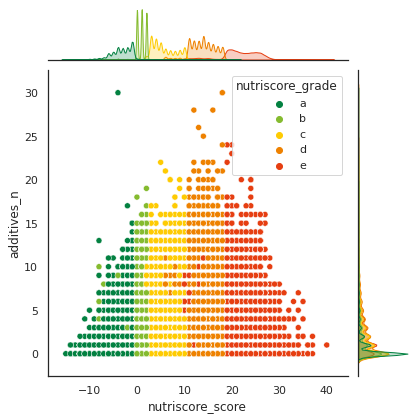

In [142]:
sns.jointplot(data=data.pipe(filter_by_country, 'france'),
              x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
g.ax_joint.legend(loc='upper left', title='nutriscore_grade')
del data
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france')


#### 4.1.4.3 Essaie (sans succès) de mettre la densité dans le scatter plot (hexbin jointplot)

- trop d'information
- il y a d'autres plus interessant


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin.png"


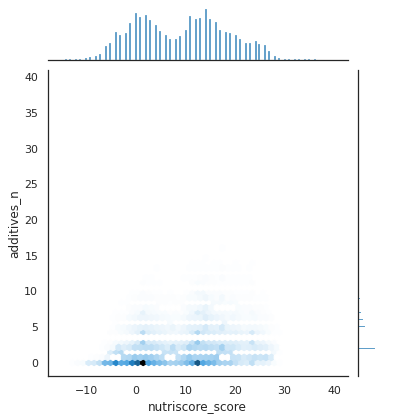

In [143]:
sns.jointplot(data=cleaned_data, kind='hex', x='nutriscore_score',
              y='additives_n', palette=nutriscore_palette)
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin')


---

# 5. Analyse des additifs (par tag)

_"Les additifs alimentaires sont des substances ajoutées intentionnellement aux aliments pour exercer certaines fonctions technologiques spécifiques, par exemple pour colorer, sucrer ou contribuer à la conservation des aliments."_

_"Dans l’Union européenne, tous les additifs alimentaires sont identifiés par un numéro commençant par « E ». Les additifs alimentaires sont toujours inclus dans la liste des ingrédients des aliments auxquels ils sont ajoutés. L’étiquetage du produit doit mentionner tant la fonction de l’additif dans le produit fini (par ex. colorant, conservateur) que la substance spécifique utilisée, soit en se référant au numéro E correspondant ou à son nom (ex. E 415 ou gomme xanthane)."_

_"Les additifs les plus communs mentionnés sur les étiquettes sont les antioxydants (qui empêchent la détérioration due à l'oxydation), les colorants, les émulsifiants, les stabilisateurs, les agents gélifiants et épaississants, les conservateurs et les édulcorants."_

- <https://www.efsa.europa.eu/fr/topics/topic/food-additives>


"fat_100g_vs_nutriscore_grade_boxplot.png"


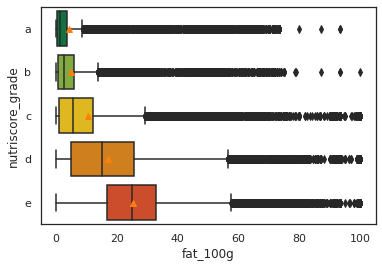

"saturated-fat_100g_vs_nutriscore_grade_boxplot.png"


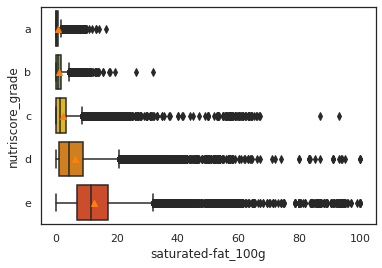

"carbohydrates_100g_vs_nutriscore_grade_boxplot.png"


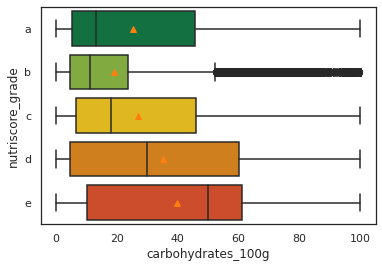

"sugars_100g_vs_nutriscore_grade_boxplot.png"


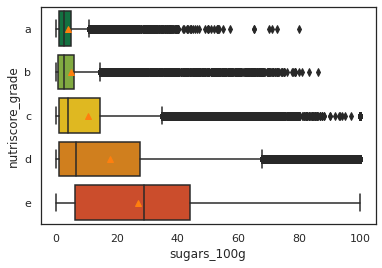

"fiber_100g_vs_nutriscore_grade_boxplot.png"


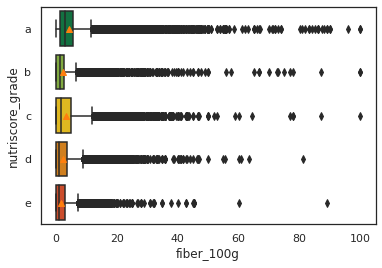

"proteins_100g_vs_nutriscore_grade_boxplot.png"


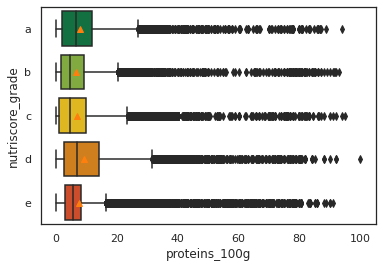

"sodium_100g_vs_nutriscore_grade_boxplot.png"


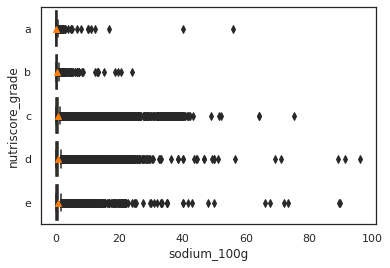

"fruits-vegetables-nuts-estimate-from-ingredients_100g_vs_nutriscore_grade_boxplot.png"


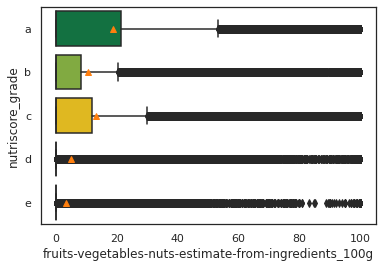

In [144]:
for col in colonnes_100g:
    sns.boxplot(data=cleaned_data, y='nutriscore_grade', x=col, showmeans=True,
                palette=nutriscore_palette, order=nutriscore_order)
    to_png(f'{col}_vs_nutriscore_grade_boxplot')
    plt.show()


"colonnes_nutritionnelles_boxplot.png"


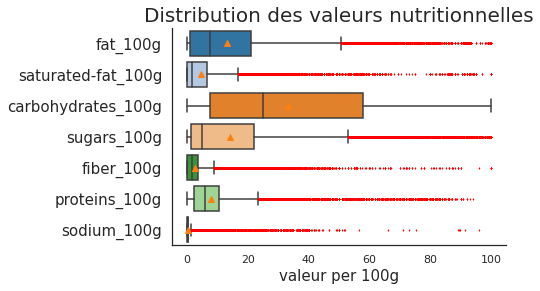

"colonnes_nutritionnelles_(France)_boxplot.png"


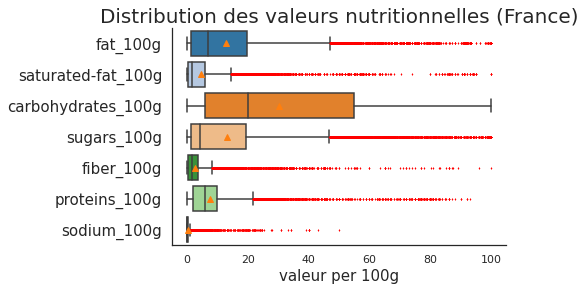

"colonnes_nutritionnelles_(United_states)_boxplot.png"


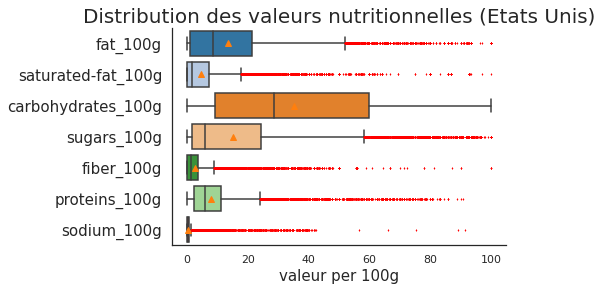

In [145]:
def cols_nutritionnelles_not_fln(df:pd.DataFrame):
    return df.columns[
        (df.columns.str.endswith('_100g'))
        & ~(df.columns.str.contains('energy'))
        & ~(df.columns.str.contains('estimate'))
        ]


colonnes_100g_not_fln = cleaned_data.pipe(cols_nutritionnelles_not_fln)


def plot_box_colonnes_100g(df:pd.DataFrame, colonnes=colonnes_100g_not_fln):
    colonnes = cols_in_df(df, colonnes)
    data = df[colonnes].dropna()
    flierprops = dict(markerfacecolor='red', markersize=2,
                      markeredgecolor='None')
    g = sns.boxplot(data=pd.melt(data), y='variable', x='value',
                    showmeans=True, showfliers=True, flierprops=flierprops)
    labels = g.get_yticklabels()
    g.set_yticklabels(labels, fontsize=15)
    g.set_title(f'box plot des colonnes nutritionnelles')
    g.set_xlabel('valeur per 100g', fontsize=15)
    g.set_ylabel('')
    sns.despine()


(cleaned_data
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles', size=20)
to_png('colonnes nutritionnelles boxplot')
plt.show()

# Est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (France)', size=20)
to_png('colonnes nutritionnelles (France) boxplot')
plt.show()

# est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (Etats Unis)', size=20)
to_png('colonnes nutritionnelles (United states) boxplot')


## 4.3 Analyses sur le nutriscore score

### 4.3.1 Nutriscore score par pays
#### 4.3.1.1 Est-ce que les nutriscores ont la même distribution pour tous les pays? 

Kolmogorov-Smirnov [France] : stat=0.732, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Germany] : stat=0.729, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Spain] : stat=0.676, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [United States] : stat=0.733, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=389055), [152091, 29638, 17381, 189945]
Levene homoscédasticité : stat=15.694, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=575.906, p=0.000***
les médianes sont significativement différentes (reject H0)
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
"nutriscore_score_par_pays_box_plot.png"


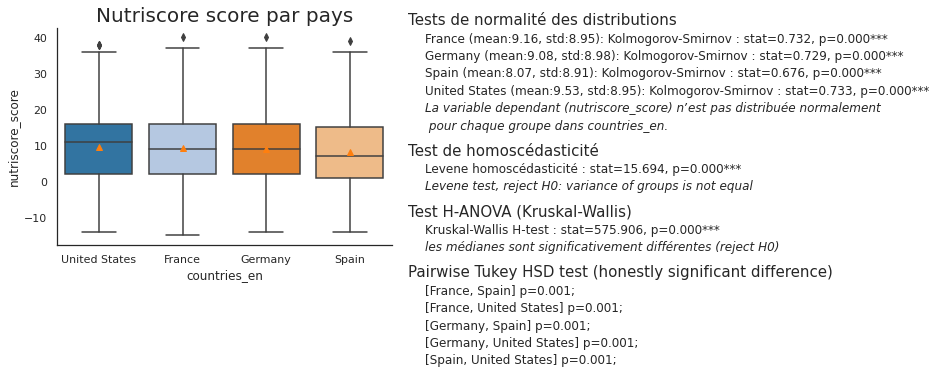

In [146]:
def plot_colonne_mean_by_top_categories(df:pd.DataFrame, y_var='nutriscore_score', groups_var='countries_en', nb=4):
    data = df[[y_var, groups_var]].dropna()
    data = explode_frame(data, groups_var)
    categories = data[groups_var].value_counts()
    nb = min(len(categories), nb)
    top_categories = categories.head(nb).index.to_list()
    top_categories.sort()

    # exclure les autres categories qui ne sont pas dans le plus frequent
    data = data[data[groups_var].isin(top_categories)]

    # Groupes
    # groups=group_by_groups(data,y_var, groups_var)
    plot_box_groupby(data, y_var, groups_var, showtukey=True)


cleaned_data.pipe(plot_colonne_mean_by_top_categories, y_var='nutriscore_score', groups_var='countries_en')
plt.title('Nutriscore score par pays', fontsize=20)
to_png('nutriscore_score_par_pays_box_plot')

## 5.1 Import des données des additifs


In [147]:
additives_detail = (pd.read_csv(os_path_join(OUT_FOLDER, ADDITIVES_DETAIL),
                                encoding='UTF-8', sep='\t')
                    .pipe(drop_colonnes_sans_nom))
additives_detail.info(verbose=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 655 entries, 0 to 654
Columns: 28 entries, id to efsa_evaluation_exposure_mean_greater_than_noael
dtypes: float64(1), object(27)
memory usage: 143.4+ KB


In [148]:
print(list(additives_detail.columns))


['id', 'efsa_evaluation', 'name', 'efsa_evaluation_date', 'vegetarian', 'efsa_evaluation_url', 'e_number', 'vegan', 'wikidata', 'efsa', 'additives_classes', 'efsa_evaluation_overexposure_risk', 'efsa_evaluation_adi', 'from_palm_oil', 'efsa_evaluation_exposure_95th_greater_than_adi', 'efsa_evaluation_exposure_mean_greater_than_adi', 'colour_index', 'description', 'efsa_evaluation_adi_established', 'efsa_evaluation_safety_assessed', 'organic_eu', 'mandatory_additive_class', 'comment', 'default_additive_class', 'ciqual_food_name', 'ciqual_food_code', 'efsa_evaluation_exposure_95th_greater_than_noael', 'efsa_evaluation_exposure_mean_greater_than_noael']


## 5.2 Filtre les classes d'additifs par ceux qui sont present dans la base de données


In [149]:
def filtre_additive_classes(detail=additives_detail, data_df=cleaned_data):
    # TODO
    additives_in_data = (pd.DataFrame(
        explode_series(data_df['additives_tags'].dropna()).unique(), columns={'id'})
                         .set_index('id')
                         )
    additives_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                          .set_index('id')
                          )
    additives_maybe_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_that_may_be_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                                .set_index('id')
                                )
    # print(additives_palm_oil.index.tolist())
    # print(additives_maybe_palm_oil.index.tolist())
    detail = detail.copy().set_index('id')

    # check tous les additifs dans data sont present dans détail
    palm_not_in_detail = list(set(additives_palm_oil.index) - set(detail.index))
    maybe_palm_not_in_detail = list(
        set(additives_maybe_palm_oil.index) - set(detail.index))
    add_not_in_detail = list(set(additives_in_data.index) - set(detail.index))
    add_not_in_data = list(set(detail.index) - set(additives_in_data.index))
    add_in_both = list(set(detail.index) - set(add_not_in_data))
    add_palm_oil_not_in_additives_tags = list(
        set(additives_palm_oil.index) - set(additives_in_data.index))
    add_maybe_palm_oil_not_in_additives_tags = list(
        set(additives_maybe_palm_oil.index) - set(additives_in_data.index))
    print(f'not_in_data: {len(add_not_in_data)}')
    print(f'palm_not_in_data: {len(add_palm_oil_not_in_additives_tags)}')
    print(
        f'palm_maybe_not_in_data: {len(add_maybe_palm_oil_not_in_additives_tags)}')

    print(f'palm_not_in_detail: {len(palm_not_in_detail)}')
    print(f'palm_maybe_not_in_detail: {len(maybe_palm_not_in_detail)}')

    # on ne peut pas rassemble les additifs d'huile de palme avec additives_tags

    print(f'not_in_detail: {add_not_in_detail}')
    print(f'both: {len(add_in_both)}')
    print(f'nb additive classes in data ={len(additives_in_data)}')
    print(f'nb additive classes in additives_detail ={len(detail)}')

    detail = detail.join(additives_in_data, how='inner').reset_index()
    print(f'nb additive classes in additives_detail ={len(detail)}')
    return detail


print(additives_detail.shape)
additives_detail = filtre_additive_classes(additives_detail, cleaned_data)
print(additives_detail.shape)


(655, 28)
not_in_data: 141
palm_not_in_data: 5
palm_maybe_not_in_data: 19
palm_not_in_detail: 5
palm_maybe_not_in_detail: 19
not_in_detail: []
both: 514
nb additive classes in data =514
nb additive classes in additives_detail =655
nb additive classes in additives_detail =514
(514, 28)


### 5.2.1 Conclusion : Huile de palme est un ingrédient, pas un additif !!!

On voit que les additifs d'huile de palme ne sont pas considérés comme additifs

- Peut-être à ajouter


## 5.3 Additives present dans plus de 100 produits


In [150]:
def frequent_additives_tags(df:pd.DataFrame, min_count=100):
    freq = explode_series(df['additives_tags'].dropna()).value_counts()
    freq = freq[freq.values >= min_count]
    return freq


freq_add = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(frequent_additives_tags)
            )
freq_add.head()


en:e330     24185
en:e322     18729
en:e322i    16405
en:e14xx    13695
en:e500     12938
Name: additives_tags, dtype: int64

### 5.3.1 Filtre les produits par additives tags


In [151]:
def filter_by_additives_tags(df:pd.DataFrame, additives_tags_list=None, min_count=100):
    if additives_tags_list is None:
        additives_tags_list = frequent_additives_tags(
            df, min_count=min_count).index.tolist()
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(additives_tags_list)]
    return add_df


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, min_count=1)
 ).head()


,additives_tags
21,en:e100
21,en:e120
21,en:e14xx
21,en:e150d
21,en:e153


### 5.4.2 Obtient l'étiquette pour un tag


In [152]:
print(additives_detail.shape)
add_labels = dict(list(zip(additives_detail['id'], additives_detail['name'])))


def get_additive_labels(additives_tags_list):
    return [add_labels[x] for x in additives_tags_list]


get_additive_labels(['en:e100', 'en:e412', 'en:e415'])


(514, 28)


['E100 - Curcumin', 'E412 - Guar gum', 'E415 - Xanthan gum']

## 5.5 Classes d'additifs


### 5.5.1 Chaque additif peut avoir plusieurs rôles


In [153]:
additives_detail.pipe(calc_tag_intersections, 'additives_classes')


Nombre de top 3 tags dans colonne "additives_classes"
en:stabiliser : 159 produits
en:emulsifier : 128 produits
en:thickener : 126 produits
en:stabiliser & en:emulsifier : 109 produits
en:stabiliser & en:thickener : 114 produits
en:emulsifier & en:thickener : 90 produits
en:stabiliser & en:emulsifier & en:thickener : 87 produits


### 5.5.2 Nombre d'additifs de chaque classe

- il sera très interressant de corréler les additifs dans les produits avec les classes d'additif
- c'est dehors de la portée de ce projet


"Classes_d'additifs_présents_dans_les_aliments.png"


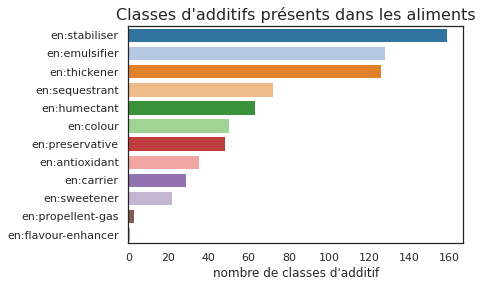

In [154]:
additive_classes = (explode_series(additives_detail['additives_classes'])
                    .value_counts(ascending=False)
                    .to_frame('effectif'))

ax = sns.barplot(y=additive_classes.index, x=additive_classes['effectif'])
ax.set_xlabel("nombre de classes d'additif")
plt.title("Classes d'additifs présents dans les aliments", size=16)
to_png()


## 5.6 Additifs nocifs pour la santé

- <https://github.com/openfoodfacts/openfoodfacts-server/issues/1374>
- <https://www.efsa.europa.eu/en/topics/topic/food-additives>


In [155]:
additives_detail['efsa_evaluation_overexposure_risk'].value_counts()


en:high        38
en:no          13
en:moderate    13
Name: efsa_evaluation_overexposure_risk, dtype: int64

In [156]:
def get_unsafe_additives(detail: pd.DataFrame, tags=('high', 'moderate')):
    if type(tags) is str:
        tags = [tags]
    tags = '|'.join(tags)
    filtre = detail['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return detail[filtre]


print(f"high : {len(get_unsafe_additives(additives_detail, tags='high'))}")
print(f"moderate : {len(get_unsafe_additives(additives_detail, tags='moderate'))}")

unsafe_additives_df = get_unsafe_additives(additives_detail)
print(f"total nombre d'additifs nocifs: {len(unsafe_additives_df)}")

additives_detail.pipe(get_unsafe_additives, 'high')
additives_detail.pipe(get_unsafe_additives, 'moderate')

print(unsafe_additives_df['name'].to_list())


high : 38
moderate : 13
total nombre d'additifs nocifs: 51
['E482 - Calcium stearoyl-2-lactylate', 'E432 - Polyoxyethylene sorbitan monolaurate', 'E228 - Potassium bisulphite', 'E493 - Sorbitan monolaurate', 'E243 - Ethyl lauroyl arginate', 'E131 - Patent blue v', 'E407 - Carrageenan', 'E133 - Brilliant blue FCF', 'E494 - Sorbitan monooleate', 'E436 - Polyoxyethylene sorbitan tristearate', 'E213 - Calcium benzoate', 'E339 - Sodium phosphates', 'E509 - Calcium chloride', 'E200 - Sorbic acid', 'E481 - Sodium stearoyl-2-lactylate', 'E223 - Sodium metabisulphite', 'E150c - Ammonia caramel', 'E251 - Sodium nitrate', 'E220 - Sulphur dioxide', 'E202 - Potassium sorbate', 'E407a - Processed eucheuma seaweed', 'E451 - Triphosphates', 'E252 - Potassium nitrate', 'E155 - Brown ht', 'E341 - Calcium phosphates', 'E221 - Sodium sulphite', 'E211 - Sodium benzoate', 'E508 - Potassium chloride', 'E212 - Potassium benzoate', 'E226 - Calcium sulphite', 'E492 - Sorbitan tristearate', 'E433 - Polyoxyethyle

In [157]:
def get_safe_additives(df:pd.DataFrame):
    tags = 'high|moderate'
    filtre = df['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return df[~filtre]


safe_additives_df = additives_detail.pipe(get_safe_additives)
print(len(safe_additives_df))
safe_additives_df[['id', 'name']]



463


,id,name
0,en:e1412,E1412 - Distarch phosphate
1,en:e100,E100 - Curcumin
3,en:e543,E543 - E543 food additive
4,en:e1404,E1404 - Oxidised starch
5,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids
...,...,...
509,en:e460,E460 - Cellulose
510,en:e999,E999 - Quillaia extract
511,en:e903,E903 - Carnauba wax
512,en:e160aii,E160aii - Plant carotenes


### 5.7.1 Huile de palme: Additifs qui peuvent accélérer le metastasis de cancer

"Dietary palmitic acid promotes a prometastatic memory via Schwann cells"

"we show that **dietary palmitic acid (PA)**, but not oleic acid or linoleic acid, **promotes metastasis** in oral carcinomas and melanoma"

Article :

- <https://www.nature.com/articles/s41586-021-04075-0>
- <https://doi.org/10.1038/s41586-021-04075-0>


In [158]:
def tag_colonnes(df:pd.DataFrame):
    return df.columns[df.columns.str.contains(',').any()]


liste_colonnes = tag_colonnes(cleaned_data)


In [159]:
def get_additives_may_be_palm_oil(df:pd.DataFrame, country=None):
    filtre = np.full(len(df), True) if country is None else df['countries_en'].fillna(
        '').str.contains(country)
    return (explode_series(
        df[filtre]['ingredients_that_may_be_from_palm_oil_tags'].dropna())
            .value_counts())


def get_additives_palm_oil(df:pd.DataFrame):
    return (explode_series(
        df['ingredients_from_palm_oil_tags'].dropna())
            .value_counts())


# additives_palm_oil=cleaned_data.pipe(get_additives_palm_oil)
additives_may_be_palm_oil = cleaned_data.pipe(get_additives_may_be_palm_oil)

print(additives_may_be_palm_oil)
additives_may_be_palm_oil_france = cleaned_data.pipe(
    get_additives_may_be_palm_oil, 'France')
# print (additives_palm_oil)
print(additives_may_be_palm_oil_france)


e471-mono-et-diglycerides-d-acides-gras-alimentaires                      11072
e160a-beta-carotene                                                        8808
huile-vegetale                                                             6816
e433-monooleate-de-polyoxyethylene-de-sorbitane                            2928
e472e-ester-monoacethyltartrique-de-mono-et-diglycerides-d-acides-gras     1473
                                                                          ...  
e470-sels-de-sodium-potassium-calcium-d-acides-gras                          18
e432-monolaurate-de-polyoxyethylene-sorbitane                                11
e484-citrate-de-stearyle                                                      2
e390-thiodipropionate-de-distearyle                                           1
e472d-ester-tartrique-de-mono-et-diglycerides-d-acides-gras                   1
Name: ingredients_that_may_be_from_palm_oil_tags, Length: 19, dtype: int64
e471-mono-et-diglycerides-d-acides-gras-alime

In [160]:
def filter_by_unsafe_additives(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna(
        '').str.contains(additives, regex=True)
    return df[filtre]


unsafe_products = cleaned_data.pipe(filter_by_unsafe_additives)
unsafe_products.shape


en:e482|en:e432|en:e228|en:e493|en:e243|en:e131|en:e407|en:e133|en:e494|en:e436|en:e213|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e226|en:e492|en:e433|en:e435|en:e338|en:e343|en:e227|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e507|en:e250|en:e491|en:e459|en:e222|en:e621|en:e960|en:e450


(123930, 33)

In [161]:
def get_safe_products(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna('').str.contains(additives, regex=True)
    return df[~filtre]


safe_products = cleaned_data.pipe(get_safe_products)
safe_products.shape

en:e482|en:e432|en:e228|en:e493|en:e243|en:e131|en:e407|en:e133|en:e494|en:e436|en:e213|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e226|en:e492|en:e433|en:e435|en:e338|en:e343|en:e227|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e507|en:e250|en:e491|en:e459|en:e222|en:e621|en:e960|en:e450


(288556, 33)

---
# 6. ADDISCORE - création et analyse

## 6.1 Création de l'addiscore
Il y a 2 composants de l'addiscore:
- addiscore_score  : compter le nombre d'additifs de risque bas, modéré ou haut
- addiscore_risque : basé sur la présence d'additifs de risque bas, modéré ou haut


### 6.1.1 Identifier les additifs à risque élevés, modérés et bas de sur-exposure
- `risk_haut_n`: compte d'additifs à risque élevés de sur-exposure
- `risk_mod_n` : compte d'additifs à risque modérés de sur-exposure
- `risk_bas_n` : compte d'additifs à risque bas de sur-exposure

#### Additifs à risque bas de sur-exposure

In [162]:
selected_cols = ['id', 'name', 'additives_classes',
                 'efsa_evaluation_date', 'efsa_evaluation_exposure_95th_greater_than_adi']
low_risk_additives = additives_detail.pipe(get_safe_additives)
low_risk_additives[selected_cols].head()


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
0,en:e1412,E1412 - Distarch phosphate,"en:emulsifier,en:stabiliser,en:thickener",NaN,NaN
1,en:e100,E100 - Curcumin,en:colour,2010-09-06,NaN
3,en:e543,E543 - E543 food additive,NaN,NaN,NaN
4,en:e1404,E1404 - Oxidised starch,"en:emulsifier,en:stabiliser,en:thickener",NaN,NaN
5,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids,"en:antioxidant,en:emulsifier,en:sequestrant,en:stabiliser",NaN,NaN


#### Additifs de risque modéré de sur-exposure

In [163]:
mod_risk_additives = additives_detail.pipe(get_unsafe_additives, 'moderate')
mod_risk_additives[selected_cols].head()


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
6,en:e432,E432 - Polyoxyethylene sorbitan monolaurate,"en:emulsifier,en:stabiliser",2015-07-17,"en:adults, en:elderly, en:children, en:toddlers"
38,en:e131,E131 - Patent blue v,NaN,2013/03/01,"en:children, en:toddlers"
69,en:e133,E133 - Brilliant blue FCF,en:colour,2010/11/22,"en:children, en:toddlers"
113,en:e436,E436 - Polyoxyethylene sorbitan tristearate,"en:emulsifier,en:stabiliser",2015-07-17,"en:adults, en:elderly, en:children, en:toddlers"
127,en:e509,E509 - Calcium chloride,"en:stabiliser,en:thickener",2019/07/06,"en:adolescents, en:children, en:toddlers"


#### Additifs de haut risque de sur-exposure

In [164]:
high_risk_additives = additives_detail.pipe(get_unsafe_additives, 'high')
high_risk_additives[selected_cols].tail()



,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
405,en:e491,E491 - Sorbitan monostearate,en:emulsifier,2017-05-05,"en:adults, elderly, adolescent, children, en:toddlers, infants"
417,en:e459,E459 - Beta-cyclodextrine,"en:carrier,en:stabiliser,en:thickener",2016-12-07,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
426,en:e222,E222 - Sodium bisulphite,"en:antioxidant,en:preservative",2016-04-14,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
447,en:e621,E621 - Monosodium glutamate,en:flavour-enhancer,2017/07/12,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
488,en:e450,E450 - Diphosphates,"en:emulsifier,en:humectant,en:sequestrant,en:stabiliser,en:thickener",2019/06/12,"en:adolescents, en:children, en:toddlers, en:infants"


### 6.1.2 Comptage d'additifs de risque bas, modéré, haut

In [165]:
def count_additives(df:pd.DataFrame, additives_list):
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(
        additives_list)].groupby(level=0).sum()
    return add_df


count_low_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                .value_counts()
                                )

count_low_risk.head()


additives_tags
en:e133           919
en:e150c          755
en:e960           671
en:e509           644
en:e131           315
dtype: int64

In [166]:
count_mod_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                # .value_counts()
                                )

count_mod_risk.head()


,additives_tags
43,en:e508
46,en:e131
236,en:e131
236,en:e133
236,en:e435


In [167]:
mod_risk_additive_count: pd.DataFrame = (cleaned_data
                                         .pipe(filter_by_country, 'France')
                                         .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                         # count nombre de tags
                                         .groupby(level=0).count()
                                         )
print(mod_risk_additive_count.shape)
mod_risk_additive_count[mod_risk_additive_count['additives_tags'] > 1].head()


(3621, 1)


,additives_tags
236,3
488,2
997,2
1393,2
1406,2


In [168]:
count_high_risk: pd.DataFrame = (cleaned_data
                                 .pipe(filter_by_country, 'France')
                                 .pipe(filter_by_additives_tags, high_risk_additives['id'])
                                 # .value_counts()
                                 )

count_high_risk.head()


,additives_tags
43,en:e340
43,en:e407
170,en:e339
170,en:e340
170,en:e407


### 6.1.3 Créer des colonnes pour indiquer le score d'additifs

- `risk_mod_n` : compte d'additifs de risque modéres
- `risk_high_n`: compte d'additifs de risque éleves de sur exposure
- `risk_palm_n`: compte d'additifs qui vient d'huile de palme
- `addiscore`: ['OK',]


In [169]:
def mark_unsafe_products(df: pd.DataFrame):
    """explode 'additives_tags' column, filter by unsafe, create column"""
    df = df.copy()
    df['risk_mod_n'] = 0
    risk_mod_n = (df.pipe(filter_by_additives_tags, mod_risk_additives['id'], min_count=1)
                  .groupby(level=0).count()
                  .rename(columns={'additives_tags': 'risk_mod_n'}))[['risk_mod_n']]
    df.update(risk_mod_n)
    risk_mod_n = None
    del risk_mod_n
    df['risk_high_n'] = 0
    risk_high_n = (df.pipe(filter_by_additives_tags, high_risk_additives['id'], min_count=1)
                   .groupby(level=0).count()
                   .rename(columns={'additives_tags': 'risk_high_n'}))[['risk_high_n']]
    df.update(risk_high_n)
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_low_n'] = df['additives_n'] - df['risk_high_n'] - df['risk_mod_n']
    filtre = df['additives_n'].isna()
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_mod_n'] = df['risk_mod_n'].astype(float)
    df['risk_low_n'] = df['risk_low_n'].astype(float)
    df.loc[filtre, 'risk_mod_n'] = np.nan
    df.loc[filtre, 'risk_high_n'] = np.nan
    return df


(cleaned_data
 .pipe(mark_unsafe_products)
 ).head()



,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n
2,0708586288996,org-database-usda,2020-04-23 15:46:55,2020-04-23 15:46:56,Mini decadent desserts,NaN,"Biscuits and cakes,Cakes",NaN,United States,"Water, sugar, palm oil, high fructose corn syrup, corn syrup, cocoa (processed with alkali), mon...",39,"en:e102,en:e110,en:e129,en:e1400,en:e1520,en:e160b,en:e171,en:e202,en:e211,en:e220,en:e223,en:e2...","E102 - Tartrazine,E110 - Sunset yellow FCF,E129 - Allura red ac,E1400 - Dextrin,E1520 - Propylen...",0,NaN,0,NaN,17.0,d,4,Sugary snacks,Biscuits and cakes,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Cakes,1377.0,16.46,7.59,43.04,30.38,1.30,3.80,0.13,0.0,1.0,9.0,29.0
3,8858867805434,bank-pc,2019-10-15 01:57:07,2019-10-18 07:29:25,มันบดและแฮมชีสโทสต์แซนวิช,"7fresh,7เฟรช,7-11,ซีพี,cp","Sandwiches,Sandwiches filled with cold cuts,Cheese sandwiches,Ham sandwiches,Ham and cheese sand...",NaN,Thailand,ส่วนประกอบที่สำคัญโดยประมาณ ขนมปัง Juua 31.61 % 23.86 % 15.91 % 12.50% 9.09 % 7.03 % เชดด้าชีส ซ...,38,"en:e100,en:e1100,en:e1102,en:e1422,en:e1442,en:e150d,en:e160a,en:e160ai,en:e160b,en:e160c,en:e20...","E100 - Curcumin,E1100 - Alpha-Amylase,E1102 - Glucose oxidase,E1422 - Acetylated distarch adipat...",0,NaN,2,"e471-mono-et-diglycerides-d-acides-gras-alimentaires,e481-stearoyl-2-lactylate-de-sodium",16.0,d,4,Composite foods,Sandwiches,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Ham and cheese sandwiches,1140.0,15.90,10.20,22.70,4.55,3.41,9.09,0.51,0.0,0.0,8.0,30.0
5,8858867804307,bank-pc,2019-06-23 02:25:17,2019-06-24 01:27:15,เดนิชผักโขมแฮมชีสแซนวิช,"7เฟรช,7fresh,7-11,ซีพี,cp,cpram","Sandwiches,Sandwiches filled with cold cuts,Cheese sandwiches,Ham sandwiches,Ham and cheese sand...",NaN,Thailand,57.52 16.81 % 12.39 9.73 % 3.54 % Taaniau Aune เชดด้าชีศ มอสชาเรคค่าชีศ เเต่งกคิมคิงคราะห์ ABSSu...,36,"en:e1100,en:e1102,en:e1442,en:e1520,en:e160,en:e160a,en:e160b,en:e202,en:e250,en:e282,en:e300,en...","E1100 - Alpha-Amylase,E1102 - Glucose oxidase,E1442 - Hydroxypropyl distarch phosphate,E1520 - P...",0,NaN,2,"e160a-beta-carotene,e471-mono-et-diglycerides-d-acides-gras-alimentaires",18.0,d,4,Composite foods,Sandwiches,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Ham and cheese sandwiches,1480.0,23.90,13.30,23.00,3.54,3.54,10.60,0.71,0.0,1.0,8.0,27.0
6,8858867815785,bank-pc,2021-05-07 05:23:59,2021-05-09 02:10:47,ดูโอไก่ชีสเดนิช,"อีซี่เทสต์,ezytaste,7-11,cp,ซีพี","Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breads,Special breads,Hot...",NaN,Thailand,"858867&quot;815785' ส่วนประกอบที่สำคัญโดยประมาณ 42.87 % (เป้งสาลี, บาการีน, ไป,น้ำตาล) Înaladsur...",33,"en:e110,en:e1102,en:e122,en:e1412,en:e1422,en:e1440,en:e1442,en:e150c,en:e1520,en:e160a,en:e160a...","E110 - Sunset yellow FCF,E1102 - Glucose oxidase,E122 - Azorubine,E1412 - Distarch phosphate,E14...",0,NaN,1,e471-mono-et-diglycerides-d-acides-gras-alimentaires,9.0,c,4,Cereals and potatoes,Bread,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Hot dog buns,996.0,9.52,4.76,25.70,3.81,2.86,12.40,0.56,0.0,1.0,7.0,25.0
8,0018169078815,org-database-usda,2020-04-23 10:23:04,2020-04-23 10:23:05,"Lunds & byerlys, yule log",NaN,"Biscuits and cakes,Cakes",NaN,United States,"Fondant sugar (sucrose, corn 

### 6.1.4 Calcule de la colonne 'addiscore_score'

In [170]:
def calc_addiscore(df:pd.DataFrame):
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    df['addiscore'] = df['risk_low_n'].fillna(
        0) + 2 * df['risk_mod_n'].fillna(0) + 5 * df['risk_high_n'].fillna(0)
    filtre = df['additives_n'].isna()
    df.loc[filtre, 'addiscore'] = np.nan
    df['addiscore'] = df['addiscore'].astype(float)
    return df


cleaned_data.pipe(calc_addiscore)[
    ['additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore
2,39,29.0,1.0,9.0,76.0
3,38,30.0,0.0,8.0,70.0
5,36,27.0,1.0,8.0,69.0
6,33,25.0,1.0,7.0,62.0
8,33,26.0,2.0,5.0,55.0


### 6.1.5 Calcule de la colonne 'addiscore_risk'

In [171]:
def calc_addiscore_risk(df:pd.DataFrame)-> pd.DataFrame:
    """
    Calcul de la catégorie d'addiscore risk pour chaque produit, 
    basé sur la PRESENCE d'additifs de risque haut, modéré ou bas
    """
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    unknown = df['additives_n'].isna()
    no_risk = df['additives_n'] == 0
    low_risk = (df['risk_low_n'] > 0) & (
            df['risk_mod_n'] == 0) & (df['risk_high_n'] == 0)
    mod_risk = (df['risk_mod_n'] > 0) & (df['risk_high_n'] == 0)
    high_risk = df['risk_high_n'] > 0
    df.loc[unknown, 'addiscore_risk'] = pd.NA
    df.loc[no_risk, 'addiscore_risk'] = 'A_none'
    df.loc[low_risk, 'addiscore_risk'] = 'B_low'
    df.loc[mod_risk, 'addiscore_risk'] = 'C_mod'
    df.loc[high_risk, 'addiscore_risk'] = 'D_high'
    return df


cleaned_data = cleaned_data.pipe(calc_addiscore)
cleaned_data = cleaned_data.pipe(calc_addiscore_risk)

cleaned_data[['additives_n', 'risk_low_n', 'risk_mod_n',
              'risk_high_n', 'addiscore', 'addiscore_risk', ]].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore,addiscore_risk
2,39,29.0,1.0,9.0,76.0,D_high
3,38,30.0,0.0,8.0,70.0,D_high
5,36,27.0,1.0,8.0,69.0,D_high
6,33,25.0,1.0,7.0,62.0,D_high
8,33,26.0,2.0,5.0,55.0,D_high


### 6.1.6 Check toutes les nouvelles colonnes d'addiscore sont remplis


In [172]:
# sns.scatterplot(data=cleaned_data,x='nutriscore_score', y='addiscore', hue='nova_group', s=2)
print(cleaned_data.shape)
print(cleaned_data.dropna(subset=['additives_n']).shape)
print(cleaned_data.dropna(subset=[
    'additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']).shape)


(412486, 38)
(412486, 38)
(412486, 38)


### 6.1.7 Statistiques (moyennes) des nouvelles colonnes d'addiscore
➡️ Le produits de risque modérés de sur exposure contient en moyenne plus d'additifs que les produits avec additifs de haut risque d'exposure

In [173]:

cleaned_data.groupby('addiscore_risk').agg('mean').style.background_gradient()


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
addiscore_risk,,,,,,,,,,,,,,,,,
A_none,0.00,0.01,0.01,5.74,1138.32,14.54,4.90,26.11,8.92,3.75,9.12,0.42,15.62,0.00,0.00,0.00,0.00
B_low,2.13,0.03,0.09,10.69,1200.67,13.50,5.55,34.87,18.78,2.75,6.75,0.39,7.68,0.00,0.00,2.13,2.13
C_mod,5.06,0.02,0.06,12.19,1249.84,8.23,3.38,51.99,31.72,2.06,5.16,0.44,2.35,1.03,0.00,4.03,6.09
D_high,5.22,0.03,0.18,11.59,1117.64,13.40,5.09,28.43,12.89,1.78,8.13,0.61,3.55,0.19,1.54,3.49,11.57


#### 6.1.7.1 Pourcentage des produits dans chaque addiscore groupe de risque


In [174]:
(cleaned_data.dropna(subset=['additives_n'])[
     'addiscore_risk'].value_counts(normalize=True) * 100).sort_index()


A_none    36.02
B_low     34.28
C_mod      3.52
D_high    26.18
Name: addiscore_risk, dtype: float64

#### 6.1.7.2 Fréquence du nombre d'additifs de haut risque

Au moins 26% des produits contient des additifs de haut risque 
- (car 74% des produits contient 0 additifs de haute risque)


In [175]:
cleaned_data.dropna(subset=['additives_n'])[
    'risk_high_n'].value_counts(normalize=True) * 100


0.0    7.38e+01
1.0    1.72e+01
2.0    5.82e+00
3.0    1.92e+00
4.0    7.47e-01
5.0    3.62e-01
6.0    1.10e-01
7.0    2.91e-02
8.0    1.45e-02
9.0    1.21e-03
Name: risk_high_n, dtype: float64

## 6.2 Nombre d'additifs par addiscore (risque groups)
### 6.2.1 Nombre d'additifs par addiscore risk (box plot) 

"additives_n_vs_addiscore_risk_(boxplot).png"


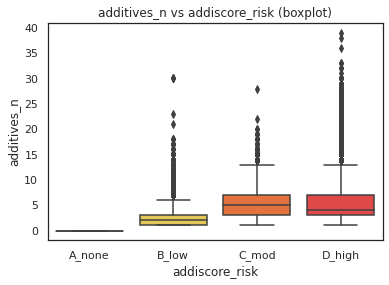

In [176]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='additives_n', 
palette=addiscore_palette, order=addiscore_order)
plt.title('additives_n vs addiscore_risk (boxplot)')
to_png()

"addiscore_vs_addiscore_risk_(boxplot).png"


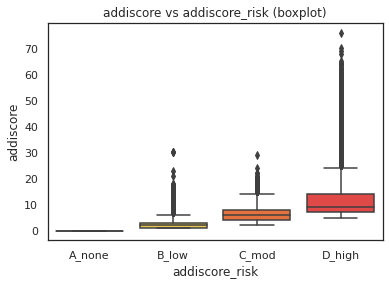

In [177]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='addiscore', 
palette=addiscore_palette, order=addiscore_order)
plt.title('addiscore vs addiscore_risk (boxplot)')
to_png()

## 6.3 Nutriscore par addiscore_risk
### 6.3.1 Nutriscore pare addiscore risk (box-plots) 

- Box-plot groupé par catégorie (avec tests statistiques)


"nutriscore_vs_addiscore_risk_boxplot.png"


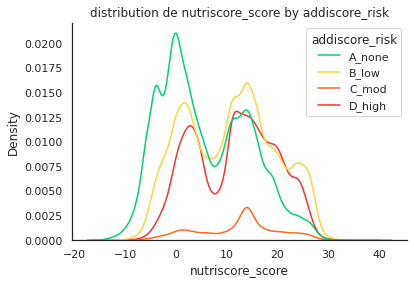

In [178]:
def plot_kde(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = list(palette.keys())
    order.sort()
    g = sns.kdeplot(data=df, x=y_var, hue=groups_var,
                    palette=palette, hue_order=order)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()


cleaned_data.pipe(plot_kde, groups_var='addiscore_risk',
                  y_var='nutriscore_score')
to_png('nutriscore_vs_addiscore_risk_boxplot')


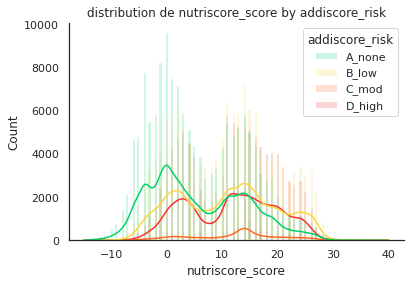

In [179]:
def plot_hist(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = None
    if palette:
        order = list(palette.keys())
        order.sort()
    categories = df[groups_var].value_counts(ascending=False)
    categories = categories[categories.values > 20].index
    if len(categories) > 12:
        categories = categories[:12]
    _, ax1 = plt.subplots()
    # for categ in categories:
    #     data=df[df[groups_var]==categ]
    #     if len(data) > 20:
    g = sns.histplot(data=df, x=y_var, hue=groups_var,
                     ax=ax1,
                     hue_order=order,
                     palette=palette,
                     alpha=0.2,
                     # binwidth=2,
                     # binrange=(-20,30),
                     kde=True)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()


cleaned_data.pipe(plot_hist, groups_var='addiscore_risk',
                  y_var='nutriscore_score')


Kolmogorov-Smirnov [A_none] : stat=0.578, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.781, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.850, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.845, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [148597, 141383, 14513, 107993]
Levene homoscédasticité : stat=763.885, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=35458.109, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot.png"


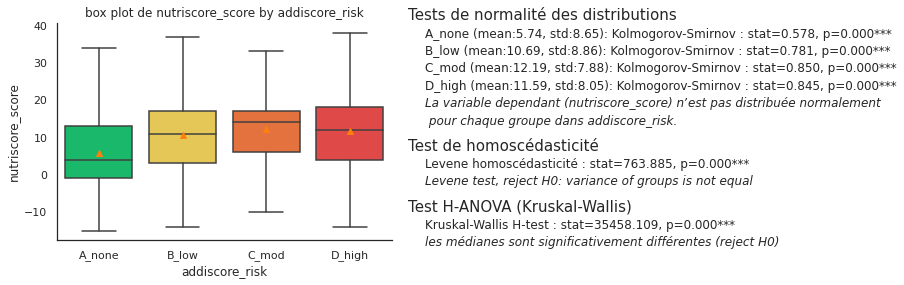

In [180]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=False)
to_png('nutriscore_vs_addiscore_risk_boxplot')


Kolmogorov-Smirnov [A_none] : stat=0.578, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.781, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.850, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.845, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [148597, 141383, 14513, 107993]
Levene homoscédasticité : stat=763.885, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=35458.109, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot_with_fliers.png"


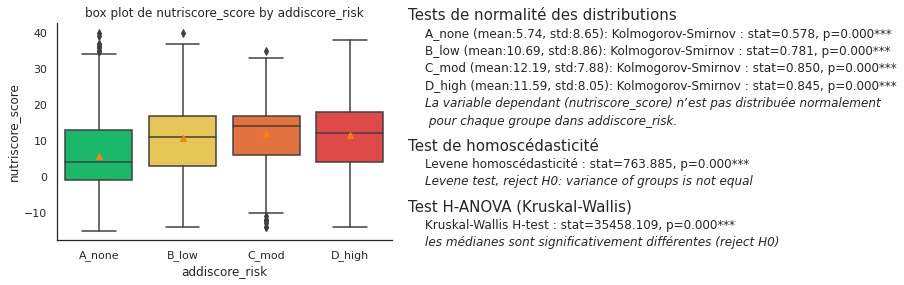

In [181]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=True)
to_png('nutriscore_vs_addiscore_risk_boxplot_with fliers')

Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.553, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.651, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [65939, 53937, 88236, 125705, 78669]
Levene homoscédasticité : stat=4183.435, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=37354.336, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot.png"


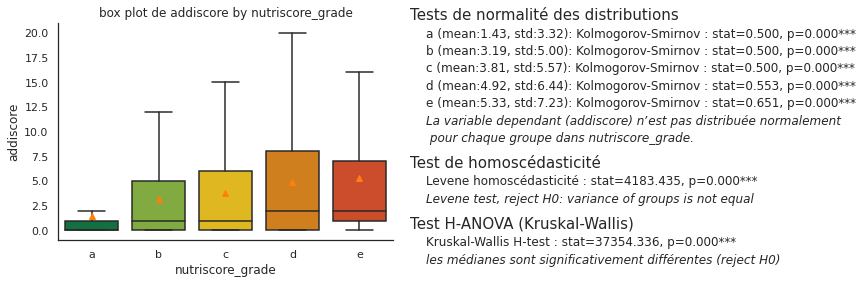

In [182]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=False)
to_png('addiscore_risk_vs_nutriscore_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.553, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.651, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [65939, 53937, 88236, 125705, 78669]
Levene homoscédasticité : stat=4183.435, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=37354.336, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot_with_fliers.png"


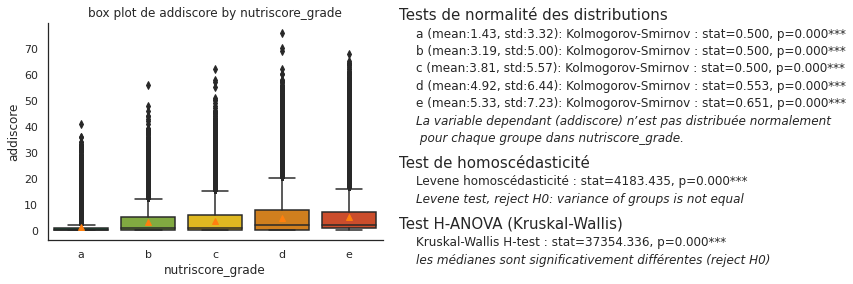

In [183]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=True)
to_png('addiscore_risk_vs_nutriscore_boxplot_with_fliers')

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.841, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.874, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.888, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [148597, 141383, 14513, 107993]
Levene homoscédasticité : stat=54619.757, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=335408.165, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_risk_boxplot.png"


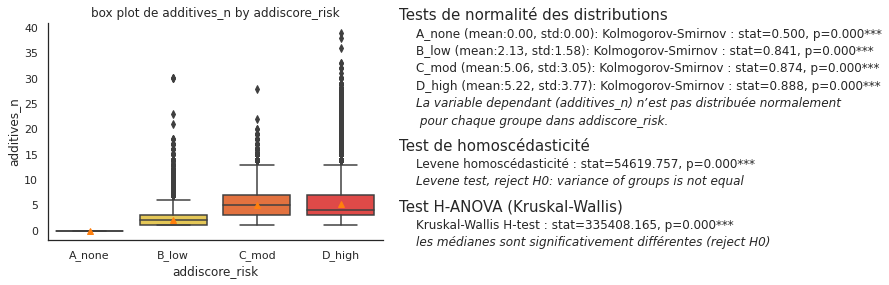

In [184]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='additives_n', showfliers=True)
to_png('nutriscore_vs_additives_risk_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.553, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.651, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=412486), [65939, 53937, 88236, 125705, 78669]
Levene homoscédasticité : stat=4790.247, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=38745.362, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_n_boxplot_nofliers.png"


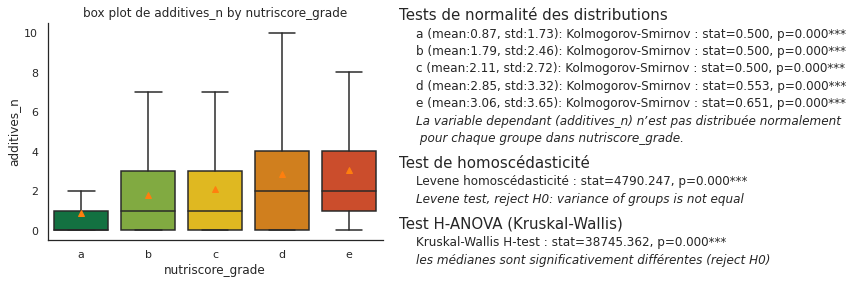

In [185]:
cleaned_data.pipe(plot_box_groupby, groups_var='nutriscore_grade',
                  y_var='additives_n', showfliers=False)
to_png('nutriscore_vs_additives_n_boxplot_nofliers')

### 6.3.2 Test ANOVA 1-way avec tests de normalité et homoscédasticité


Kolmogorov-Smirnov [A_none] : stat=0.601, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.791, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.798, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.850, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=152100), [59159, 53474, 2285, 37182]
Levene homoscédasticité : stat=117.313, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=10912.216, p=0.000***
les médianes sont significativement différentes (reject H0)
"anova_nutriscore_score_by_addiscore_risk_box_plot.png"


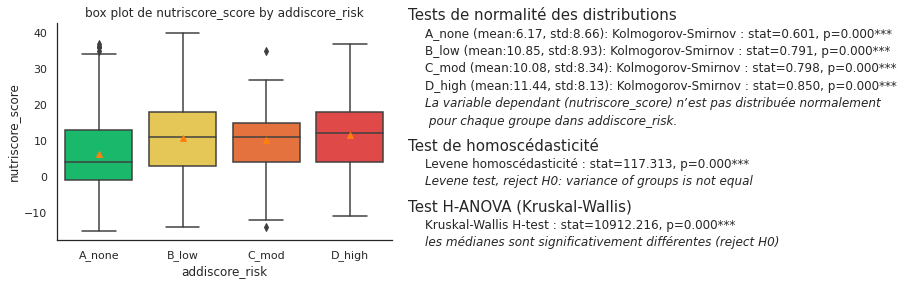

"anova_nutriscore_score_by_addiscore_risk_hist_plot.png"


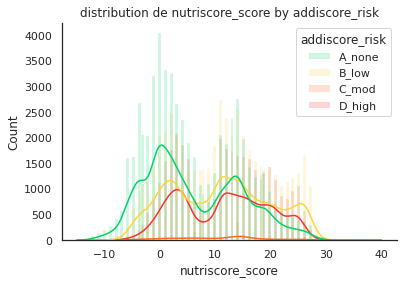

               nutriscore_score                       
                          count   mean   std      skew
addiscore_risk                                        
A_none                    59159   6.17  8.66  3.98e-01
B_low                     53474  10.85  8.93  8.72e-02
C_mod                      2285  10.08  8.34 -7.25e-02
D_high                    37182  11.44  8.13  9.54e-03

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.601, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.791, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.798, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.850, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (nutriscore_score) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=117.313, p=0.000***
Levene test, reject 

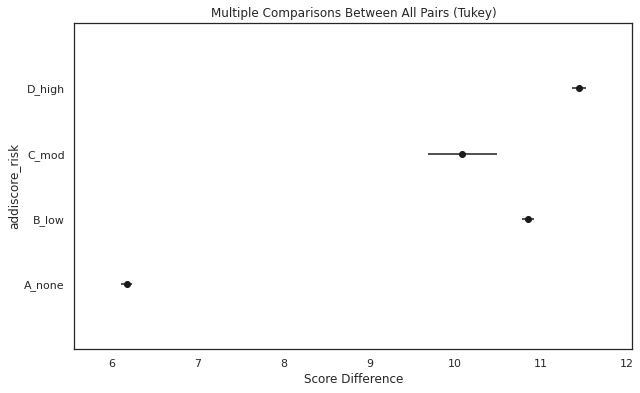

In [186]:

def test_anova(df:pd.DataFrame, y_var, groups_var):
    """test means of outcome variable (y_var), grouped by independent categorical variable (groups_var)"""
    data = df[[groups_var, y_var]].dropna()
    # affiche un plot des groupes
    plot_box_groupby(data, y_var, groups_var)
    to_png(f'anova_{y_var}_by_{groups_var}_box_plot')
    plt.show()

    # affiche une distribution des groupes
    plot_hist(data, groups_var, y_var)
    to_png(f'anova_{y_var}_by_{groups_var}_hist_plot')
    plt.show()

    # affiche une table descriptive :
    stats_df = (df[[groups_var, y_var]]
                .groupby(groups_var).agg(['count', 'mean', 'std', 'skew']))
    print(stats_df)

    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))

    print('\nTests de normalité des distributions')
    normality = True
    for grp in groups:
        p, ch, choix = test_normality(grp)
        if p < 0.05:
            normality = False
    print(f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} "
          + f"distribuée normalement pour chaque groupe dans {groups_var}.")

    print('\nTest de homoscédasticité')
    if normality:
        stat, p, ch, choix = test_bartlett(groups)
    else:
        stat, p, ch, choix = test_levene(groups)
    alpha = 0.05
    homoscedascity = p > alpha

    if normality and homoscedascity:
        print('\nF statistic')
        # stats f_oneway functions takes the groups as input and returns ANOVA F and p value
        fvalue, p = f_oneway(*groups)
        print(f'F value = {fvalue:.4f}, p value ={p:.4f}')
        alpha = 0.05
        if p > alpha:
            print('Same distributions (fail to reject H0)')
        else:
            print('Different distributions (reject H0)')
            print('Detail ANOVA tables')
            anova_df = anova_table_r(data, groups_var, y_var)

    else:
        print('\nNon parametric ANOVA using Kruskal-Wallis H-test')
        # H-statistic (Kruskal Wallis Non-parametric ANOVA)
        p, ch, choix = test_kruskal(groups)

    if p < alpha:
        print('Il y a évidence que les distributions ne sont tous les mêmes')
        plot_pairwise_tukey(data, groups_var, y_var)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(test_anova, groups_var='addiscore_risk', y_var='nutriscore_score')
 )


['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']
Kolmogorov-Smirnov [A_none] : stat=0.986, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.989, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151905), [59001, 53456, 2285, 37163]
Levene homoscédasticité : stat=1167.886, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=592.314, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.986, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probable

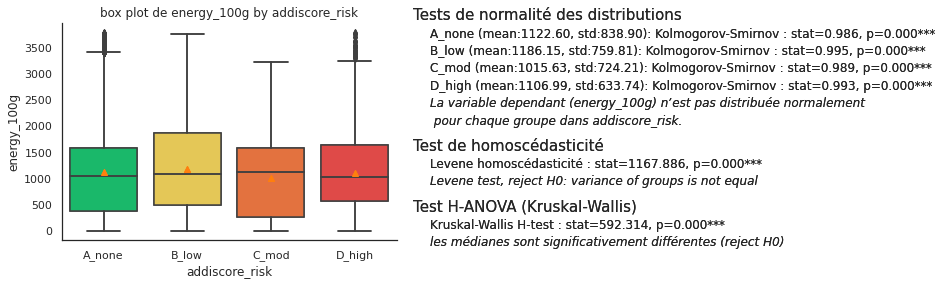

"anova_energy_100g_by_addiscore_risk_hist_plot.png"


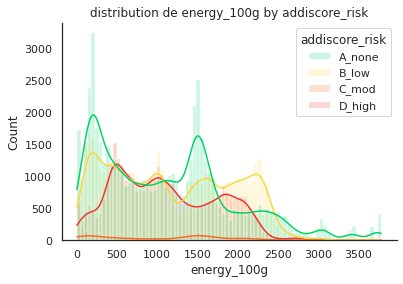

               energy_100g                       
                     count     mean     std  skew
addiscore_risk                                   
A_none               59001  1122.60  838.90  0.75
B_low                53456  1186.15  759.81  0.18
C_mod                 2285  1015.63  724.21  0.04
D_high               37163  1106.99  633.74  0.34

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.986, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.989, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (energy_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=1167.886, p=0.000***
Levene test, reject H0: variance of groups is not equal

No

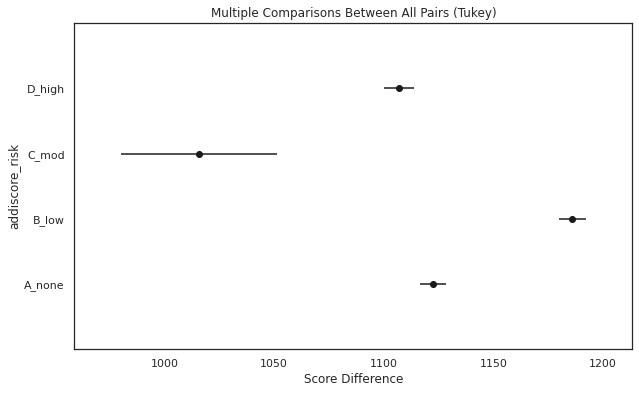

Kolmogorov-Smirnov [A_none] : stat=0.645, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.676, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.840, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151902), [58999, 53456, 2284, 37163]
Levene homoscédasticité : stat=627.177, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2696.326, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.645, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.676, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.840, p=0.000*** : reject H0: probablement pa

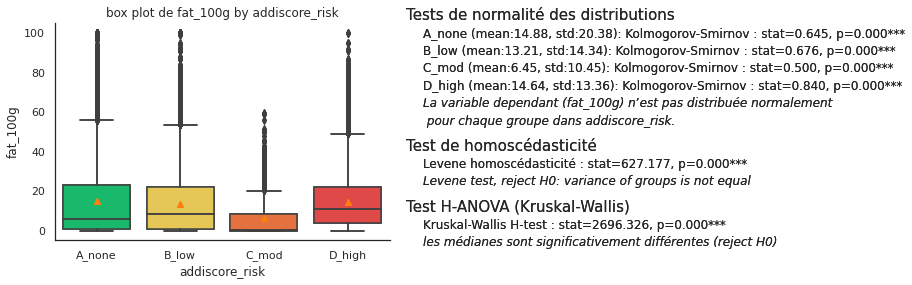

"anova_fat_100g_by_addiscore_risk_hist_plot.png"


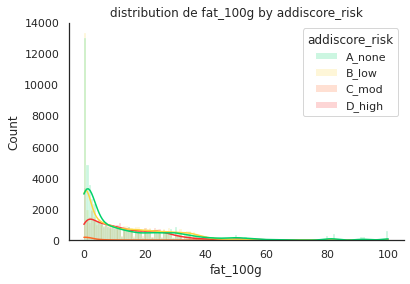

               fat_100g                    
                  count   mean    std  skew
addiscore_risk                             
A_none            58999  14.88  20.38  2.08
B_low             53456  13.21  14.34  1.38
C_mod              2284   6.45  10.45  1.86
D_high            37163  14.64  13.36  1.46

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.645, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.676, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.840, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=627.177, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-test

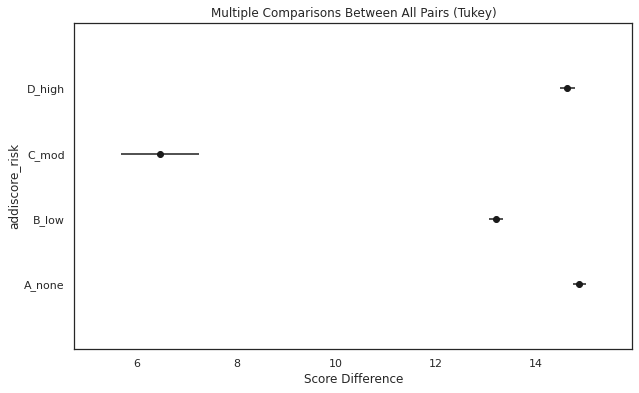

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.507, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.637, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151901), [58999, 53455, 2284, 37163]
Levene homoscédasticité : stat=187.734, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=3501.850, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.507, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.637, p=0.000*** : reject H0: probablement pa

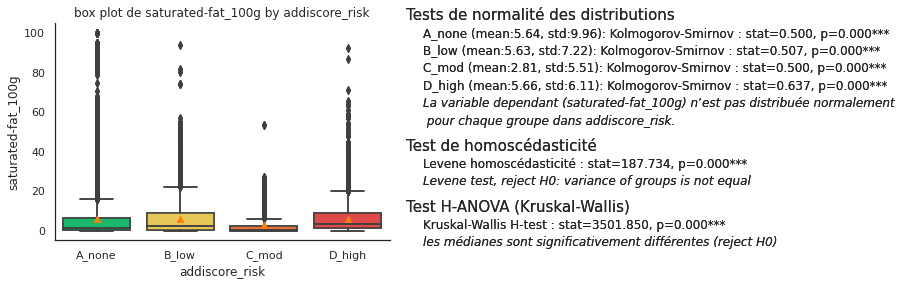

"anova_saturated-fat_100g_by_addiscore_risk_hist_plot.png"


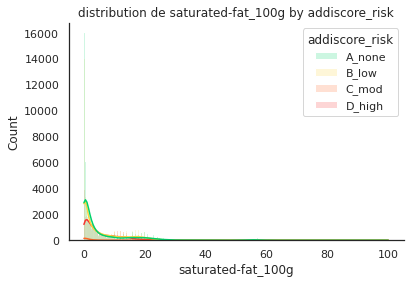

               saturated-fat_100g                  
                            count  mean   std  skew
addiscore_risk                                     
A_none                      58999  5.64  9.96  3.52
B_low                       53455  5.63  7.22  1.61
C_mod                        2284  2.81  5.51  2.77
D_high                      37163  5.66  6.11  1.84

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.507, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.637, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (saturated-fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=187.734, p=0.000***
Levene test, reject H0: variance of gro

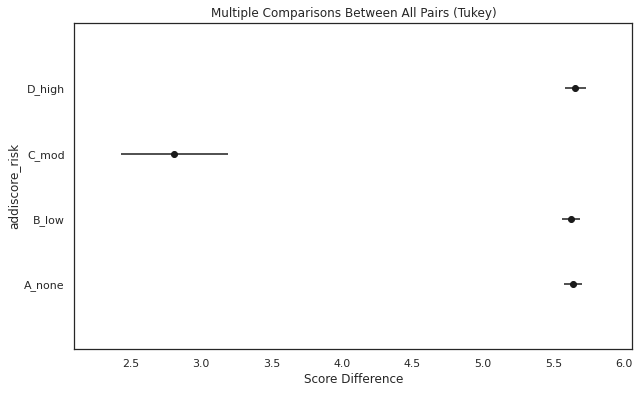

Kolmogorov-Smirnov [A_none] : stat=0.735, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.890, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.911, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.770, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151839), [58962, 53439, 2284, 37154]
Levene homoscédasticité : stat=965.643, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=7269.870, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.735, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.890, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.911, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.770, p=0.000*** : reject H0: probablement pa

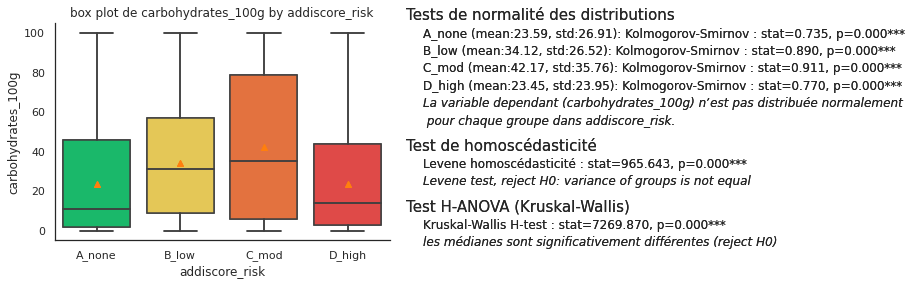

"anova_carbohydrates_100g_by_addiscore_risk_hist_plot.png"


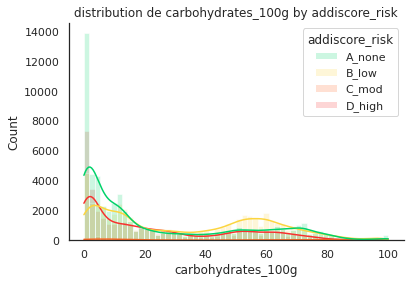

               carbohydrates_100g                    
                            count   mean    std  skew
addiscore_risk                                       
A_none                      58962  23.59  26.91  0.99
B_low                       53439  34.12  26.52  0.30
C_mod                        2284  42.17  35.76  0.20
D_high                      37154  23.45  23.95  0.84

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.735, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.890, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.911, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.770, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (carbohydrates_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=965.643, p=0.000***
Levene test, reject H0: v

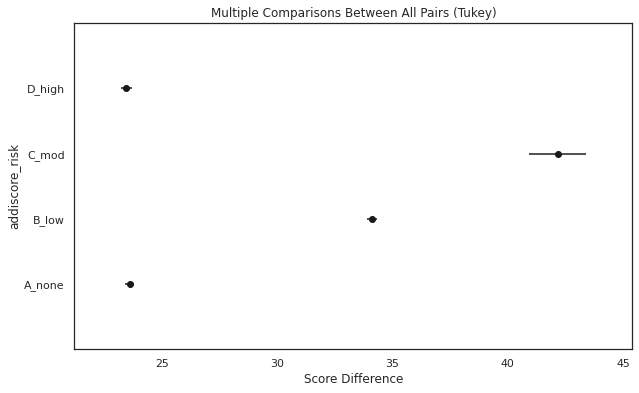

Kolmogorov-Smirnov [A_none] : stat=0.538, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.759, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.768, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.601, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151904), [59000, 53455, 2285, 37164]
Levene homoscédasticité : stat=3805.857, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=13820.379, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.538, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.759, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.768, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.601, p=0.000*** : reject H0: probablement 

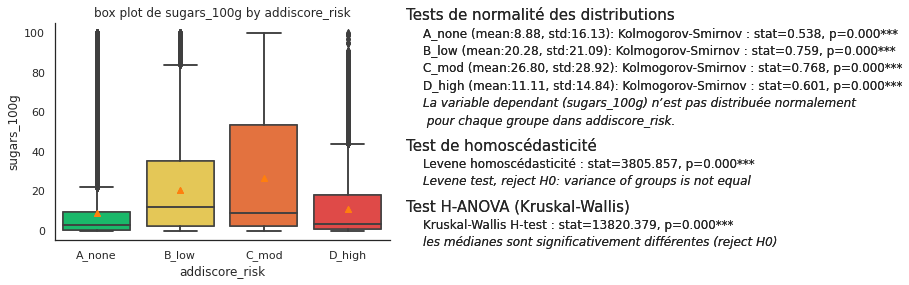

"anova_sugars_100g_by_addiscore_risk_hist_plot.png"


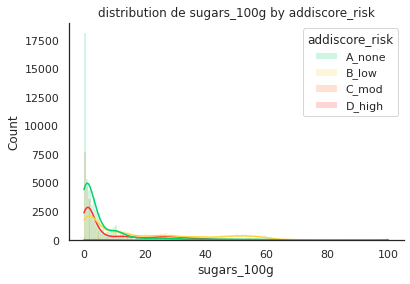

               sugars_100g                    
                     count   mean    std  skew
addiscore_risk                                
A_none               59000   8.88  16.13  2.99
B_low                53455  20.28  21.09  0.97
C_mod                 2285  26.80  28.92  0.71
D_high               37164  11.11  14.84  1.74

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.538, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.759, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.768, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.601, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sugars_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=3805.857, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA us

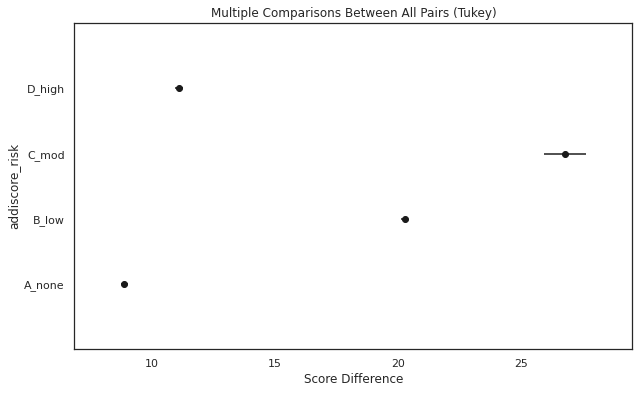

Kolmogorov-Smirnov [A_none] : stat=0.510, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=82925), [33269, 30534, 1108, 18014]
Levene homoscédasticité : stat=659.044, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=1139.220, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.510, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas

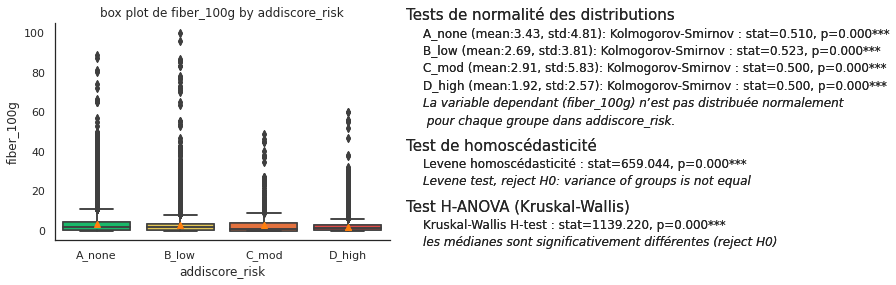

"anova_fiber_100g_by_addiscore_risk_hist_plot.png"


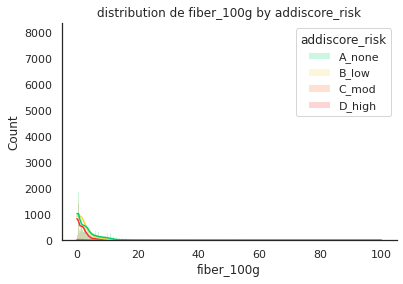

               fiber_100g                  
                    count  mean   std  skew
addiscore_risk                             
A_none              33269  3.43  4.81  4.02
B_low               30534  2.69  3.81  7.81
C_mod                1108  2.91  5.83  4.05
D_high              18014  1.92  2.57  6.25

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.510, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fiber_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=659.044, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-te

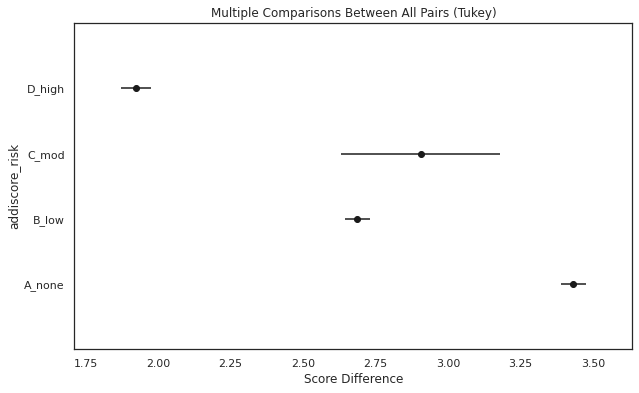

Kolmogorov-Smirnov [A_none] : stat=0.717, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.672, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.842, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151904), [59001, 53456, 2284, 37163]
Levene homoscédasticité : stat=1144.435, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=5353.892, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.717, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.672, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.842, p=0.000*** : reject H0: probablement p

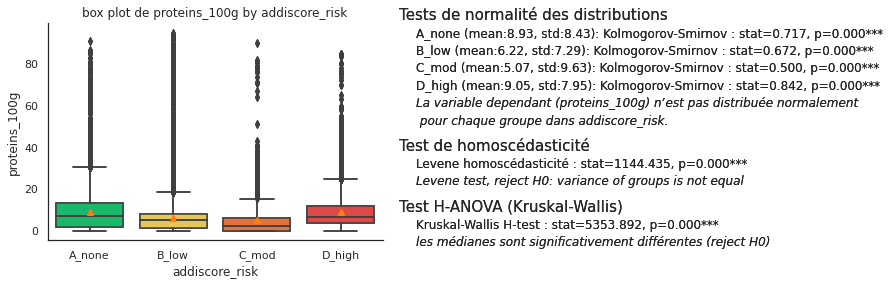

"anova_proteins_100g_by_addiscore_risk_hist_plot.png"


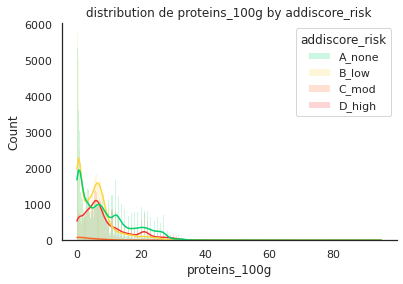

               proteins_100g                  
                       count  mean   std  skew
addiscore_risk                                
A_none                 59001  8.93  8.43  1.36
B_low                  53456  6.22  7.29  4.13
C_mod                   2284  5.07  9.63  4.91
D_high                 37163  9.05  7.95  1.68

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.717, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.672, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.842, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (proteins_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=1144.435, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA 

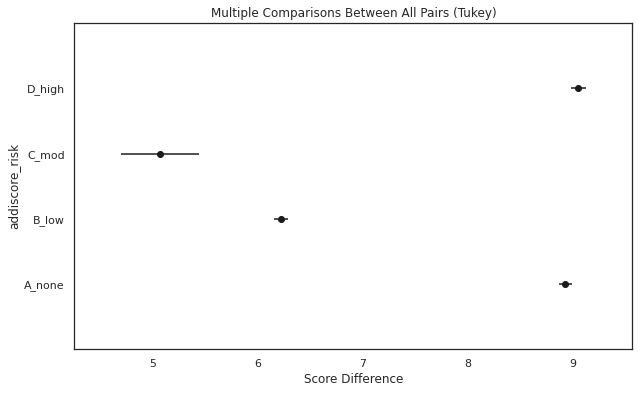

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151975), [59072, 53456, 2285, 37162]
Levene homoscédasticité : stat=164.921, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=11076.776, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement p

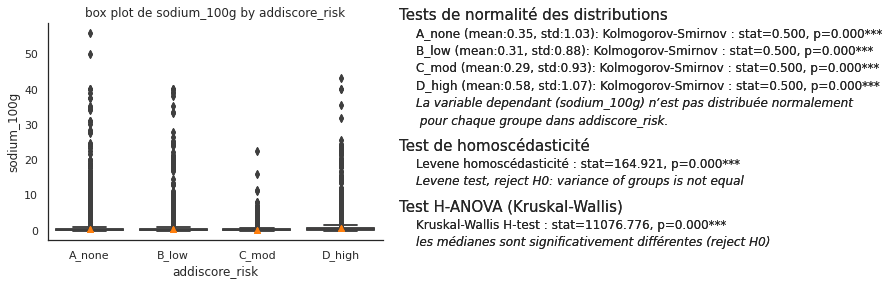

"anova_sodium_100g_by_addiscore_risk_hist_plot.png"


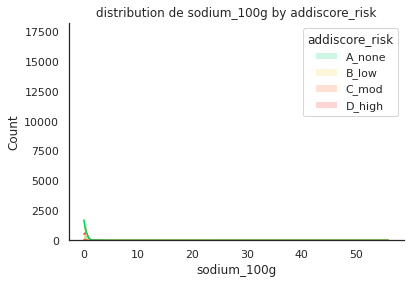

               sodium_100g                   
                     count  mean   std   skew
addiscore_risk                               
A_none               59072  0.35  1.03  20.67
B_low                53456  0.31  0.88  22.81
C_mod                 2285  0.29  0.93  11.90
D_high               37162  0.58  1.07  15.58

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sodium_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=164.921, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Krus

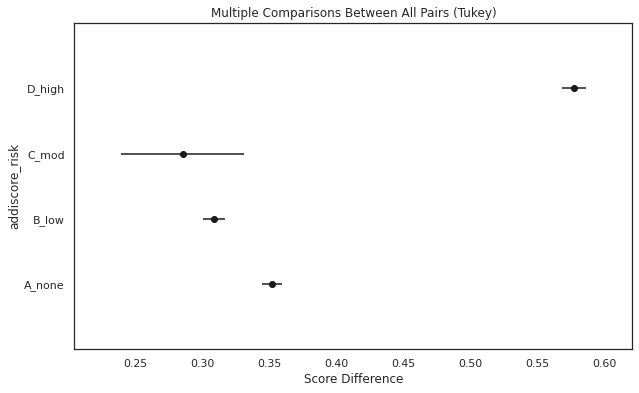

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=151959), [59020, 53474, 2285, 37180]
Levene homoscédasticité : stat=1577.057, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=1746.642, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement p

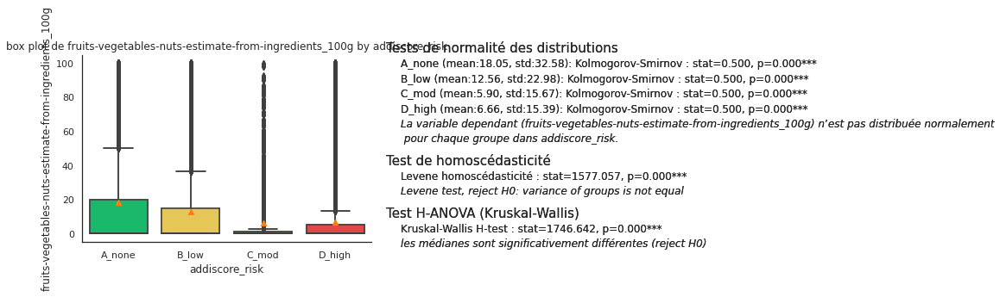

"anova_fruits-vegetables-nuts-estimate-from-ingredients_100g_by_addiscore_risk_hist_plot.png"


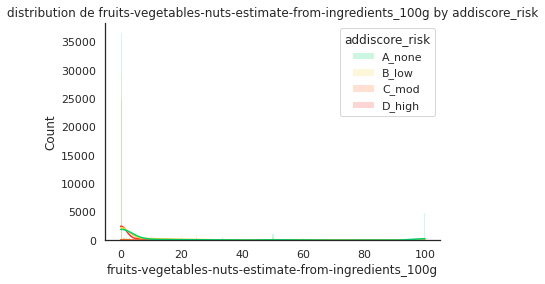

               fruits-vegetables-nuts-estimate-from-ingredients_100g         \
                                                               count   mean   
addiscore_risk                                                                
A_none                                                         59020  18.05   
B_low                                                          53474  12.56   
C_mod                                                           2285   5.90   
D_high                                                         37180   6.66   

                             
                  std  skew  
addiscore_risk               
A_none          32.58  1.71  
B_low           22.98  2.24  
C_mod           15.67  3.46  
D_high          15.39  3.24  

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smir

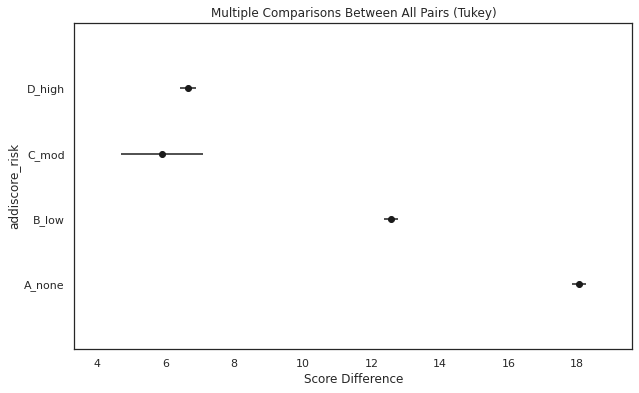

In [187]:
def stats_vars_nutritionnelles(df:pd.DataFrame):
    yvars = cols_in_df(cleaned_data, ['energy_100g', 'fat_100g',
                                      'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                      'proteins_100g', 'sodium_100g',
                                      'fruits-vegetables-nuts-estimate-from-ingredients_100g'])
    print(yvars)
    for yvar in yvars:
        plot_box_groupby(df, groups_var='addiscore_risk', y_var=yvar, showstats=True)
        test_anova(df, groups_var='addiscore_risk', y_var=yvar)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(stats_vars_nutritionnelles)
 )

## 6.4 NOVA groupes par addiscore risk

### 6.4.1 Moyennes par NOVA groupe (descriptive)


In [188]:
cleaned_data.groupby('nova_group').agg('mean')


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
nova_group,,,,,,,,,,,,,,,,,
1,0.09,5.28e-04,7.57e-04,-0.76,884.38,6.93,1.38,29.03,6.65,4.68,7.88,0.09,31.12,4.59e-05,8.90e-03,0.08,0.12
2,0.05,2.05e-03,3.72e-03,12.33,2801.77,65.08,23.11,20.46,17.05,2.28,3.72,0.17,26.03,0.00e+00,7.25e-03,0.04,0.08
3,0.40,6.53e-03,6.99e-03,7.97,1110.81,14.92,5.34,23.01,8.27,3.28,9.75,0.62,9.75,3.74e-04,8.83e-02,0.31,0.75
4,3.38,3.17e-02,1.23e-01,11.23,1187.31,13.25,5.28,33.95,17.50,2.34,7.31,0.47,5.16,1.32e-01,5.94e-01,2.66,5.89


### Fréquence des groupees de ADDISCORE risk par NOVA groupe


In [189]:
def crosstab_normalize(df:pd.DataFrame, index_col='pnns_groups_2', groups_col='nutriscore_score', normalize='index',
                       sortbygroup=None):
    ct = (pd.crosstab(
        df[index_col], df[groups_col],
        normalize=normalize, margins=True) * 100
          )
    if not sortbygroup is None:
        ct = ct.sort_values(by=sortbygroup, ascending=False)
    return ct


# pd.crosstab(cleaned_data['nova_group'],cleaned_data['addiscore_risk'],normalize=True, margins=True)*100


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(crosstab_normalize, index_col='nova_group', groups_col='addiscore_risk', normalize=True)
 )


addiscore_risk,A_none,B_low,C_mod,D_high,All
nova_group,,,,,
1,9.99,0.65,6.57e-04,7.50e-02,10.71
2,1.55,0.01,0.00e+00,7.23e-03,1.57
3,18.43,4.10,2.63e-03,2.13e+00,24.66
4,8.92,30.40,1.50e+00,2.22e+01,63.05
All,38.89,35.16,1.50e+00,2.44e+01,100.00


## 6.5 PNNS groups par addiscore_risk

### 6.5.1 Quel sont les groupes PNNS avec les plus grandes proportions d'additifs de risques élevés ?

#### 6.5.1.1 Fréquence des groupes de ADDISCORE risk par PNNS groupe 1


In [190]:
# (pd.crosstab(cleaned_data['pnns_groups_1'],cleaned_data['addiscore_risk'],normalize='index', margins=True)*100).style.background_gradient()

ct_pnns1_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_1', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns1_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_1,,,,
Fish Meat Eggs,38.04,15.14,0.29,46.53
Composite foods,28.95,32.03,0.79,38.24
Salty snacks,44.41,26.95,0.56,28.09
All,38.87,35.05,1.46,24.62
Milk and dairy products,47.14,29.01,0.40,23.45
Sugary snacks,17.05,57.25,2.73,22.96
Fat and sauces,44.51,31.63,1.46,22.40
Beverages,44.97,35.47,3.78,15.78
Cereals and potatoes,62.94,27.32,0.78,8.96


### 6.5.2 Groupes PNNS 2 avec les plus grandes proportions d'additifs de risques élevés ?


In [191]:
ct_pnns2_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_2', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns2_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_2,,,,
Processed meat,16.39,10.24,0.11,73.26
Sandwiches,10.27,18.82,0.15,70.76
Pizza pies and quiches,20.81,28.31,0.30,50.58
Artificially sweetened beverages,0.76,35.23,19.91,44.10
Dairy desserts,30.45,26.46,0.07,43.01
Biscuits and cakes,11.37,46.19,0.60,41.84
Salty and fatty products,35.62,23.12,0.43,40.84
Meat,37.03,21.94,0.33,40.70
Ice cream,3.91,61.38,1.01,33.71


### Bar plot - valeurs d'une colonne dans une table sommaire

- pas count
- pas groupby

- possibilité de limité la nombre de valeurs
- possibilité de trier par valeur
- possibilité de normalizer (effectif ⇨ fréquence)


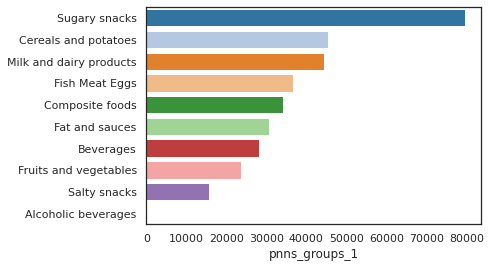

In [192]:
data = cleaned_data['pnns_groups_1'].value_counts().to_frame('pnns_groups_1')
sns.barplot(y=data.index, x=data['pnns_groups_1'])


"Top_10_catégories_avec_additifs_de_risque_élevés(France)_barplot.png"


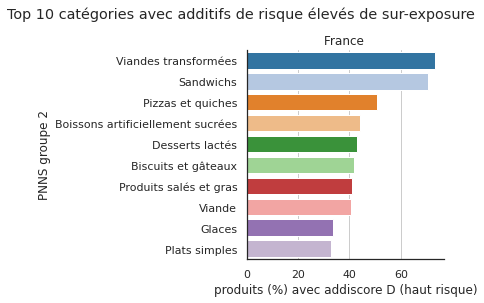

In [193]:
def plot_bar(df:pd.DataFrame, col, nb=20, others=False, normalize=False, sort_values=False, palette=None,
             xlabel=None, ylabel=None, titre='', soustitre='', traductions=False):
    other_count = 0
    data = df[[col]]
    # print(data.columns.to_list())

    if nb < len(data):
        data = data.head(nb)
    if others:
        filter_other = data[col] == 'other'
        # other_count = data[filter_other][col].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data.index, x=data[col] * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=data.index, x=data[col], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        autres = f' [Autres valeurs = {other_count}]'
    if xlabel:
        ax.set_xlabel(xlabel)
    if ylabel:
        ax.set_ylabel(ylabel)
    if traductions:
        labels = traduire_categories([item.get_text()
                                      for item in ax.get_yticklabels()])
        ax.set_yticklabels(labels=labels)
    plt.gca().xaxis.grid()
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


ct_pnns2_addiscore.pipe(plot_bar, col='D_high', nb=10,
                        traductions=True,
                        xlabel='produits (%) avec addiscore D (haut risque)',
                        ylabel='PNNS groupe 2',
                        titre='Top 10 catégories avec additifs de risque élevés de sur-exposure',
                        soustitre='France'
                        )
to_png('Top 10 catégories avec additifs de risque élevés(France)_barplot')


In [194]:
groupes_a_risque_eleves = ct_pnns2_addiscore.head(10).index
print(groupes_a_risque_eleves)


Index(['Processed meat', 'Sandwiches', 'Pizza pies and quiches',
       'Artificially sweetened beverages', 'Dairy desserts',
       'Biscuits and cakes', 'Salty and fatty products', 'Meat', 'Ice cream',
       'One-dish meals'],
      dtype='object', name='pnns_groups_2')


### Quel sont les distributions de nutriscore pour ces groupes ?


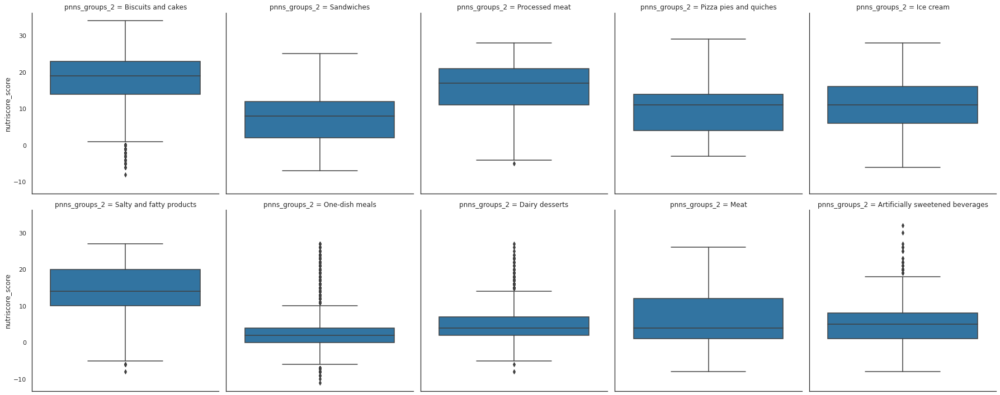

In [195]:
def plot_dist_nutriscore_by_categ(df:pd.DataFrame, categ_col, yvar='nutriscore_score'):
    df = df[[categ_col, yvar]].dropna()
    sns.catplot(data=df, kind='box', col=categ_col, y=yvar, col_wrap=5)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_dist_nutriscore_by_categ, categ_col='pnns_groups_2')
 )


### 6.5.3 Fréquence des additives haut risque

"presence_additifs_nocifs_France_bar.png"


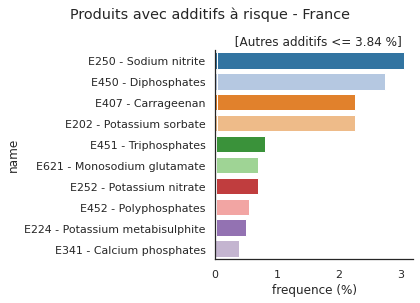

In [196]:
def freq_unsafe_additives(df:pd.DataFrame, filtre=None, normalize=False): 
    """
    Fréquence des additifs nocifs par tags 
    On n'utilise pas colonne additives_en, car certain additifs n'apparait pas
    E450i (Disodium diphosphate) fait partie de E450 - Diphosphates qui sont haut risque
    """
    if filtre is None:
        filtre=unsafe_additives_df['id'].tolist()
    freq = explode_series(df['additives_tags']).value_counts(ascending=False, normalize=normalize)
    freq = freq[freq.index.isin(filtre)]
    freq = freq.to_frame(name='freq').rename_axis('id')
    freq = freq.join(additives_detail[['id','name']].set_index('id'), how='inner').set_index('name')
    return freq['freq']


def plot_unsafe_additives(df:pd.DataFrame, normalize=True, titre='', soustitre='', ylabel=None, nb=19, palette=None): 
    freq_unsafe = freq_unsafe_additives(df, normalize=normalize)
    others_sum = 0
    if len(freq_unsafe) > nb:
        others = freq_unsafe[nb:]
        # print(others)
        others_sum = others.values.sum()
        freq_unsafe = freq_unsafe[:nb]
        # freq_unsafe['autres']=others_sum

    if normalize:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values, palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others_sum > 0:
        if normalize:
            others_sum = f'{others_sum * 100:.2f} %'
        autres = f' [Autres additifs <= {others_sum}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()
    sns.barplot(y=freq_unsafe.index, x=freq_unsafe.values)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - France')
 )
to_png('presence_additifs_nocifs_France_bar')


"presence_additifs_nocifs_USA_bar.png"


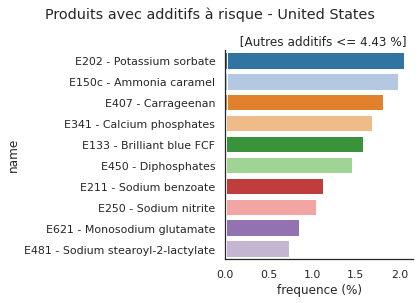

In [197]:
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - United States')
 )
to_png('presence_additifs_nocifs_USA_bar')


"presence_additifs_nocifs_France_NOVA_3_bar.png"


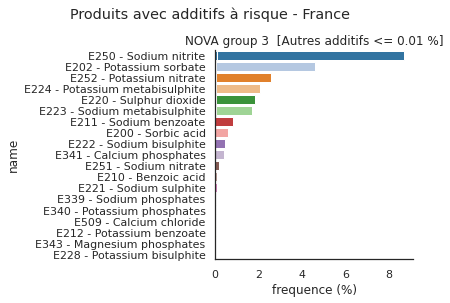

In [198]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='NOVA group 3')
 )
to_png('presence_additifs_nocifs_France_NOVA_3_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


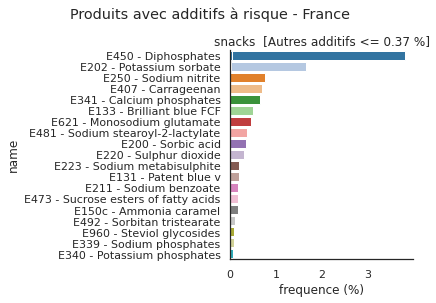

In [199]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_1', 'snacks')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


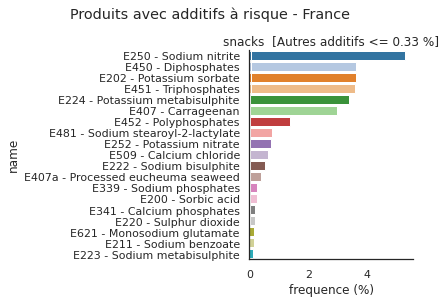

In [200]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'sandwiches')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


"presence_additifs_nocifs_France_processed_meat_bar.png"


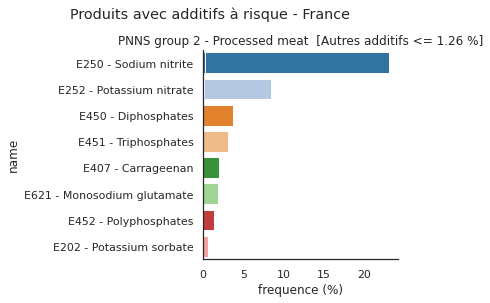

In [202]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(plot_unsafe_additives, nb=8,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Processed meat')
 )
to_png('presence_additifs_nocifs_France_processed_meat_bar')


"presence_additifs_nocifs_France_sandwiches_bar.png"


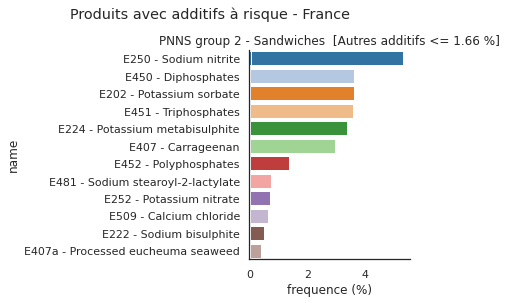

In [203]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Sandwiches')
 .pipe(plot_unsafe_additives, nb=12,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Sandwiches')
 )
to_png('presence_additifs_nocifs_France_sandwiches_bar')


###  Trouve des 'bons' et 'mauvais' produits dans des groupes PNNS 2 de risque élevés


In [208]:
def top_produits_by_addiscore_rank(df:pd.DataFrame, pnns_2_group='Processed meat', nb=10):
    data = (df
            .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=[pnns_2_group])
            .pipe(filter_by_nova_group, 4)
            .dropna(subset=['addiscore'])
            .sort_values(by='addiscore')
            )
    nb = min(nb, len(data))
    return data.head(nb)


produits = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(top_produits_by_addiscore_rank, nb=1000000)
            .pipe(filter_by_tag, 'addiscore_risk', 'A_none')
            .sort_values(by='nutriscore_score')
            )
produits[['product_name', 'brands_tags', 'nutriscore_grade', 'addiscore', 'addiscore_risk']].head(5)

,product_name,brands_tags,nutriscore_grade,addiscore,addiscore_risk
374805,Jambon & Légumes du Soleil,madrange,a,0.0,A_none
436828,Recettes de saucisses fumées aux légumes du soleil Ô P'tits Légumes,madrange,a,0.0,A_none
436829,Recette de saucisses fumées aux légumes du soleil Ô p'tits Légumes,madrange,a,0.0,A_none
374807,Recette au Jambon et légumes verts Ô P'tits Légumes,madrange,a,0.0,A_none
387919,Dès de jambon cuit supérieur,philippe-wagner,b,0.0,A_none


### Produit quadrants pour les produits avec risques élevés

- Voir la section 'Système de recommandation`


### Fréquence des groupes de ADDISCORE risque par NUTRISCORE grade


In [209]:
(pd.crosstab(cleaned_data['nutriscore_grade'], cleaned_data['addiscore_risk'],
             normalize='index', margins=True) * 100).style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
nutriscore_grade,,,,
a,64.03,24.91,1.46,9.60
b,42.98,31.46,2.50,23.07
c,36.29,34.01,2.48,27.22
d,28.82,34.76,5.51,30.91
e,18.99,43.59,3.93,33.49
All,36.02,34.28,3.52,26.18


In [210]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    # piv = ret.pivot_table(columns=[col],values=['unsafe'], aggfunc=['count','mean'])
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.12,43600
2,0.08,5376
3,0.75,98888
4,5.89,264622


In [211]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


In [214]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,5.58,16087
Fish Meat Eggs,4.80,16869
Sugary snacks,3.93,33405
Milk and dairy products,2.91,17892
Salty snacks,2.80,9727
Fat and sauces,2.61,8714
Beverages,2.34,13281
Cereals and potatoes,1.39,15542
Fruits and vegetables,1.01,9773


In [215]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False)


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Sandwiches,14.64,1334
Processed meat,7.27,7853
Artificially sweetened beverages,7.25,1703
Pizza pies and quiches,6.41,1999
Ice cream,6.08,2483
...,...,...
Nuts,0.47,1316
Fruit juices,0.29,2391
Waters and flavored waters,0.26,486


In [216]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10)


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.29,152091
Switzerland,2.48,6039
Germany,2.47,5312
Belgium,3.38,5200
Spain,3.32,4985
United States,3.73,3420
Italy,2.19,2109
United Kingdom,3.24,2035
Netherlands,2.04,845


In [217]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                    
                         count unique                   top   freq
nutriscore_grade                                                  
a                        57727      9  Cereals and potatoes  19653
b                        45059     10       Composite foods   9299
c                        68466     10       Composite foods  10674
d                        99052     10         Sugary snacks  31436
e                        68406     10         Sugary snacks  37604

In [218]:
cleaned_data.groupby('nova_group').describe().T


nova_group                1        2         3          4
additives_n count  43600.00  5376.00  98888.00  264622.00
            mean       0.09     0.05      0.40       3.38
            std        0.32     0.27      0.75       3.30
            min        0.00     0.00      0.00       0.00
            25%        0.00     0.00      0.00       1.00
...                     ...      ...       ...        ...
addiscore   min        0.00     0.00      0.00       0.00
            25%        0.00     0.00      0.00       1.00
            50%        0.00     0.00      0.00       4.00
            75%        0.00     0.00      1.00       8.00
            max       11.00    17.00     27.00      76.00

[136 rows x 4 columns]

In [219]:
pd.set_option('display.max_rows', 10)


## 6.6 Analyse temporelle d'addiscore risk

### 6.6.1 Est-ce que le pourcentage de produits de haut risque a baissé pendant le temps ?


#### 6.6.1.1 Fréquence de groupes d'addiscore risque par an (Etats Unis)


"Distribution_addiscore_par_année_(united_states).png"


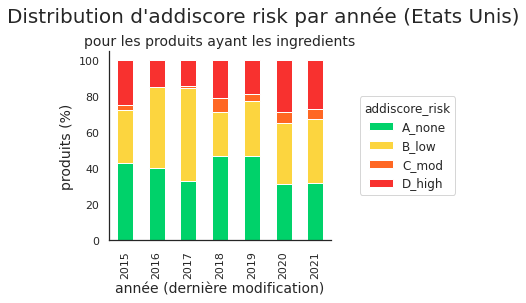

In [220]:
(cleaned_data
 .pipe(filter_by_country, 'united states')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (Etats Unis)",
       soustitre='pour les produits ayant les ingredients')
 )
to_png('Distribution_addiscore_par_année_(united states)')


#### 6.6.1.2 Fréquence de groupes d'addiscore risque par an (France)


"Distribution_addiscore_par_année_(France).png"


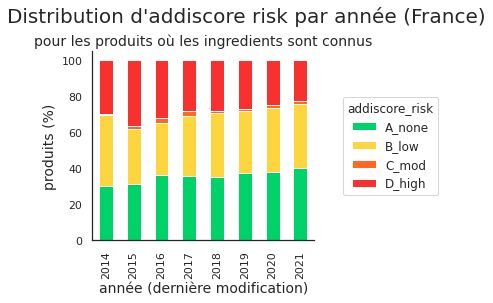

In [221]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits où les ingredients sont connus')
 )
to_png('Distribution_addiscore_par_année_(France)')


#### 6.6.1.3 Fréquence des groupes addiscore pour le nova_score categories 3 et 4


"Distribution_addiscore_NOVA_4_par_année_(France).png"


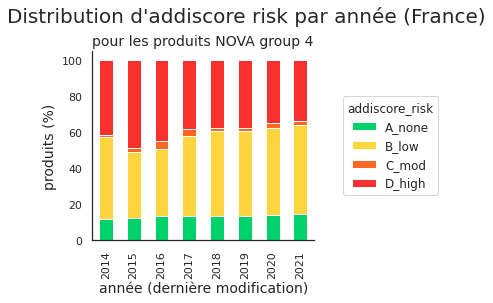

In [222]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '4')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 4')
 )
to_png('Distribution_addiscore_NOVA_4_par_année_(France)')


"Distribution_addiscore_NOVA_3_par_année_(France).png"


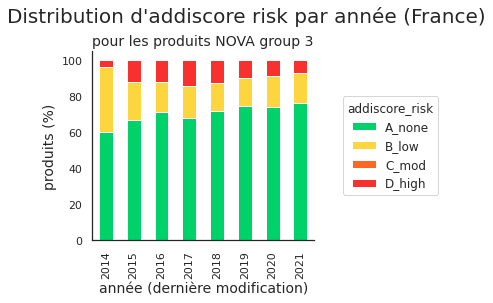

In [223]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 3')
 )
to_png('Distribution_addiscore_NOVA_3_par_année_(France)')


#### 6.6.1.4 ➡️ Les pourcentages d'addiscore reste assez stable entre les années

- pour tester, il faut faire un test **chi-square** sur la table des frequences
  (qualitative-qualitative) - pas encore fait


### 6.6.2 Est-ce que le moyenne nombre d'additifs a changé au cours des années, pour chaque groupe  ?


"additifs_par_produit_-_Nutriscore_(France).png"


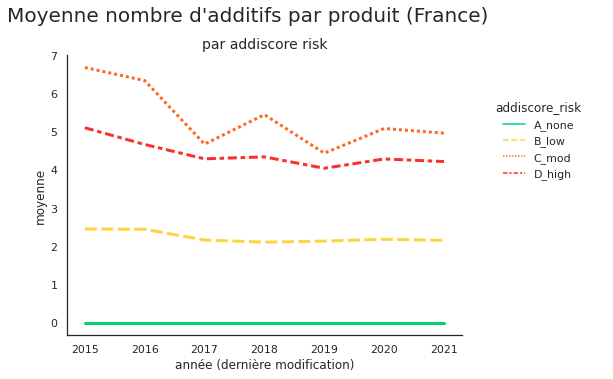

In [224]:
def plot_column_mean_by_addiscore_risk(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='addiscore_risk',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    relplot = True
    if relplot:
        g = sns.relplot(data=data, kind="line",
                        palette=addiscore_palette, linewidth=3)
        leg = g._legend
        leg.set_title('addiscore_risk')
        # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.3, 0.8])
        leg._loc = 1  # upper right
    else:
        # matplotlib
        ax = data.plot(kind='line', color=addiscore_palette.values())
        plt.legend(title=f'addiscore risk',
                   bbox_to_anchor=(1.5, 0.5), loc="upper right", fontsize=12,
                   bbox_transform=plt.gcf().transFigure)
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_addiscore_risk,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par addiscore risk'
       )
 )
to_png("additifs par produit - Nutriscore (France)")


### Addiscore par NOVA group (mean, count)


In [225]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.12,43600
2,0.08,5376
3,0.75,98888
4,5.89,264622


In [226]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


Index(['nova_group', 'addiscore'], dtype='object')
nova_group : {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
            mean  count
nova_group             
1           0.11  16295
2           0.04   2391
3           0.75  37515
4           4.91  95899


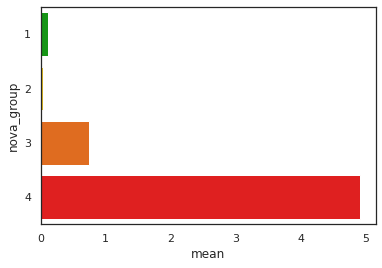

In [227]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nova_group')
 .pipe(plot_hbar_mean_count, categ='nova_group')
 )


In [246]:
add_data = (cleaned_data
            .pipe(filter_by_country, 'France'))


### Addiscore par PNNS groups 1 (mean, count)
- on voit ci-dessous les groups plus à risque sont les 'composite foods', 'fish meat eggs' et 'sugary snacks'

In [229]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1.style.background_gradient()


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,5.58,16087
Fish Meat Eggs,4.80,16869
Sugary snacks,3.93,33405
Milk and dairy products,2.91,17892
Salty snacks,2.80,9727
Fat and sauces,2.61,8714
Beverages,2.34,13281
Cereals and potatoes,1.39,15542
Fruits and vegetables,1.01,9773


### Addiscore par PNNS groups 2 (mean, count)
Les groups d'alimentation plus à risque (voi ci-dessous) sont:
- Sandwiches
- viandes préparés
- pizzas et quiches
- desserts lactées

In [230]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False).style.background_gradient()


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Sandwiches,14.64,1334
Processed meat,7.27,7853
Artificially sweetened beverages,7.25,1703
Pizza pies and quiches,6.41,1999
Ice cream,6.08,2483
Biscuits and cakes,5.66,15201
Meat,4.53,3327
One-dish meals,4.50,12754
Dairy desserts,4.43,2834


In [231]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10).style.background_gradient()


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.29,152091
Switzerland,2.48,6039
Germany,2.47,5312
Belgium,3.38,5200
Spain,3.32,4985
United States,3.73,3420
Italy,2.19,2109
United Kingdom,3.24,2035
Netherlands,2.04,845


In [232]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                    
                         count unique                   top   freq
nutriscore_grade                                                  
a                        57727      9  Cereals and potatoes  19653
b                        45059     10       Composite foods   9299
c                        68466     10       Composite foods  10674
d                        99052     10         Sugary snacks  31436
e                        68406     10         Sugary snacks  37604

In [233]:
pd.crosstab(cleaned_data['nova_group'],cleaned_data['addiscore_risk']).style.background_gradient(axis=1)


addiscore_risk,A_none,B_low,C_mod,D_high
nova_group,,,,
1,40215,3002,2,381
2,5180,164,0,32
3,71168,20107,35,7578
4,32034,118110,14476,100002


In [234]:
cleaned_data.groupby('pnns_groups_1').describe().T


pnns_groups_1      Alcoholic beverages  Beverages  Cereals and potatoes  \
additives_n count                27.00   28240.00              45462.00   
            mean                  0.15       1.82                  1.46   
            std                   0.36       2.15                  2.44   
            min                   0.00       0.00                  0.00   
            25%                   0.00       0.00                  0.00   
...                                ...        ...                   ...   
addiscore   min                   0.00       0.00                  0.00   
            25%                   0.00       0.00                  0.00   
            50%                   0.00       1.00                  0.00   
            75%                   0.00       5.00                  2.00   
            max                   1.00      39.00                 62.00   

pnns_groups_1      Composite foods  Fat and sauces  Fish Meat Eggs  \
additives_n count         34055.00        30691.00        36761.00   
            mean              2.96            1.66            1.90   
            std               3.43            2.16            2.19   
            min               0.00            0.00            0.00   
            25%               0.00            0.00            0.00   
...                            ...             ...             ...   
addiscore   min               0.00            0.00            0.00   
            25%               0.00            0.00            0.00   
            50%               2.00            1.00            3.00   
            75%               9.00            4.00            8.00   
            max              70.00           45.00           50.00   

pnns_groups_1      Fruits and vegetables  Milk and dairy products  \
additives_n count               23688.00                 44440.00   
            mean                    0.62                     1.81   
            std                     1.16                     2.35   
            min                     0.00                     0.00   
            25%                     0.00                     0.00   
...                                  ...                      ...   
addiscore   min                     0.00                     0.00   
            25%                     0.00                     0.00   
            50%                     0.00                     1.00   
            75%                     1.00                     5.00   
            max                    38.00                    48.00   

pnns_groups_1      Salty snacks  Sugary snacks  
additives_n count      15665.00       79681.00  
            mean           1.56           3.68  
            std            2.16           4.07  
            min            0.00           0.00  
            25%            0.00           1.00  
...                         ...            ...  
addiscore   min            0.00           0.00  
            25%            0.00           1.00  
            50%            1.00           3.00  
            75%            5.00           8.00  
            max           50.00          76.00  

[136 rows x 10 columns]

### Top additifs répresentés dans les produits

In [235]:
mod_risk_tags = mod_risk_additives['id'].to_list()
high_risk_tags = high_risk_additives['id'].to_list()


def additive_tags_to_labels(ax):
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])
    ax.set_yticklabels(labels=labels)


#### Top additifs dans les produits (France)

"Top_additifs_red_répresentés_dans_les_produits_avec_ingredients.png"


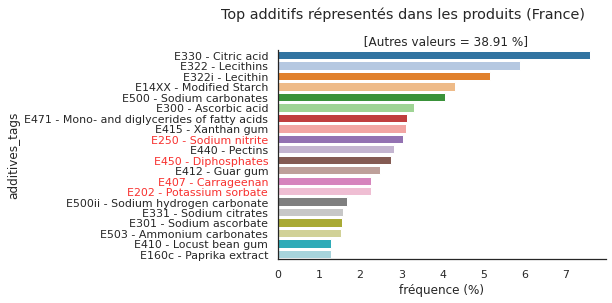

In [236]:


(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(filter_by_country, 'France')
 .pipe(plot_bar_top_n, col='additives_tags', nb=20,
       titre='Top additifs répresentés dans les produits (France)',
       ylabel='', normalize=True)
 )
additive_tags_to_labels(ax=plt.gca())

to_png('Top additifs red répresentés dans les produits avec ingredients')


"distribution_nutriscore_par_nova_group_et_pnns_facetgrid_displot.png"


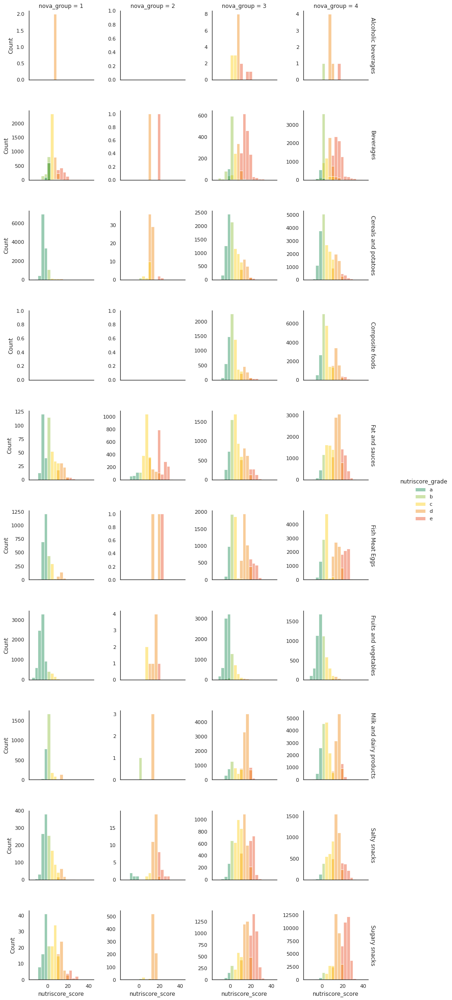

In [237]:
def unique_ordered(series: pd.Series) -> list:
    ret = list(series.dropna().unique().astype(str))
    if len(ret) > 100:
        return []
    ret.sort()
    return ret


# g = sns.FacetGrid(cleaned_data, col="nova_group", hue='nova_group', col_wrap=2, sharex=True,sharey=False)
# g.map(sns.displot, "nutriscore_score")


def plot_dist_facet(df:pd.DataFrame, x='nutriscore_score', col='nova_group', row="pnns_groups_1", hue='nutriscore_grade'):
    if df[x].dtype == 'object':
        df = df.sort_values(by=[x])
    col_order = None if col is None else unique_ordered(df[col])
    row_order = None if row is None else unique_ordered(df[row])
    hue_order = None if hue is None else unique_ordered(df[hue])
    g = sns.displot(df, x=x,
                    col=col, col_order=col_order,
                    row=row, row_order=row_order,
                    hue=hue, hue_order=hue_order,
                    palette=get_palette(hue),
                    binwidth=3, height=3, alpha=0.4, facet_kws=dict(margin_titles=True, sharey=False),
                    )
    g.set_titles(row_template="{row_name}")



"distribution_nutriscore_par_nova_group_facetgrid_displot.png"


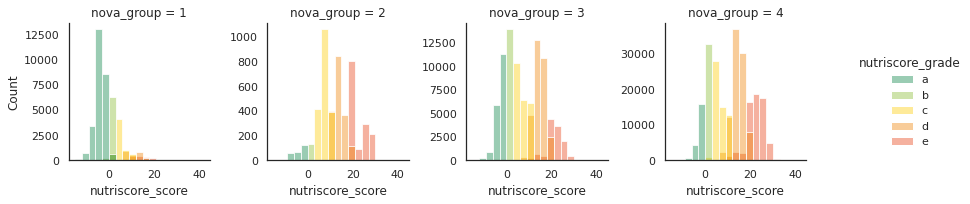

In [238]:

cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='nova_group', row=None)
to_png('distribution_nutriscore_par_nova_group_facetgrid_displot')


"distribution_nutriscore_par_addiscore_risk_facetgrid_displot.png"


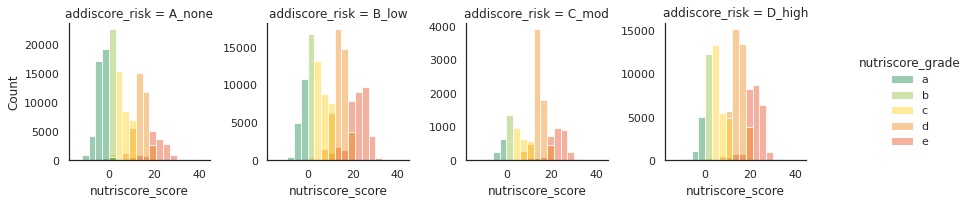

In [239]:
cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='addiscore_risk', row=None)
to_png('distribution_nutriscore_par_addiscore_risk_facetgrid_displot')


### Repartitions des nutriscore par tag

- plot les {top_n} tags, reparties entre un score


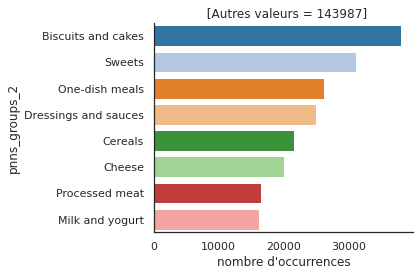

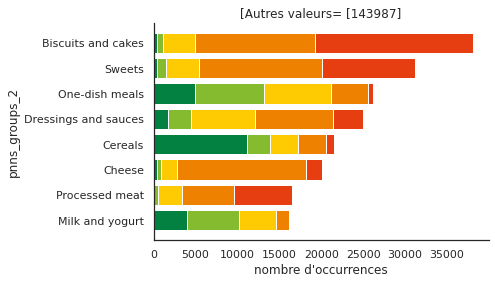

In [241]:
def plot_barh_stacked(df:pd.DataFrame, y_var, groupby_var, sort_counts=True, nb=8):
    ct = pd.crosstab(df[y_var], df[groupby_var])
    groups = list(ct.columns)
    other_count = 0
    for i in range(1, len(groups)):
        ct.iloc[:, i] = ct.iloc[:, i] + ct.iloc[:, i - 1]
    if sort_counts:
        # Assign sum of all rows of DataFrame as a new Row
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=False)
        nb = min(len(ct), nb)
        other_count = ct.iloc[nb:, -1].sum()
        ct = ct.head(nb)
        # plt.barh starts from bottom
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=True)

    # prepare to plot

    palette = get_palette(groupby_var)
    if palette is None:
        colors = plt.cm.get_cmap('spectral',len(groups))
    else:
        colors = list(palette.values())
    plt.figure()
    for i in range(len(groups) - 1, -1, -1):
        plt.barh(ct.index, ct[groups[i]], color=colors[i])
    ax = plt.gca()
    ax.set_title(f'[Autres valeurs= [{other_count}]')
    ax.set_xlabel("nombre d'occurrences")
    ax.set_ylabel(y_var)
    sns.despine()


(cleaned_data
 .dropna(subset=['pnns_groups_2', 'nutriscore_grade'])
 .pipe(plot_bar_top_n, 'pnns_groups_2', nb=8)
 )

plt.show()
cleaned_data.pipe(plot_barh_stacked, 'pnns_groups_2', 'nutriscore_grade', nb=8)


nutriscore_grade            a    b     c     d    e   sum
additives_en                                             
E330 - Citric acid       1023  405   695   735  709  3567
E440 - Pectins             78  177  1388  1037   84  2764
E14XX - Modified Starch   394  808   614   285   55  2156
E300 - Ascorbic acid      916  275   424   229  309  2153
E250 - Sodium nitrite       6   25    92   206  497   826


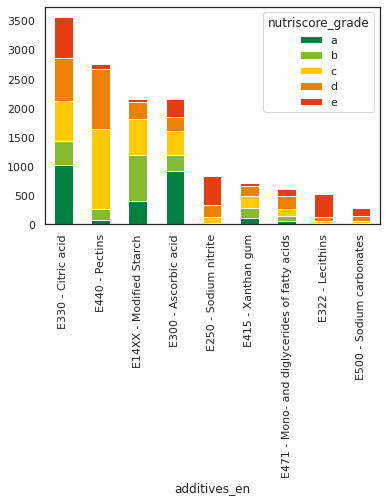

In [242]:
def plot_repartition_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False, score_column='nutriscore_grade',
                            palette=nutriscore_palette):
    top_n = filtre_par_top_freq(df, tag_column, nb=nb)
    top_tags = top_n.value_counts().index
    if sort_tags:
        top_tags = top_tags.sort_values()
    grades = df[score_column].dropna().unique().tolist()
    grades.sort()
    filtre = top_n.notnull() & df[score_column].notnull()
    if not other_tags:
        # 'exclut les autres tags'
        filtre &= top_n != 'other'
        filtre &= top_n != 'unknown'
    data = df[filtre]
    # .groupby([tag_column,score_column]).agg(['count'])
    ct = pd.crosstab(data[tag_column], data[score_column])
    sort_tags = True
    if sort_tags:
        # Assign sum of all rows of DataFrame as a new Row
        ct.loc[:, 'sum'] = ct.sum(axis=1)
        ct = ct.sort_values(by='sum', axis=0, ascending=False)
        print(ct.head())
        ct = ct.drop('sum', axis=1)

    groups = ct.index.unique()
    palette = get_palette(score_column)
    if palette:
        colors = palette.values()
    else:
        colors = plt.cm.get_cmap('spectral',len(groups))
    ct.plot(kind='bar', stacked=True, color=colors)


def plot_nutrigrade_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False):
    plot_repartition_by_tag(df, tag_column, nb, other_tags,
                            sort_tags=sort_tags, score_column='nutriscore_grade')


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_nutrigrade_by_tag, 'additives_en')
 )


en:e482|en:e432|en:e228|en:e493|en:e243|en:e131|en:e407|en:e133|en:e494|en:e436|en:e213|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e226|en:e492|en:e433|en:e435|en:e338|en:e343|en:e227|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e507|en:e250|en:e491|en:e459|en:e222|en:e621|en:e960|en:e450
nutriscore_grade            a     b     c     d     e    sum
additives_en                                                
E330 - Citric acid       4805  2278  3754  2809  1754  15400
E440 - Pectins            365   465  2001  1477   218   4526
E415 - Xanthan gum        348   519   908  1196   381   3352
E300 - Ascorbic acid     1152   400   679   338   398   2967
E14XX - Modified Starch   448   967   851   417    87   2770


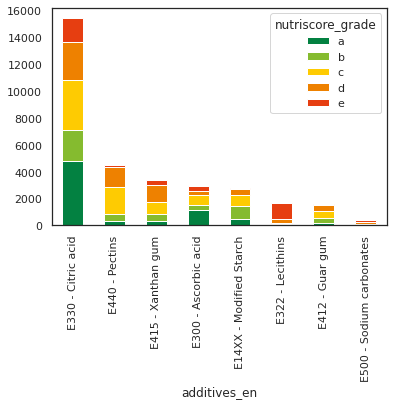

In [243]:
(cleaned_data
 .pipe(get_safe_products)
 .pipe(plot_repartition_by_tag,'additives_en')
 )

nutriscore_grade            a    b    c    d    e   sum
additives_en                                           
E407 - Carrageenan        205  472  547  447  144  1815
E250 - Sodium nitrite      19   49  164  499  789  1520
E202 - Potassium sorbate  123  209  379  322  152  1185
E450 - Diphosphates        61   36   25   46   79   247


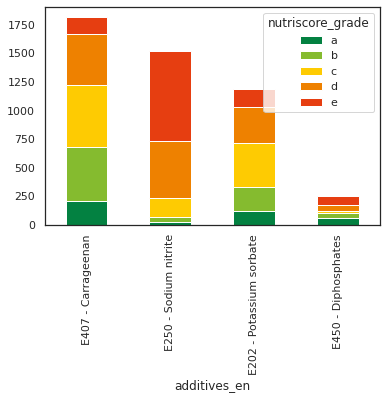

In [244]:
unsafe_products.pipe(plot_nutrigrade_by_tag, 'additives_en')


### Variation de nutriscore par addiscore_risk dans chaque catégorie PNNS_group_2


"distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot.png"


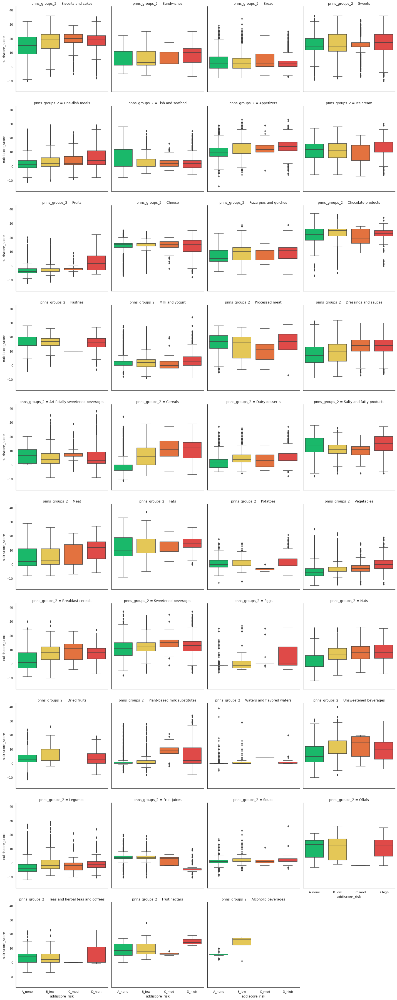

In [247]:
sns.catplot(
    data=cleaned_data, x='addiscore_risk', y='nutriscore_score',
    col='pnns_groups_2', palette=addiscore_palette, order=addiscore_order, kind='box', col_wrap=4, )
# sns.boxplot(data=cleaned_data, x='pnns_groups_1', y='nutriscore_score',hue='nutriscore_grade', palette=nutriscore_palette)
to_png('distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot')


### Regression plot: nutriscore y saturated fats

Est-ce que la catégorie d'addiscore risk est corrélé avec la quantité de gras ?

"regression_saturated-fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot.png"


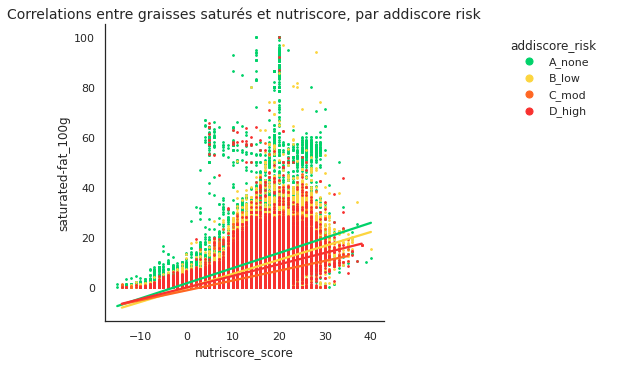

In [248]:

(cleaned_data[['nutriscore_score', 'saturated-fat_100g', 'addiscore_risk']]
 .dropna()
 .pipe(plot_reg, y_var='saturated-fat_100g', hue='addiscore_risk')
 )
plt.title('Correlations entre graisses saturés et nutriscore, par addiscore risk', size=14)
to_png(f'regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot')



In [249]:
def plot_correlations_nutriscore(df:pd.DataFrame):
    for col in colonnes_100g:
        (df
         .pipe(filter_by_nova_group, 4)[['nutriscore_score', col, 'addiscore_risk']]
         .dropna()
         .pipe(plot_reg, y_var=col, hue='addiscore_risk')
         )
        plt.title(f'Correlations (NOVA 4) entre {col} et nutriscore, par addiscore risk', size=14)
        to_png()
        plt.show()

# cleaned_data.pipe(plot_correlations_nutriscore)

### Distribution d'addiscore risk pour chaque PNNS_groups_2 (Stacked histogram)

In [251]:
def plot_stacked_histogram(df:pd.DataFrame, x_var, groupby_var, normalize=False, sortbygroup=None):
    if normalize:
        ct = pd.crosstab(
            index=df[x_var], columns=df[groupby_var], normalize='index') * 100
    else:
        ct = pd.crosstab(index=df[x_var], columns=df[groupby_var])

    # prepare to plot
    groups = ct.columns.tolist()
    palette = get_palette_df(df,groupby_var)
    colors = palette.values() if palette else None

    _, ax = plt.subplots(figsize=(16, 9), dpi=80)

    if sortbygroup:
        ct = ct.sort_values(by=sortbygroup, ascending=False)

    # Draw
    ct.plot(kind='bar', stacked=True, color=colors, ax=ax)

    # Decoration
    plt.legend(title=f'Catégorie de {groupby_var}',
               labels={group: col for group, col in zip(groups, colors)},
               bbox_to_anchor=(1.4, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.title(
        f"Stacked Histogram of {x_var} colored by {groupby_var}", fontsize=22)
    plt.xlabel(x_var)
    plt.ylabel("Frequency")
    to_png(f'stacked_histogram_{x_var}_grouped_by_{groupby_var}')



"stacked_histogram_pnns_groups_2_grouped_by_addiscore_risk.png"


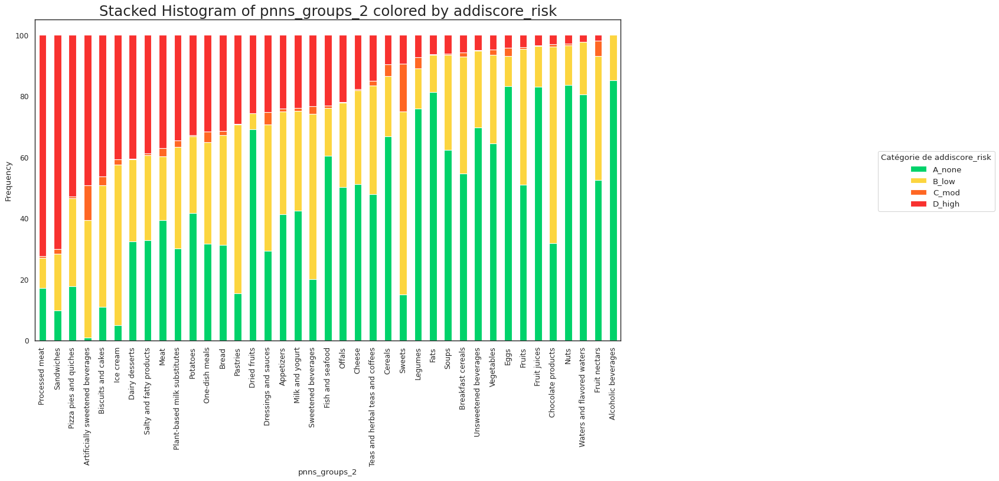

In [252]:
# cleaned_data['pnns_groups_2'],cleaned_data['addiscore_risk'],
plot_stacked_histogram(cleaned_data, 'pnns_groups_2',
                       'addiscore_risk', normalize=True, sortbygroup='D_high')


## Colonnes très corrélées entre eux

| colonne1             | colonne2             | test de corrélation (dependence) |
|----------------------|----------------------|----------------------------------|
| numérique            | numérique            | pearson correlation              |
| catégorique(ordinal) | numérique            | spearman's rank correlation      |
| catégorique(nominal) | catégorique(nominal) | chi-square                       |

- Chi-Square Goodness of Fit Test — test if one variable is likely to come from a given distribution.

https://towardsdatascience.com/statistics-in-python-using-chi-square-for-feature-selection-d44f467ca745

- Chi-Square Test of Independence — test if two variables might be correlated or not.
  - H0 : les 2 variables sont indépendants
  - H1 : les 2 variables sont dépendants un sur l'autre


## 6.7 Correlations entre addiscore et autres colonnes
- servings_100g,nova_group,nutriscore,additifs_n, ingredients_n

Est-ce que l'addiscore est correlé avec d'autres variables


"Correlations_entre_les_variables_numériques.png"


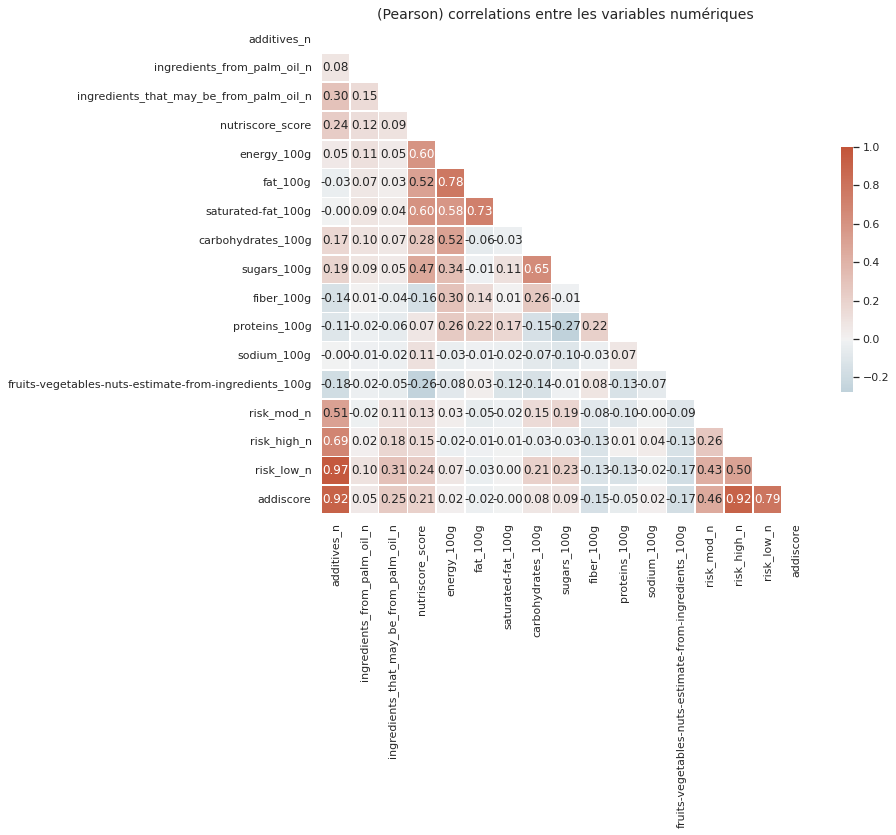

In [253]:
def plot_heatmap(df:pd.DataFrame):
    corr_tab = cleaned_data.select_dtypes('number').corr()
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_tab, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr_tab, annot=True, fmt='.2f', mask=mask, cmap=cmap, vmax=1, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_heatmap)
 )
plt.title('(Pearson) correlations entre les variables numériques', size=14)
to_png('Correlations_entre_les variables_numériques')


# 7. Analyse en Composants Principales (ACP)

- <https://www.datasklr.com/principal-component-analysis-and-factor-analysis/principal-component-analysis>
- <https://jmausolf.github.io/code/pca_in_python/>
- <https://cmdlinetips.com/2018/03/pca-example-in-python-with-scikit-learn/>

### 7.1.1 ACP : Objectifs d'Analyse Exploratoire

- Analyse de Composants Principales :
  - réduire les dimensions en trouvant des variables qui explique le plus de variance entre observations

Sur les colonnes :

- servings_100g,nova_group,nutriscore,ecoscore,additifs_n, ingredients_n


In [254]:
names = cleaned_data["product_name"]  # ou data.index pour avoir les intitulés


### PCA étape 1 - selection des colonnes à prendre en compte dans l'ACP

#### Sélectionner les variables quantitatives nutritionnelles


In [255]:
def datetime_to_float(df:pd.DataFrame):
    date_cols = list(df.select_dtypes('datetime'))
    for col in date_cols:
        df[col] = df[col].astype('datetime64').view(
            np.int64).astype(np.float64)
    return df


def pca_select_vars(df:pd.DataFrame, exclude_cols=[]):
    cols_to_include = list(df.select_dtypes(include=['number']).columns)
    cols_to_drop = list(set(cols_to_include) & set(exclude_cols))
    # cols= list(set(cols_to_include) - set(cols_to_drop))
    return df[cols_to_include].drop(cols_to_drop, axis=1)


pca_exclude_cols = list(set(cleaned_data.columns) - set(colonnes_100g))
print(f'exclude cols : {pca_exclude_cols}')

pca_data = cleaned_data.pipe(pca_select_vars, exclude_cols=pca_exclude_cols)
pca_data.info()


exclude cols : ['categories_en', 'nova_group', 'additives_n', 'addiscore', 'nutriscore_grade', 'pnns_groups_2', 'brands_tags', 'creator', 'additives_tags', 'addiscore_risk', 'additives_en', 'risk_high_n', 'ingredients_that_may_be_from_palm_oil_n', 'states_en', 'risk_low_n', 'countries_en', 'nutriscore_score', 'main_category_en', 'risk_mod_n', 'ingredients_from_palm_oil_tags', 'last_modified_datetime', 'created_datetime', 'energy_100g', 'ingredients_text', 'ingredients_from_palm_oil_n', 'labels_en', 'pnns_groups_1', 'product_name', 'ingredients_that_may_be_from_palm_oil_tags', 'code']
<class 'pandas.core.frame.DataFrame'>
Int64Index: 412486 entries, 2 to 597242
Data columns (total 8 columns):
 #   Column                                                 Non-Null Count   Dtype  
---  ------                                                 --------------   -----  
 0   fat_100g                                               411906 non-null  float64
 1   saturated-fat_100g                     

### PCA étape 2 - Préparation des données sélectionnées pour l'ACP

#### 2a : éliminer les outliers :

- pour réduire le risque de trop d'influence des outliers
- éliminer ou abs(Z-score) > 3 (pas bon pour des colonnes avec beaucoup de skew)
- éliminer les top 1% et bottom 1%


In [256]:
def drop_high_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus grandes"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        # min_val = df[column].quantile(alpha)
        max_val = df[column].quantile(1 - alpha)
        # filtre &= df[column]>min_val
        filtre |= df[column] > max_val

    nb = df[filtre].shape[0]
    print(f'drop_high_outliers, nb={nb}')  # ', (subset={subset})')
    return df[~filtre]


def drop_low_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus petites"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        min_val = df[column].quantile(alpha)
        # max_val = df[column].quantile(1-alpha)
        filtre |= df[column] < min_val
        # filtre &= df[column]<max_val

    nb = df[filtre].shape[0]
    print(f'drop_low_outliers, nb={nb}')  # , (subset={subset})')
    return df[~filtre]


print(pca_data.shape)
pca_data = (pca_data
            .pipe(drop_high_outliers)
            .pipe(drop_low_outliers))
print(pca_data.shape)


(412486, 8)
drop_high_outliers, nb=22969
drop_low_outliers, nb=0
(389517, 8)


#### 2b : éliminer les NaN :

- dropna() # pour ne réduire pas la variance d'un variable
- fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
- drop(columns={colonnes moins importantes qui contient des NaN})

In [257]:
def drop_colonnes_vides(df:pd.DataFrame, threshold=0):
    count = df.isna().mean()
    colonnes_vides = count[(1 - count) <= threshold].index.to_list()
    print(f'drop_colonnes_vides, threshold = {threshold}')
    return df.drop(colonnes_vides, axis=1)


pca_data = (pca_data.pipe(drop_colonnes_vides, threshold=0.25).dropna())
print(pca_data.shape)



drop_colonnes_vides, threshold = 0.25
(283841, 8)


In [258]:
features = list(pca_data.columns)
print(features)


['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


### PCA étape 3 - standardise (centrage et réduction d'échelle)

Variables sur des échelles différentes sont standardisé pour contribuer également à l'analyse


In [259]:
from sklearn.preprocessing import StandardScaler

def pca_standardise(df:pd.DataFrame):
    """Standardize the data"""
    scaler = StandardScaler()
    # return scaler.fit(df).transform(df) # numpy array
    # attention de ne perd pas l'index aux produits
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

X_scaled_df = pca_data.pipe(pca_standardise)
X_scaled_df.head()


,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
2,0.28,0.54,0.39,0.98,-0.42,-0.55,-0.57,-0.41
3,0.24,0.99,-0.37,-0.53,0.26,0.22,0.38,-0.41
5,0.81,1.51,-0.36,-0.59,0.30,0.44,0.87,-0.41
6,-0.23,0.06,-0.26,-0.57,0.08,0.70,0.51,-0.41
8,1.04,1.45,0.45,1.27,-0.45,-0.25,-0.24,-0.41


Même chose manuellement

In [260]:
def z_score(df:pd.DataFrame):
    """
        Appliquer le z-score en utilisant .mean() et .std()
        même résultat qu'utilisant StandardScaler.
        StandardScaler est optimisé pour des grandes matrices
    """
    df_std = df.copy()
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()
                          ) / df_std[column].std(ddof=0)
    return df_std



Créer un target dataframe (vide pour le moment) avec un 'index' des produits, pour faire des joins sur les données

In [261]:

target_df = pd.DataFrame(pca_data.index, columns={'id'}, index=pca_data.index)
target_df.head()


,id
2,2
3,3
5,5
6,6
8,8


In [262]:
from sklearn.decomposition import PCA

# choix du nombre de composantes à calculer
n_comp = len(pca_data.columns)

# Create the PCA model
dpca = PCA(n_components=n_comp)

# Fit the model with the standardised data
dpca.fit(X_scaled_df)

pc= dpca.transform(X_scaled_df)
# pc = dpca.fit_transform(X_scaled_df)
nom_cols = [f'PC{i}' for i in range(1, n_comp + 1)]
print(nom_cols)
print(dpca.explained_variance_ratio_.cumsum())
pc_df = pd.DataFrame(data=pc, columns=nom_cols, index=X_scaled_df.index)
pc_df.head()


['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']
[0.2631838  0.49604217 0.64602813 0.78798577 0.87735632 0.93967746
 0.97228042 1.        ]


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
2,0.43,-1.10,-0.71,-0.70,-0.21,-0.07,0.02,0.14
3,0.75,0.80,-0.19,-0.10,-0.19,-0.47,0.25,-0.56
5,1.53,1.19,-0.27,-0.23,0.13,-0.58,0.19,-0.61
6,0.13,0.94,-0.17,0.55,-0.19,0.17,0.16,-0.21
8,1.61,-0.92,-0.87,-1.14,0.03,-0.05,0.06,0.06


### Scree plot

- A visual approach to selecting the number of principal components
- number of components on the X-axis against the proportion of the variance explained on the Y-axis.
- The suggested number of components to keep is where the plot forms an elbow and the curve flattens out.
- The Kaiser rule : the number of principal components to keep equals the number of eigenvalues greater than 1.
- Or a minimal threshold of cumulative explained variation in the data (as % of total variation). 

"pca_var_explained_scree_plot.png"


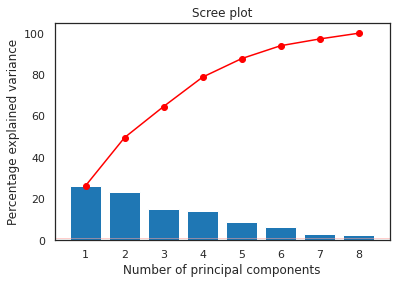

In [263]:
from matplotlib.ticker import MaxNLocator


def display_scree_plot(pca):
    """Display a scree plot for the pca"""
    scree = pca.explained_variance_ratio_ * 100
    plt.bar(np.arange(len(scree)) + 1, scree)
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), c="red", marker='o')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    # plt.ylabel('Eigenvalue')
    plt.axhline(y=1, linewidth=1, color='r', alpha=0.5)
    plt.title('Scree Plot of PCA: Component Eigenvalues')

    plt.xlabel("Number of principal components")
    plt.ylabel("Percentage explained variance")
    plt.title("Scree plot")

display_scree_plot(dpca)
to_png(f'pca_var_explained_scree_plot')


### PCA Cercle des corrélations


In [264]:
from matplotlib.collections import LineCollection


def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:  # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7, 6))

            # détermination des limites du graphique
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(
                    pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(
                    lines, axes=ax, alpha=.1, color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if xmin <= x <= xmax and ymin <= y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation, color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel(
                f'PC{d1 + 1} ({round(100 * pca.explained_variance_ratio_[d1], 1)}%)')
            plt.ylabel(
                f'PC{d2 + 1} ({round(100 * pca.explained_variance_ratio_[d2], 1)}%)')

            plt.title(f'Cercle des corrélations (PC{(d1 + 1)} et PC{(d2 + 1)})')
            to_png(f'pca_display_circles_(PC{(d1 + 1)}_et_PC{(d2 + 1)})')
            plt.show(block=False)


"pca_display_circles_(PC1_et_PC2).png"


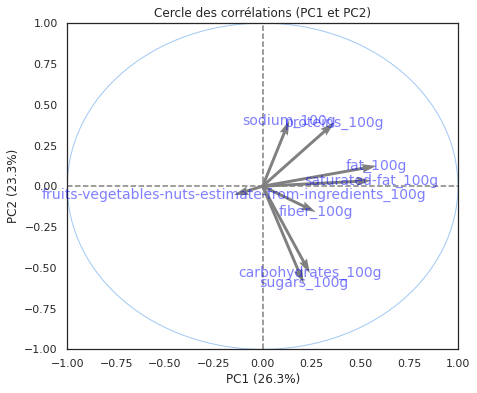

"pca_display_circles_(PC3_et_PC4).png"


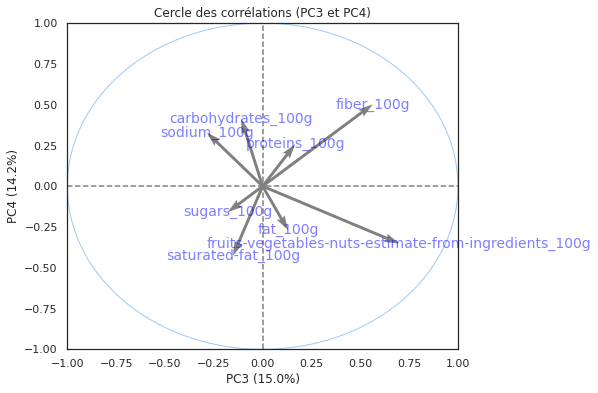

"pca_display_circles_(PC5_et_PC6).png"


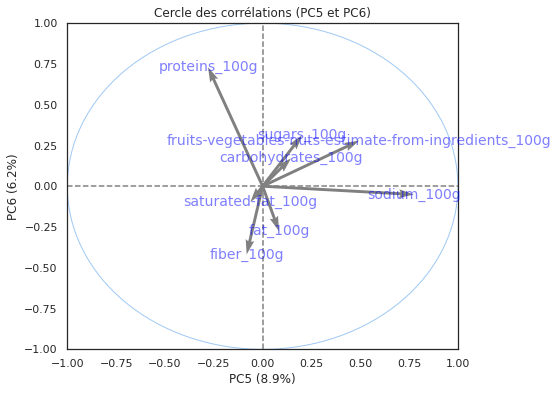

In [265]:


display_circles(pcs=dpca.components_, n_comp=n_comp, pca=dpca, axis_ranks=[
    (0, 1), (2, 3), (4, 5)], labels=np.array(features))


## Visualiser les données sur les nouvelle 'composantes principales'
### Filtrer les donneés pour excluir les outliers

In [266]:
for_visual = target_df[['id']].join(pc_df, how='inner')
for_visual.head()
pc_df = pc_df.rename_axis('id')


ajouter les colonnes des données nettoyés

In [267]:
for_visual = pc_df.join(cleaned_data, how='inner')
for_visual[for_visual['PC2'] > 10].index


Int64Index([], dtype='int64')

In [268]:
def explode_by_series(df:pd.DataFrame, col, exclude_groups=None):
    # si la colonne est numérique, pas besoin de traitement
    if df[col].dtype.kind in 'biufc':
        df = df.dropna(subset=[col]).copy()
        df[col] = df[col].astype(str)
        return df
    ret = df.dropna().copy()

    ret[col] = ret[col].str.split(',')
    ret = ret.explode(col)
    return ret


# feature='additives_tags'
# feature = 'nutriscore_grade'
feature = 'risk_high_n'
explode_by_series(for_visual[['PC1', 'PC2', feature]], feature).tail()


,PC1,PC2,risk_high_n
597235,-1.03,-1.18,0.0
597236,-1.48,0.83,0.0
597239,-1.62,0.32,0.0
597240,-1.58,0.40,0.0
597242,-1.62,-0.50,0.0


In [269]:
def plot_components(data, axis1='PC1', axis2='PC2', feature='nutriscore_grade',
                    exclude_groups=None, size=1, legend_out=False):
    """Version simplifiée de display_factorial_planes """
    df = explode_by_series(
        data[[axis1, axis2, feature]], feature, exclude_groups)
    # return df.shape
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1)

    d1 = int(axis1[2:]) - 1
    d2 = int(axis2[2:]) - 1
    # Label the axes, with the percentage of variance explained
    ax.set_xlabel(f'{axis1} ({100 * dpca.explained_variance_ratio_[d1]:.1f}%)', fontsize=15)
    ax.set_ylabel(f'{axis2} ({100 * dpca.explained_variance_ratio_[d2]:.1f}%)', fontsize=15)

    ax.set_title(
        f'Composantes principales ({axis1}, {axis2}) vs. {feature}', fontsize=20)

    palette = get_palette_df(df, feature, exclude_values=exclude_groups)
    groups = palette.keys()
    colors = palette.values()
    for group, color in zip(groups, colors):
        if group != 'unknown':
            indices_to_keep = df[feature] == group
            ax.scatter(df.loc[indices_to_keep, axis1],
                       df.loc[indices_to_keep, axis2],
                       c=color, alpha=0.5, s=size)
    if legend_out:
        ax.legend(groups,bbox_to_anchor=(1.2,0.5),loc="center right", fontsize=12,
        bbox_transform=plt.gcf().transFigure,markerscale=6)
    else:
        ax.legend(groups, markerscale=6)
    ax.grid()
    plt.subplots_adjust()
    to_png(f'pca_plot_components_{feature}_({axis1}_et_{axis2})')
    plt.show()


### PCA nutrigrade

"pca_plot_components_nutriscore_grade_(PC1_et_PC2).png"


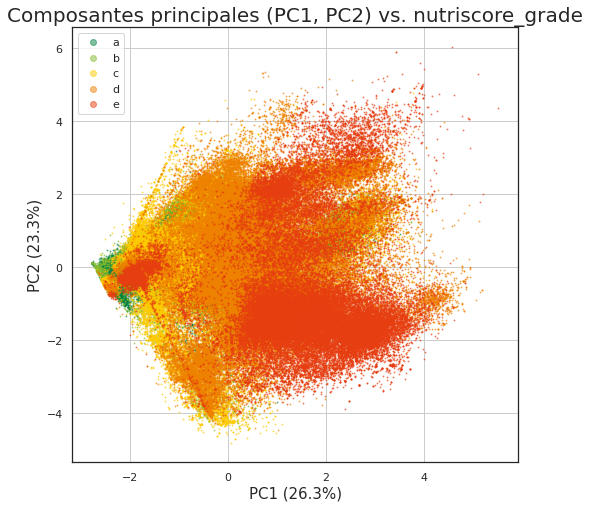

"pca_plot_components_nutriscore_grade_(PC3_et_PC4).png"


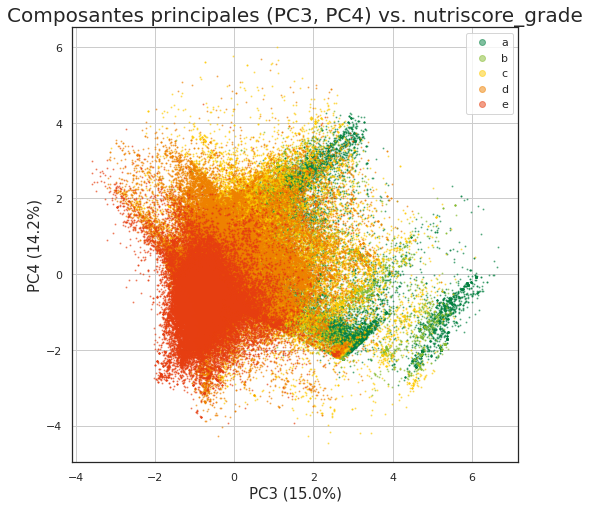

In [270]:
plot_components(for_visual, axis1='PC1', axis2='PC2',feature='nutriscore_grade')
plot_components(for_visual, axis1='PC3', axis2='PC4',feature='nutriscore_grade')

### PCA groupes NOVA

"pca_plot_components_nova_group_(PC1_et_PC2).png"


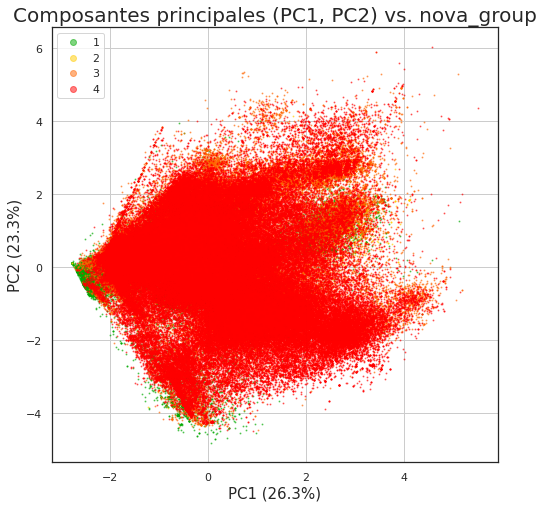

"pca_plot_components_nova_group_(PC3_et_PC4).png"


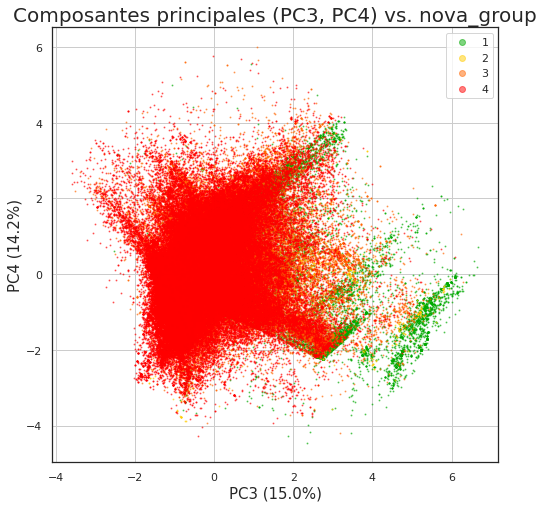

In [271]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='nova_group')
plot_components(for_visual, axis1='PC3', axis2='PC4', feature='nova_group')

### PCA groupes PNNS 1

pnns_groups_1, exclude nb: 2
"pca_plot_components_pnns_groups_1_(PC1_et_PC2).png"


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


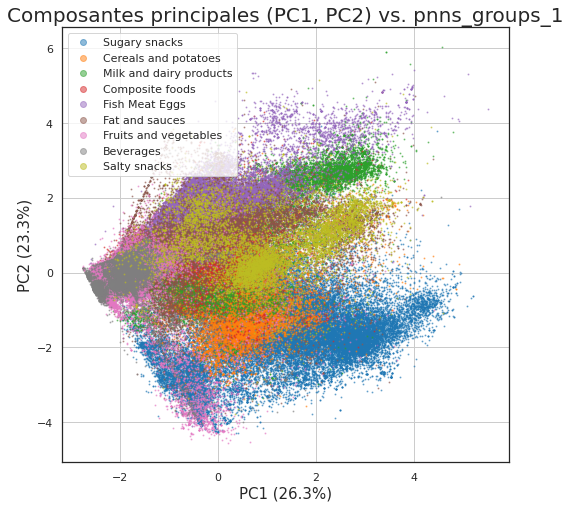

pnns_groups_1, exclude nb: 2
"pca_plot_components_pnns_groups_1_(PC3_et_PC4).png"


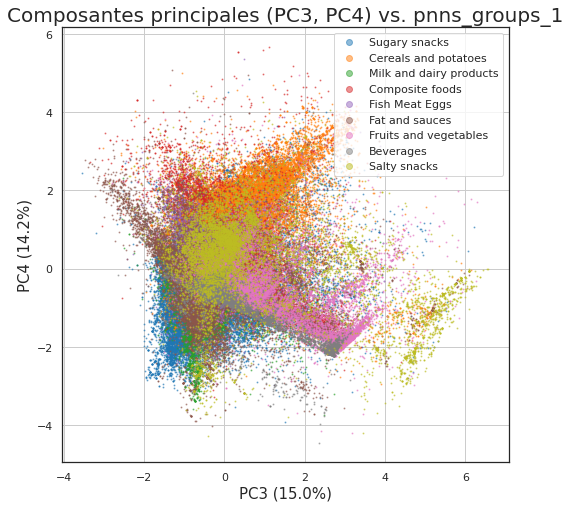

In [272]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])
plot_components(for_visual, axis1='PC3', axis2='PC4', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])

### PCA addiscore et addiscore risk
Aucun des composantes principales basées sur les colonnes nutritionnelles et capable de discriminer 
- le nombre d'additifs
- le risque des additifs

"pca_plot_components_addiscore_risk_(PC1_et_PC2).png"


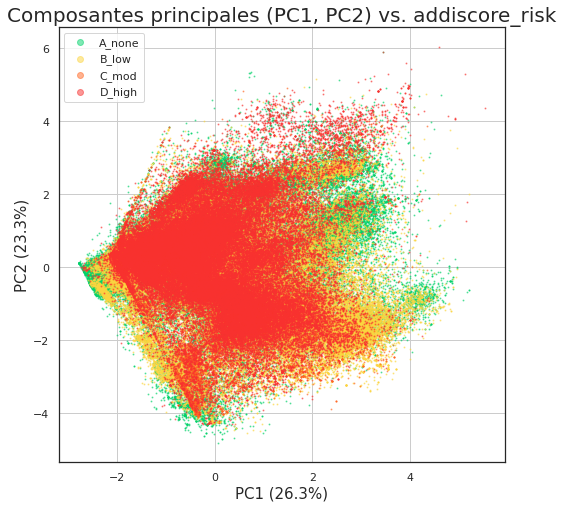

risk_high_n, exclude nb: 2
"pca_plot_components_risk_high_n_(PC1_et_PC2).png"


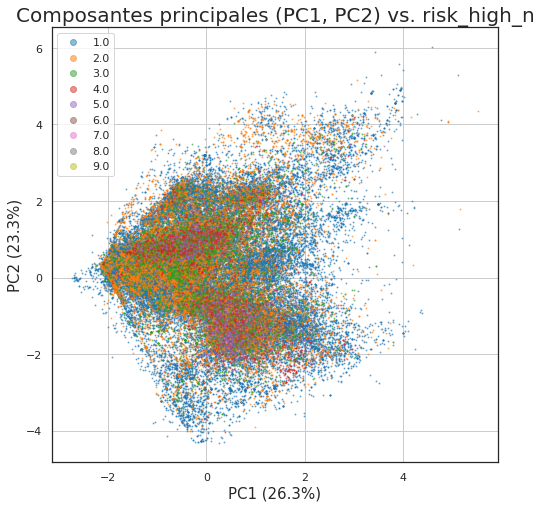

In [273]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='addiscore_risk')
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='risk_high_n',
                exclude_groups=['0', '0.0'])
 

### PCA additives à risque élevés or modérés

additives_en, exclude nb: 463
"pca_plot_components_additives_en_(PC1_et_PC2).png"


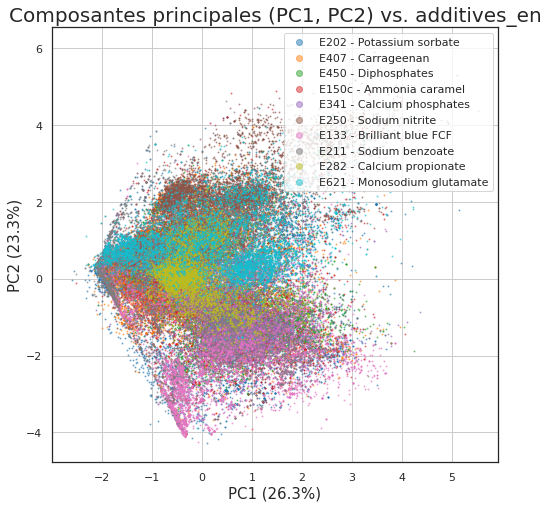

additives_tags, exclude nb: 463
"pca_plot_components_additives_tags_(PC1_et_PC2).png"


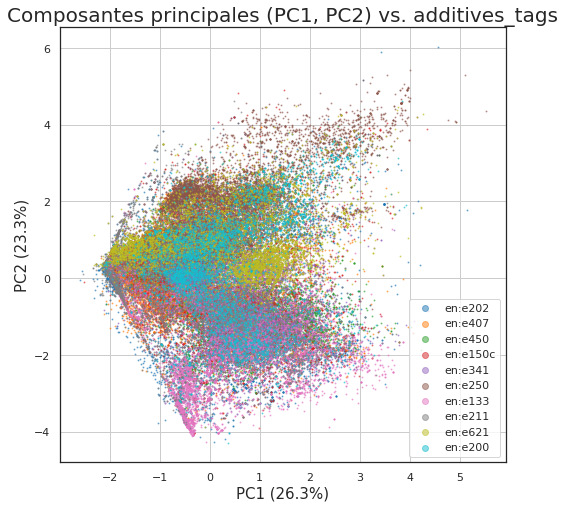

In [274]:
plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_en', exclude_groups=safe_additives_df['name'])
plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_tags', exclude_groups=safe_additives_df['id'])

### PCA groupes PNNS 2 (seulement les groupes à risques élévés)

"pca_plot_components_addiscore_risk_(PC1_et_PC2).png"


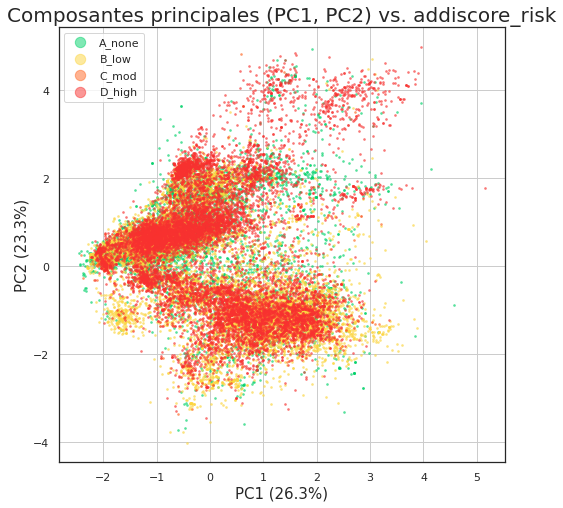

"pca_plot_components_addiscore_risk_(PC3_et_PC4).png"


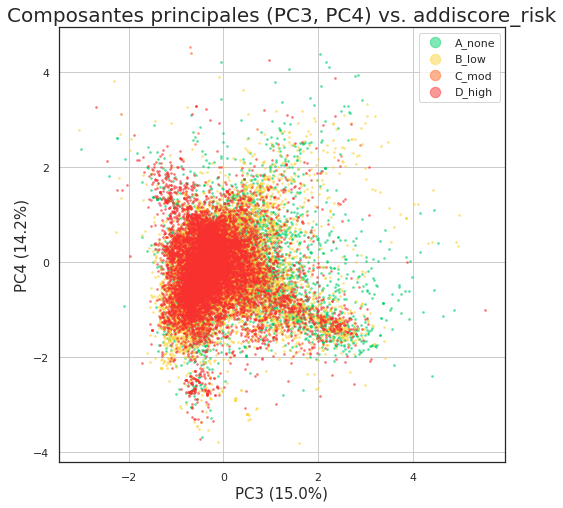

In [275]:
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC1', axis2='PC2', feature='addiscore_risk', size=3)
 )
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC3', axis2='PC4', feature='addiscore_risk', size=3)
 )

# 8. Système de Recommendation

- trouver la produit (ou plusieurs avec la même nom)
- identifier le 'main_category_en' du produit
- select autres produits dans ce categorie
- si autres produits
    - trier par addiscore
    - offre le meilleur nutrigrade dans les top addiscore

In [276]:
def flatten(lists: list, exclude='in,is,,with'.split(',')) -> list:
    flat_list = []
    for sublist in lists:
        for item in sublist:
            if not (item in exclude):
                flat_list.append(item)
    return flat_list


def search_words(search_str: str) -> list:
    words = search_str.split(' ')
    words = [w.split(',') for w in words]
    words = flatten(words)
    return words


def trouver_produit(df:pd.DataFrame, nom='chicken sandwich, with bacon'):
    words = search_words(nom)
    filtre = True
    for word in words:
        filtre &= df['product_name'].str.contains(word, case=False)
    return df[filtre]

    # .dropna(subset=['main_category_en'])


def filtre_top_n(df:pd.DataFrame, col='pnns_groups_2', nb=1):
    groups = df[col].value_counts()
    nb = max(nb, 1)
    nb = min(nb, len(groups))
    top_groups = groups.index.to_list()[:nb]
    print(f'top_group: {top_groups}')
    if not (isinstance(top_groups, list)): top_groups = [top_groups]
    return df[df[col].isin(top_groups)]


def affiche_meilleur_pire_produits(product_name):
    products = (cleaned_data
                .pipe(filter_by_country, 'France')
                .pipe(trouver_produit, product_name)
                .dropna(subset=['nutriscore_score', 'addiscore'])
                .pipe(filtre_top_n, 'pnns_groups_2', 1)
                )

    print(f'{len(products)} produits')
    # cols=['product_name', 'brands_tags', 'categories_en', 'labels_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g', 'risk_mod_n', 'risk_high_n', 'risk_low_n', 'addiscore', 'addiscore_risk']

    df = pd.DataFrame([], columns=products.columns)
    s1 = products.sort_values(by='addiscore', ascending=True).head(1)
    s2 = products.sort_values(by='addiscore', ascending=False).head(1)
    s3 = products.sort_values(by='nutriscore_score', ascending=True).head(1)
    s4 = products.sort_values(by='nutriscore_score', ascending=False).head(1)
    df = s1.append(s2).append(s3).append(s4)
    df['categ'] = ['meilleur addiscore', 'pire addiscore', 'meilleur nutriscore', 'pire nutriscore']
    return df


cols1 = ['product_name', 'brands_tags', 'nutriscore_score', 'nutriscore_grade', 'addiscore', 'addiscore_risk',
         'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'main_category_en', 'additives_n', 'risk_mod_n', 'risk_high_n',
         'risk_low_n']
affiche_meilleur_pire_produits('sandwich')[cols1]

# TODO
# products.pipe(crosstab_normalize,'nova_group','nutriscore_grade', normalize=False)
# products.pipe(plot_barh_stacked)

top_group: ['Sandwiches']
316 produits


,product_name,brands_tags,nutriscore_score,nutriscore_grade,addiscore,addiscore_risk,nova_group,pnns_groups_1,pnns_groups_2,main_category_en,additives_n,risk_mod_n,risk_high_n,risk_low_n
596816,"Préparation pour sandwich thon germon, poivrons, maïs et haricots rouges",la-belle-iloise,1.0,b,0.0,A_none,3,Composite foods,Sandwiches,Albacore,0,0.0,0.0,0.0
621,Sandwich de pollo a la mostaza-miel con queso y pan de tomate,naming,13.0,d,49.0,D_high,4,Composite foods,Sandwiches,Sandwiches,21,0.0,7.0,14.0
39286,Sandwich Thon/crudités,crous-resto,-7.0,a,15.0,D_high,4,Composite foods,Sandwiches,Sandwiches,7,0.0,2.0,5.0
235300,Sandwichs Poulet Tartare,betty-bossi,25.0,e,2.0,B_low,4,Composite foods,Sandwiches,Chicken sandwiches,2,0.0,0.0,2.0


In [277]:
affiche_meilleur_pire_produits('glace')[cols1]

top_group: ['Ice cream']
508 produits


,product_name,brands_tags,nutriscore_score,nutriscore_grade,addiscore,addiscore_risk,nova_group,pnns_groups_1,pnns_groups_2,main_category_en,additives_n,risk_mod_n,risk_high_n,risk_low_n
555888,Glace chocolat 100% bio,la-memere,10.0,c,0.0,A_none,4,Milk and dairy products,Ice cream,Chocolate ice cream tubs,0,0.0,0.0,0.0
1317,Glaces Vanille,morane,13.0,d,31.0,D_high,4,Milk and dairy products,Ice cream,fr:glaces-aromatisees,18,1.0,3.0,14.0
20798,Glace vanille Léger,"leger,migros",-5.0,a,13.0,D_high,4,Milk and dairy products,Ice cream,Ice creams,9,0.0,1.0,8.0
57781,Glace,les-glaces-du-canigou,27.0,e,6.0,B_low,4,Milk and dairy products,Ice cream,Ice creams and sorbets,6,0.0,0.0,6.0


---

#9. Clustering des additifs
- correlations entre des additifs 
- voir la répartition de chaque additif (group) entre les groupes de produits plus à risque
- voir si on peut recommander au producteurs de remplacer avec des additifs similaires mais moins risqué

## 9.1 Groupement des additifs

Objectif: Essaie de grouper les additifs par leur fonctionalité - présence dans certains groupes 
- voir les correlations / covariances des additifs

### 9.1.1 Méthode 1: Crosstabulation des additive tags (pd.dummies)

- trop gourmand en memoire
- mieux faire un stack ?


In [278]:

def crosstab_additives_tags(df:pd.DataFrame):
    # return pd.crosstab(df.index,df['additives_tags'])
    return pd.get_dummies(df['additives_tags']).groupby(level=0).sum()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(print_df_shape)
 .pipe(filter_by_additives_tags, min_count=1000)
 .pipe(print_df_shape)
 .pipe(crosstab_additives_tags)
 ).head()


(152100, 38)
(271876, 1)


,en:e100,en:e120,en:e14xx,en:e150a,en:e150d,en:e160,en:e160a,en:e160ai,en:e160b,en:e160c,en:e161b,en:e163,en:e200,en:e202,en:e211,en:e220,en:e223,en:e224,en:e250,en:e252,en:e262,en:e270,en:e282,en:e296,en:e300,en:e301,en:e316,en:e322,en:e322i,en:e326,en:e330,en:e331,en:e341,en:e392,en:e401,en:e407,en:e410,en:e412,en:e414,en:e415,en:e420,en:e422,en:e428,en:e440,en:e450,en:e450i,en:e451,en:e452,en:e466,en:e471,en:e472e,en:e476,en:e500,en:e500ii,en:e503,en:e503ii,en:e621,en:e903,en:e950,en:e955
21,1,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
22,1,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
23,1,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
43,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,1,1,1,0,1,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0
46,1,1,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0




## 9.2 Correlation entre les additifs de risque modéré et haut

### 9.1.3 Dendrograms des additifs

    additives_tags
43         en:e340
43         en:e407
43         en:e508
46         en:e131
170        en:e339
170        en:e340
170        en:e407
170        en:e450
183        en:e200
183        en:e252


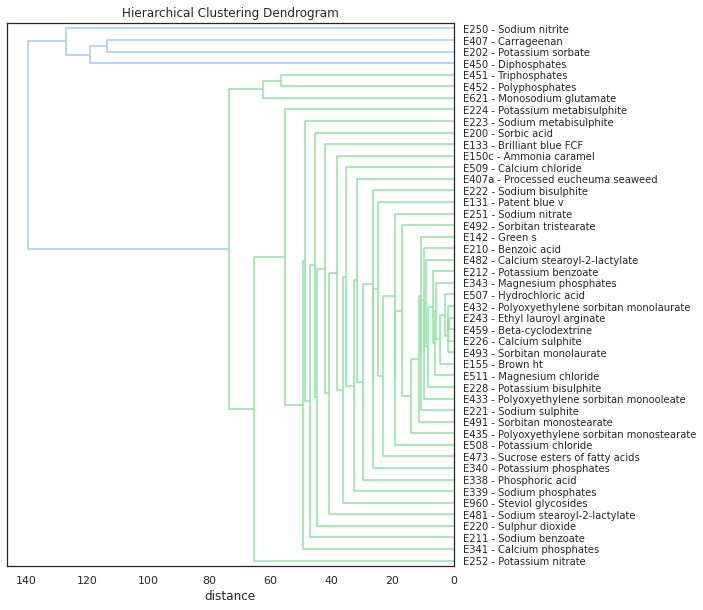

In [279]:
import scipy.cluster.hierarchy as shc

def plot_dendrogram(df:pd.DataFrame, method='ward', figsize=(10, 25), fontsize=16, mod_risk_tags=[], high_risk_tags=[]):
    """Plot a dendrogram to illustrate hierarchical clustering
    df should be scaled for correct linkage
    """
    if df.shape[0] > df.shape[1]:
        df = df.T
    plt.figure(figsize=figsize)
    dend = shc.dendrogram(shc.linkage(df, metric='euclidean', optimal_ordering=True, method=method),
                          labels=df.index,
                          orientation="left")
    ax = plt.gca()
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])

    ax.set_yticklabels(labels=labels, fontsize=fontsize)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')


# plot_dendrogram(ct.T)
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, additives_tags_list=unsafe_additives_df['id'], min_count=1000)
 .pipe(print_df_head)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram, figsize=(8, 10), mod_risk_tags=[], fontsize=10)
 )


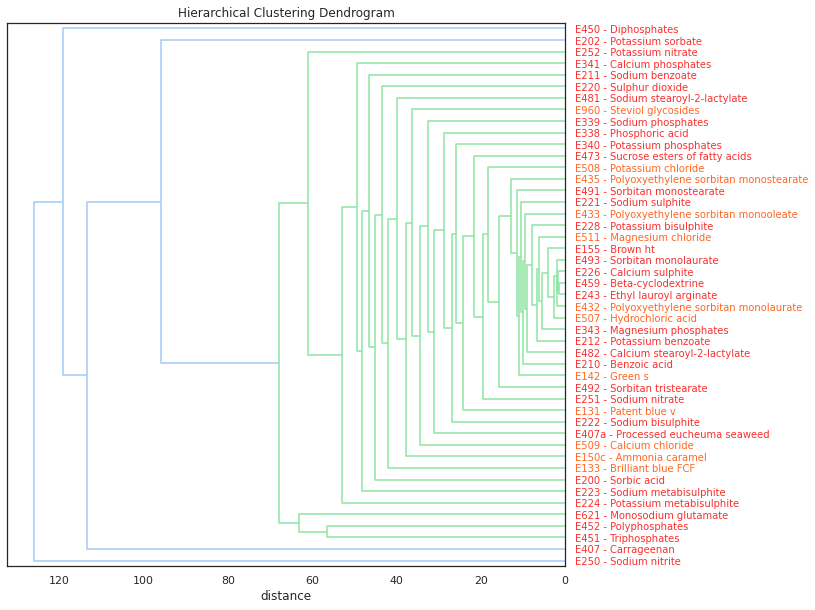

In [280]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, additives_tags_list=unsafe_additives_df['id'].to_list(), min_count=20)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram,
       figsize=(10, 10),
       method='complete',
       mod_risk_tags=mod_risk_additives['id'].to_list(),
       high_risk_tags=high_risk_additives['id'].to_list(),
       fontsize=10)
 )


# 10. Conclusion : Comment éviter les additifs à risque dans les plats prêts à consommer
- ➡️ Eviter les produits préparés de PNNS groupes 2 à risque élevés:
    - sandwiches, pizzas, boissons artificiellement sucrées, desserts lactées, viandes transformés
- ➡️ Création d'un addiscore_risk, basé sur le présence d'additifs de haut risque
- ➡️ Création d'un addiscore, basé sur le nombre d'additifs de haut risque
- ➡️ Création d'un système de recommendation


# 11. Wordclouds 

- note: la bibliothèque de wordclouds n'est pas mantenu - il faut python 3.7 pour que ça marche
- j'ai copié le source du bibliothèque (dossier (wordcloud) et désactivé la cython qui bogue sur python 3.9
- c'est plus lent (20 s à 1 minute), mais ça marche 

## 11.1 Wordclouds - types de produit (main_category_en) contenant des additifs nocifs


In [281]:

sans_interet = 'of,and,it,(%),in,to,with,by,for,who,are,the,-'.split(',')


def top_words(df:pd.DataFrame, col, nb=20):
    words = []
    for lab in df[col]:
        words += lab.split(" ")
    counter = Counter(words)
    return counter.most_common(nb)


def top_tags(df:pd.DataFrame, col, nb=20):
    count = df[col].str.split(',').explode().value_counts().head(nb)
    return count.to_frame(name='count').rename_axis('word').reset_axis()


def common_word_count(df:pd.DataFrame, col, nb=20):
    c = top_words(df, col, nb=nb)
    ret = pd.DataFrame.from_records(c, columns=['word', 'count'])
    filtre = ret['word'].isin(sans_interet)
    ret = ret[~filtre]
    return ret


In [282]:
from collections import Counter


def count_word_freq(df:pd.DataFrame, col='', sep=',', nb=30):
    """count frequency of words or tags in a column, 
       return a dictionary, with size based on tag
       If sep=',' fastest is to explode column and count values
       If sep=' ', use counter + STOPWORDS to get word count
    """
    if sep == ',':
        count = df[col].str.split(',').explode().value_counts()
        return dict(zip(count.index, count.values))


In [283]:
def plot_wordcloud(df:pd.DataFrame,width=960, height=1080, colormap='PuBuGn'):    
    """
       creer a wordcloud, with size based on tag
       dimensions 960 x 1080 == half screen
    """
    if ENV !='colab': 
        print('latest wordcloud library requires python < 3.8')
        return

    # Google colab (python 3.7) est compatible avec wordcloud qui est pré-installé
    # On profite pour créer des visuels pour le support 
    from wordcloud import WordCloud

    wordcount=dict(zip(df['name'], df['freq']))

    wordcloud = WordCloud(width=width, height=height,
                           prefer_horizontal=1,  # pas de mots verticals
                           colormap=colormap,
                           background_color='black',
                           mode='RGBA').fit_words(wordcount)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.margins(x=0, y=0)



### Wordcloud - additifs à risque élevé
addiscore_risk == D_high

en:e482|en:e228|en:e493|en:e243|en:e407|en:e494|en:e213|en:e339|en:e200|en:e481|en:e223|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e212|en:e226|en:e492|en:e338|en:e343|en:e227|en:e473|en:e210|en:e340|en:e224|en:e452|en:e250|en:e491|en:e459|en:e222|en:e621|en:e450
                              name    freq
0            E250 - Sodium nitrite  9722.0
1              E450 - Diphosphates  8744.0
2               E407 - Carrageenan  7218.0
3         E202 - Potassium sorbate  7189.0
4     E450i - Disodium diphosphate  2908.0
5             E451 - Triphosphates  2577.0
6      E621 - Monosodium glutamate  2198.0
7         E252 - Potassium nitrate  2197.0
8            E452 - Polyphosphates  1744.0
9  E224 - Potassium metabisulphite  1568.0
"E1-5_wordcloud_high_risk_additives.png"


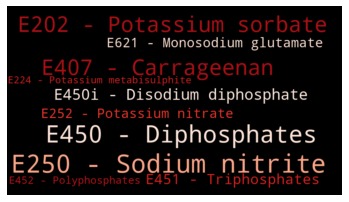

In [284]:
(cleaned_data
 .dropna(subset=['additives_tags'])
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=high_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=540, colormap='Reds')
 )
to_png(f'E1.5_wordcloud_high_risk_additives')

### Wordcloud - additifs à risque modéré
addiscore_risk == C_mod

en:e432|en:e131|en:e133|en:e436|en:e509|en:e150c|en:e508|en:e433|en:e435|en:e511|en:e142|en:e507|en:e960
                                           name   freq
0                     E133 - Brilliant blue FCF  919.0
1                       E150c - Ammonia caramel  755.0
2                     E960 - Steviol glycosides  671.0
3                       E509 - Calcium chloride  644.0
4                          E131 - Patent blue v  315.0
5           E1422 - Acetylated distarch adipate  266.0
6                     E508 - Potassium chloride  190.0
7  E435 - Polyoxyethylene sorbitan monostearate  104.0
8                                E142 - Green s   61.0
9    E433 - Polyoxyethylene sorbitan monooleate   49.0
"E1-5_wordcloud_mod_risk_additives.png"


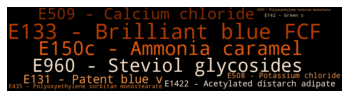

In [285]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=mod_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=240, colormap='Oranges')
 )
to_png(f'E1.5_wordcloud_mod_risk_additives')

### Wordcloud - additifs à risque bas
addiscore_risk == B_low

en:e1412|en:e100|en:e543|en:e1404|en:e472c|en:e304|en:e451ii|en:e452ii|en:e1440|en:e324|en:e905c|en:e622|en:e555|en:e907|en:e282|en:e443|en:e104|en:e172|en:e484|en:e450v|en:e166|en:e420ii|en:e214|en:e365|en:e965i|en:e626|en:e322i|en:e375|en:e342|en:e240|en:e962|en:e140ii|en:e150d|en:e402|en:e263|en:e585|en:e521|en:e201|en:e900b|en:e900|en:e924a|en:e503ii|en:e579|en:e1442|en:e925|en:e468|en:e129|en:e1204|en:e518|en:e631|en:e260|en:e170|en:e527|en:e514|en:e265|en:e948|en:e636|en:e1510|en:e520|en:e1100|en:e352i|en:e310|en:e174|en:e553ai|en:e225|en:e472b|en:e143|en:e553a|en:e578|en:e504|en:e124|en:e409|en:e577|en:e422|en:e270|en:e321|en:e312|en:e302|en:e300|en:e440a|en:e307b|en:e928|en:e553b|en:e452vi|en:e920|en:e127|en:e908|en:e1203|en:e460i|en:e160aiv|en:e1503|en:e249|en:e308|en:e307|en:e1521|en:e1518|en:e164|en:e297|en:e952|en:e421|en:e1504|en:e233|en:e958|en:e160|en:e335ii|en:e343i|en:e476|en:e1403|en:e642|en:e123|en:e330|en:e1420|en:e942|en:e551|en:e327|en:e350|en:e472a|en:e332i|en:e1

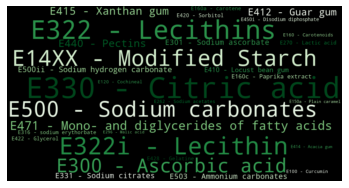

In [286]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=low_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags', nb=30)
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=500, colormap='Greens')
)
to_png(f'E1.5_wordcloud_low_risk_additives')

#### Wordcloud - ingredients dans processed meat

                  name    freq
5   sodium erythorbate  1999.0
6               épices  1638.0
7     sodium phosphate  1512.0
8     sodium diacetate  1478.0
10                Pork  1398.0
11      sodium nitrite  1276.0
12              spices  1181.0
13     arômes naturels  1099.0
14     sodium nitrite.  1092.0
16    sirop de glucose  1010.0
"E1-5_wordcloud_processed_meat_ingredients.png"


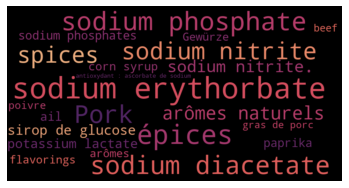

In [287]:
def filter_exclude(df:pd.DataFrame, exclude_words=[]):
    data= df.copy()
    data['name']=data['name'].str.strip()
    return data[~data['name'].isin(exclude_words)]

(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(top_n_freq, 'ingredients_text',nb=30)
 .rename(columns={'ingredients_text':'name'})
 .pipe(filter_exclude, exclude_words='eau,water,salt,sel,sugar,sucre,Dextrose,dextrose,other'.split(','))
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=500, colormap='flare')
)
to_png(f'E1.5_wordcloud_processed_meat_ingredients')

#### Wordcloud - Nova group 4 main categories

                  name   freq
0               Snacks  14526
1             Biscuits   9292
2      Confectioneries   8578
3               Sauces   6904
4      Frozen desserts   6292
5         Frozen foods   5336
6              Cheeses   5319
7                Cakes   5205
8               Breads   4925
9  Sweetened beverages   4023
"E1-5_wordcloud_nova_4_main_categories.png"


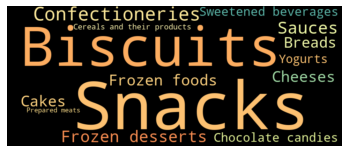

In [288]:
(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(top_n_freq,'main_category_en', nb=14, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
  .pipe(plot_wordcloud, height=400, colormap='Spectral')
)
to_png(f'E1.5_wordcloud_nova_4_main categories')

#### Wordcloud - (main categories) de produits qui contient sodium nitrite

              name  freq
0   Prepared meats  1992
1         Sausages  1308
2       White hams   962
3           Pizzas   947
4     Frozen foods   494
5           Snacks   399
6       Sandwiches   363
7           Salami   341
8  Smoked sausages   315
9             Hams   282
"E1-5_wordcloud_sodium_nitrite_main_categories.png"


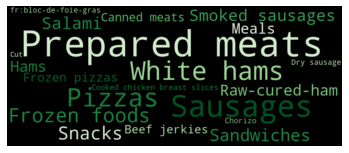

In [289]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e250')
 .pipe(top_n_freq,'main_category_en', nb=20, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=400, colormap='Greens')
)
to_png(f'E1.5_wordcloud_sodium_nitrite_main categories')

                  name  freq
0                Cakes  2228
1               Sauces  1258
2              Yogurts   711
3              Cheeses   682
4             Pastries   651
5                 Dips   651
6      Frozen desserts   566
7  Sweetened beverages   544
8             Biscuits   518
9               Breads   429
"E1-5_wordcloud_potassium_sorbate_main_categories.png"


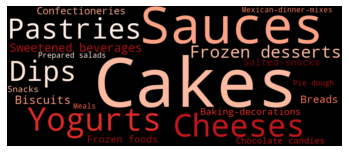

In [290]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e202')
 .pipe(top_n_freq,'main_category_en', nb=20, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=400, colormap='Reds')
)
to_png(f'E1.5_wordcloud_potassium_sorbate_main categories')

                 name  freq
0               Cakes  2656
1            Biscuits  1520
2        Frozen foods   911
3            Pastries   711
4               Meals   416
5           Pie dough   360
6          Madeleines   352
7              Snacks   318
8  Chocolate biscuits   310
"E1-5_wordcloud_diphosphates_main_categories.png"


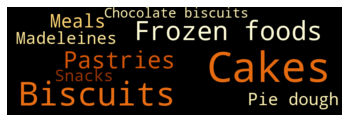

In [291]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e450')
 .pipe(top_n_freq,'main_category_en', nb=9, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=310,colormap='YlOrBr')
)
to_png(f'E1.5_wordcloud_diphosphates_main categories')

              name  freq
0  Frozen desserts  3397
1     Frozen foods   655
2          Cheeses   617
3            Cakes   604
4            Milks   519
5       Ice creams   493
6        Beverages   485
7   Prepared meats   461
8          Yogurts   435
"E1-5_wordcloud_carrageenan_main_categories.png"


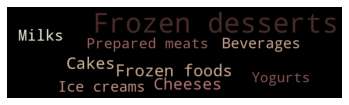

In [292]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e407')
 .pipe(top_n_freq,'main_category_en', nb=9, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=260, colormap='pink')
)
to_png(f'E1.5_wordcloud_carrageenan_main categories')

                         name  freq
0             Confectioneries  3666
1                    Biscuits   968
2                      Snacks   964
3                       Cakes   876
4             Frozen desserts   761
5  Cereals and their products   394
6           Chocolate candies   356
7          Baking-decorations   307
"E1-5_wordcloud_brilliant_blue_main_categories.png"


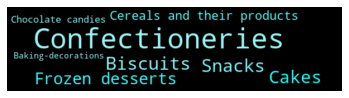

In [293]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e133')
 .pipe(top_n_freq,'main_category_en', nb=8, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=150, width=600, colormap=sns.light_palette("cyan", as_cmap=True))
)
to_png(f'E1.5_wordcloud_brilliant_blue_main categories')